Nothing changed below, as was from Kathrin
## Goerlitz Household PV Data

General information
- continuous daily data since 2005-05-18
- location: 02827 Goerlitz, Germany
- 3 parties on a single rooftop measured separately
- different number of panels:
    - S: 8 panels
    - W: 14 panels
    - H: 44 panels
- important: measurement device was exchanged (26.08.2021 to 27.08.2012)
    - here: counts start at zero again

Table Content
- relevant data "Gesamt-Leistung" = cumulative energy production
- other columns can be discarded and recalculated

## Preparations

In [1]:
# !pip install missingno

In [2]:
# load required packages
from IPython.display import display
from datetime import datetime
import matplotlib.pyplot as plt
import scipy.stats as stats
import missingno as msno
import seaborn as sns
import pandas as pd
import numpy as np
import sys
import os

# general modelling packages
sys.path.insert(0, '..') # required to import models.tools
from models.tools import show_info, add_date_features, compute_importance
# other available tools: get_alerts, dump_missing, parse_xml, plot_correlation, drop_na_and_zeros, get_common_index
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# classifier packages
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier

# metrics packages
from sklearn.metrics import roc_curve, roc_auc_score, ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import recall_score, f1_score

# neural network packages
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras import metrics

import keras 
from keras.models import Sequential # intitialize the ANN
from keras.layers import Dense, Activation, Dropout      # create layers

In [3]:
# general settings
RSEED = 42
np.random.seed(RSEED)
tf.random.set_seed(RSEED)

# plt.style.use("ggplot")

In [4]:
# !pip install --upgrade pip
# !pip install xgboost==1.7.5
# !pip install keras
# !pip install tensorflow


## Functions

In [5]:
# plotting to evaluate classification results
def plot_confusion_matrix(y_true, y_pred, title=""):
    """plot confusion matrix"""

    # calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # customize output image
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    fig, ax = plt.subplots(figsize=(3,3))
    disp.plot(ax=ax)
    disp.ax_.set_title(title)
    plt.show()

def plot_roc_curve(y_train, y_train_pred, y_test, y_test_pred):
    """plot ROC curve for train and test data"""

    # calculate require values for ROC curve
    fpr_model1, tpr_model1, thresholds_model1 = roc_curve(y_train, y_train_pred)
    fpr_model2, tpr_model2, thresholds_model2 = roc_curve(y_test, y_test_pred)
    auc_model1 = roc_auc_score(y_train, y_train_pred)
    auc_model2 = roc_auc_score(y_test, y_test_pred)

    # customize output image
    plt.subplots(figsize=(4,4))
    plt.plot(fpr_model1, tpr_model1,'r-',label = 'Train AUC: %.3f'%auc_model1)
    plt.plot(fpr_model2,tpr_model2,'b--', label= 'Test AUC: %.3f'%auc_model2)
    plt.plot([0,1],[0,1],'k-',label='random')
    plt.plot([0,0,1,1],[0,1,1,1],'g-',label='perfect')
    plt.legend()
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

def plot_precision_recall_curve(X_train, X_test, y_train, y_test, model):
    """plot precision recall curve for train and test data"""

    # calculate class probabilities
    try:
        # for conventional models (log reg, RF, XGboost, ...)
        y_pred_proba = model.predict_proba(X_test) 
        y_pred_proba2 = model.predict_proba(X_train)
    except:
        # reshaping required in case of neural network
        # needs two columns which sum up to one - as np array
        y_pred_proba = model.predict(X_test)
        y_pred_proba = pd.DataFrame(y_pred_proba.T[0])
        y_pred_proba.columns = ["A"]
        y_pred_proba["B"] = 1-y_pred_proba["A"]
        y_pred_proba = np.array(y_pred_proba)

        y_pred_proba2 = model.predict(X_train)
        y_pred_proba2 = pd.DataFrame(y_pred_proba2.T[0])
        y_pred_proba2.columns = ["A"]
        y_pred_proba2["B"] = 1-y_pred_proba2["A"]
        y_pred_proba2 = np.array(y_pred_proba2)
        
    #retrieve probability of being 1(in second column of y_pred_proba)
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba[:, 1]) 
    precision2, recall2, thresholds2 = precision_recall_curve(y_train, y_pred_proba2[:, 1]) 

    # customize output image
    plt.subplots(figsize=(4,4))
    plt.title("Precision-Recall vs Threshold Chart")
    plt.plot(thresholds2, precision2[: -1], "b--", label="Precision Train")
    plt.plot(thresholds, precision[: -1], "b-", label="Precision Test")
    plt.plot(thresholds2, recall2[: -1], "r--", label="Recall Train")
    plt.plot(thresholds, recall[: -1], "r-", label="Recall Test")
    plt.ylabel("Precision, Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper center")
    plt.ylim([0,1])
    plt.show()

def evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False):
    """evaluate model with metrics and plots"""
    
    # predict on train and test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    if neuralnet: # probabilities predicted
        y_train_pred = y_train_pred.round(0)
        y_test_pred = y_test_pred.round(0)

    # calculate metrics
    print("Recall Train:  ", recall_score(y_train, y_train_pred))
    print("F1 Score Train:", f1_score(y_train, y_train_pred))
    print("AUC Train:     ", roc_auc_score(y_train, y_train_pred))
    print("Recall Test:  ", recall_score(y_test, y_test_pred))
    print("F1 Score Test:", f1_score(y_test, y_test_pred))
    print("AUC Test:     ", roc_auc_score(y_test, y_test_pred))

    # plots for model evaluation
    plot_confusion_matrix(y_train, y_train_pred, title="Training")
    plot_confusion_matrix(y_test, y_test_pred, title="Test")
    plot_roc_curve(y_train, y_train_pred, y_test, y_test_pred)
    plot_precision_recall_curve(X_train, X_test, y_train, y_test, model)

    # evaluate model importance
    try:
        compute_importance(model, X_test, y_test, rseed=RSEED, top=10)
    except:
        print("Couldn't extract feature importance!")

In [6]:
def plot_ann_metrics(history):
    """create plots for evaluation metrics tracked while training the network"""
    
    # summarize history for accuracy
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5,7), sharex=True)
    f1 = ax1.plot(history.history['accuracy'])
    ax1.plot(history.history['val_accuracy'])
    ax1.set_title('model accuracy')
    ax1.set_ylabel('accuracy')
    ax1.set_xlabel('epoch')
    ax1.legend(['train', 'validation'], loc='lower right')
    # plt.show()

    # summarize history for area under the ROC curve
    ax2.plot(history.history['auc'])
    ax2.plot(history.history['val_auc'])
    ax2.set_title('model AUC')
    ax2.set_ylabel('AUC')
    ax2.set_xlabel('epoch')
    ax2.legend(['train', 'validation'], loc='lower right')
    plt.tight_layout()
    plt.show()

    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    metrics = ['loss', 'accuracy', 'precision', 'recall', "auc"]
    plt.subplots(figsize=(8,8), sharex=True)
    # plot individual metrics as subplots
    for n, metric in enumerate(metrics):
        try:
            name = metric.replace("_"," ").capitalize()
            plt.subplot(3,2,n+1)
            plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
            plt.plot(history.epoch, history.history['val_'+metric],
                    color=colors[0], linestyle="--", label='Test')
            plt.xlabel('Epoch')
            plt.ylabel(name)
            if metric == 'loss':
                plt.ylim([0, plt.ylim()[1]])
            elif metric == 'auc':
                plt.ylim([0.5,1])
            else:
                plt.ylim([0,1])

            plt.legend()
        except:
            pass
    plt.tight_layout()
    plt.show()

In [7]:
def eda_count_plot(df, fea_dict, fea_list, hh):
    """plot multiple count plots for EDA"""

    # Set default font size
    plt.rcParams.update({'font.size': 10})

    days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

    # plot specific features as subplots
    fig, ax = plt.subplots(1, len(fea_list), figsize=(12,3))
    idx = 0
    for feature in fea_list:
        # focus on "pv"
        target_variable = list(df.columns[df.columns.str.contains("_pv")])[0]
        df_ = df.groupby([feature])[target_variable]
        
        # customize plots 
        plot_kind, xlabel, ylabel, title = fea_dict[feature]
        if feature in ['month', 'week', 'day']:
            df_.mean().plot(kind=plot_kind, legend=False, ax=ax[idx], linewidth=2.5)\
                .set(#title=f"{title}\n({hh})",
                     xlabel=xlabel, ylabel=ylabel)
        elif feature in ['weekday']:
            df_.mean().plot(kind=plot_kind, legend=False, ax=ax[idx], linewidth=2.5)\
                .set(#title=f"{title}\n({hh})",
                     xlabel=xlabel, ylabel=ylabel)
            ax[idx].set_xticklabels(days)
            plt.xticks(rotation=45)
        else: # for "year", "hour"
            df_.sum().plot(kind=plot_kind, legend=False, ax=ax[idx], linewidth=2.5)\
                .set(#title=f"{title}\n({hh})",
                     xlabel=xlabel, ylabel=ylabel)
        idx += 1
        
    plt.tight_layout()
    plt.show()

def plot_corr(df, numeric_only=True, mask=False, filter_threshold=0.0):
    """plot correlation matrix as heatmap"""

    # customize plot
    fig, ax = plt.subplots(figsize=(10,10))
    ax.tick_params(axis='x', rotation=90)

    # filter low correlation values
    corr_matrix = df.corr(numeric_only=numeric_only)
    filter = (corr_matrix >= filter_threshold) | (corr_matrix <= -filter_threshold)

    # display as triangle or square
    if mask: # triangle
        mask = np.triu(corr_matrix)
    else: # square
        mask = None
    
    # plot heatmao
    sns.heatmap(corr_matrix[filter], annot=True, square=True, fmt=".2f", 
                        linewidths=.5, annot_kws={"fontsize":9}, 
                        vmax=1, vmin=-1, cmap='YlGnBu', cbar=False,
                        mask=mask,)
    plt.show()


## Load data

In [8]:
# Read the csv
# extract cumulative data and date only
df_raw = pd.read_csv(
    # "../data/households/Goerlitz/PV_Goerlitz_02827.csv",
    "../data/pv_households/GR/PV_Goerlitz_02827.csv",
    sep=";",
    thousands=",",
    usecols=[
        "Unnamed: 0",
        "S Gesamt-Leistung",
        "W Gesamt-Leistung",
        "H Gesamt-Leistung",
    ],
).rename(
    columns={
        "Unnamed: 0": "date",
        "S Gesamt-Leistung": "group1_pv",
        "W Gesamt-Leistung": "group2_pv",
        "H Gesamt-Leistung": "group3_pv",
    }
)
# Strip the date strings and convert them to `datetime`
df_raw["date"] = pd.to_datetime(df_raw["date"].str.strip(), format="%d.%m.%Y")
# Set date as the index
df_raw.set_index("date", inplace=True)
df_raw.shape

(6630, 3)

### General view - plot

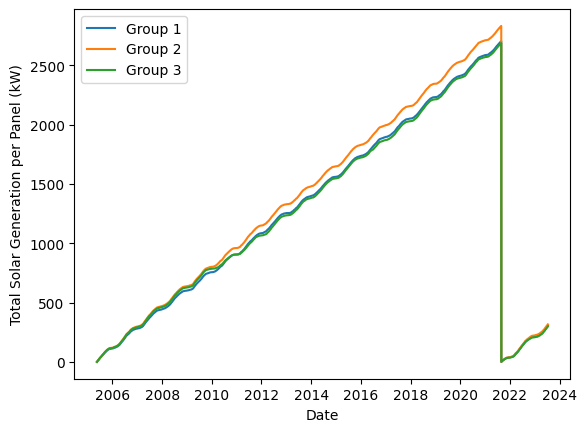

In [9]:
# inspect
sns.lineplot(x=df_raw.index, y=df_raw["group1_pv"]/8, label="Group 1")
sns.lineplot(x=df_raw.index, y=df_raw["group2_pv"]/14, label="Group 2")
sns.lineplot(x=df_raw.index, y=df_raw["group3_pv"]/44, label="Group 3")

plt.xlabel('Date')
plt.ylabel('Total Solar Generation per Panel (kW)')

plt.legend()
plt.show()

### Handle discontinuities

In [10]:
# Find the weird data
filter = (df_raw['group1_pv'].diff() < 0) | (df_raw['group2_pv'].diff() < 0) | (df_raw['group3_pv'].diff() < 0)
df_raw[filter]

,group1_pv,group2_pv,group3_pv
date,,,
2021-08-27,4.0,8.0,26.0


In [11]:
# Handle weirds

# Split the data df_raw into two parts
df1 = df_raw.query('index < "27.08.2021"')
df2 = df_raw.query('index >= "27.08.2021"')

# Calculate the daily production
df1 = df1.diff()
df2 = df2.diff()
print("The header of df1 is:")
display(df1.head())
print("The header of df2 is:")
display(df2.head())

# Fill the first row of nan with 0
df1.iloc[0] = 0
df2.iloc[0] = 0

# Output
print("The header after filling with 0 of df1 is:")
display(df1.head())
print("The header after filling with 0 of df2 is:")
display(df2.head())

# 
df = pd.concat([df1, df2], axis=0)
display(df.head())
display(df.index)

The header of df1 is:


,group1_pv,group2_pv,group3_pv
date,,,
2005-05-18,NaN,NaN,NaN
2005-05-19,6.2,11.4,32.2
2005-05-20,7.0,13.6,42.6
2005-05-21,6.2,11.4,36.2
2005-05-22,4.4,8.0,25.0


The header of df2 is:


,group1_pv,group2_pv,group3_pv
date,,,
2021-08-27,NaN,NaN,NaN
2021-08-28,3.0,5.0,14.0
2021-08-29,4.0,8.0,23.0
2021-08-30,3.0,6.0,18.0
2021-08-31,1.0,1.0,5.0


The header after filling with 0 of df1 is:


,group1_pv,group2_pv,group3_pv
date,,,
2005-05-18,0.0,0.0,0.0
2005-05-19,6.2,11.4,32.2
2005-05-20,7.0,13.6,42.6
2005-05-21,6.2,11.4,36.2
2005-05-22,4.4,8.0,25.0


The header after filling with 0 of df2 is:


,group1_pv,group2_pv,group3_pv
date,,,
2021-08-27,0.0,0.0,0.0
2021-08-28,3.0,5.0,14.0
2021-08-29,4.0,8.0,23.0
2021-08-30,3.0,6.0,18.0
2021-08-31,1.0,1.0,5.0


,group1_pv,group2_pv,group3_pv
date,,,
2005-05-18,0.0,0.0,0.0
2005-05-19,6.2,11.4,32.2
2005-05-20,7.0,13.6,42.6
2005-05-21,6.2,11.4,36.2
2005-05-22,4.4,8.0,25.0


DatetimeIndex(['2005-05-18', '2005-05-19', '2005-05-20', '2005-05-21',
               '2005-05-22', '2005-05-23', '2005-05-24', '2005-05-25',
               '2005-05-26', '2005-05-27',
               ...
               '2023-07-03', '2023-07-04', '2023-07-05', '2023-07-06',
               '2023-07-07', '2023-07-08', '2023-07-09', '2023-07-10',
               '2023-07-11', '2023-07-12'],
              dtype='datetime64[ns]', name='date', length=6630, freq=None)

In [12]:
# Find anomaly in data
filter = (df['group1_pv'] < 0) | (df['group2_pv'] < 0) | (df['group3_pv'] < 0)
df[filter]

,group1_pv,group2_pv,group3_pv
date,,,


In [13]:
# replace anomalies
df.loc[df['group1_pv'] < 0, 'group1_pv'] = 0
df.loc[df['group2_pv'] < 0, 'group2_pv'] = 0
df.loc[df['group3_pv'] < 0, 'group3_pv'] = 0

In [14]:
idx_maintenance_list = [
    "09.06.2011", # H repair - group 3
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    "27.06.2016", # H repair - group 3
    # "26.08.2021", # counter exchanged
    ]
df_ = df[df.index.isin(idx_maintenance_list)].copy()

# calculate production per panel
df_["group1_pv"] = df_["group1_pv"]/8
df_["group2_pv"] = df_["group2_pv"]/14
df_["group3_pv"] = df_["group3_pv"]/44
df_

,group1_pv,group2_pv,group3_pv
date,,,
2011-09-06,0.8125,0.857143,0.845455
2013-02-17,0.0000,0.121429,0.054545
2013-10-17,0.3000,0.307143,0.236364
2016-06-27,0.6000,0.607143,0.465909


In [15]:
# from scipy.stats import f_oneway

# f_val, p_val = f_oneway(df['group1_pv']/8, df['group2_pv']/14, df['group3_pv']/44)

# print("F-value:", f_val)
# print("p-value:", p_val)


In [16]:
# df_ = df.copy()
# df_["group1_pv"] = df_["group1_pv"]/8
# df_["group2_pv"] = df_["group2_pv"]/14
# df_["group3_pv"] = df_["group3_pv"]/44

# df_.head()

In [17]:
# from statsmodels.stats.multicomp import pairwise_tukeyhsd

# # Reshape the data
# melted_df = pd.melt(df_)

# posthoc = pairwise_tukeyhsd(
#     endog=melted_df['value'],  # data
#     groups=melted_df['variable'],  # groups
#     alpha=0.05  # significance level
# )

# print(posthoc)


## EDA 

### Energy Production for the Groups

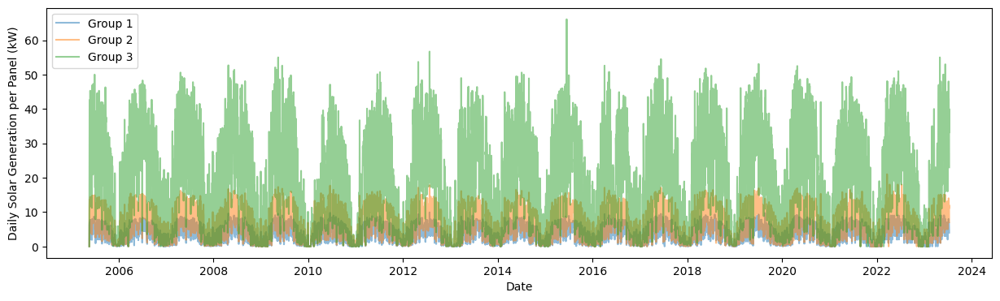

In [18]:
# inspect cumulative energy production
plt.subplots(figsize=(15,4))
sns.lineplot(x=df.index, y=df["group1_pv"], label="Group 1", alpha=0.5) # 8
sns.lineplot(x=df.index, y=df["group2_pv"], label="Group 2", alpha=0.5) # 14
sns.lineplot(x=df.index, y=df["group3_pv"], label="Group 3", alpha=0.5) # 44

plt.xlabel('Date')
plt.ylabel('Daily Solar Generation per Panel (kW)')

plt.legend()
plt.show()

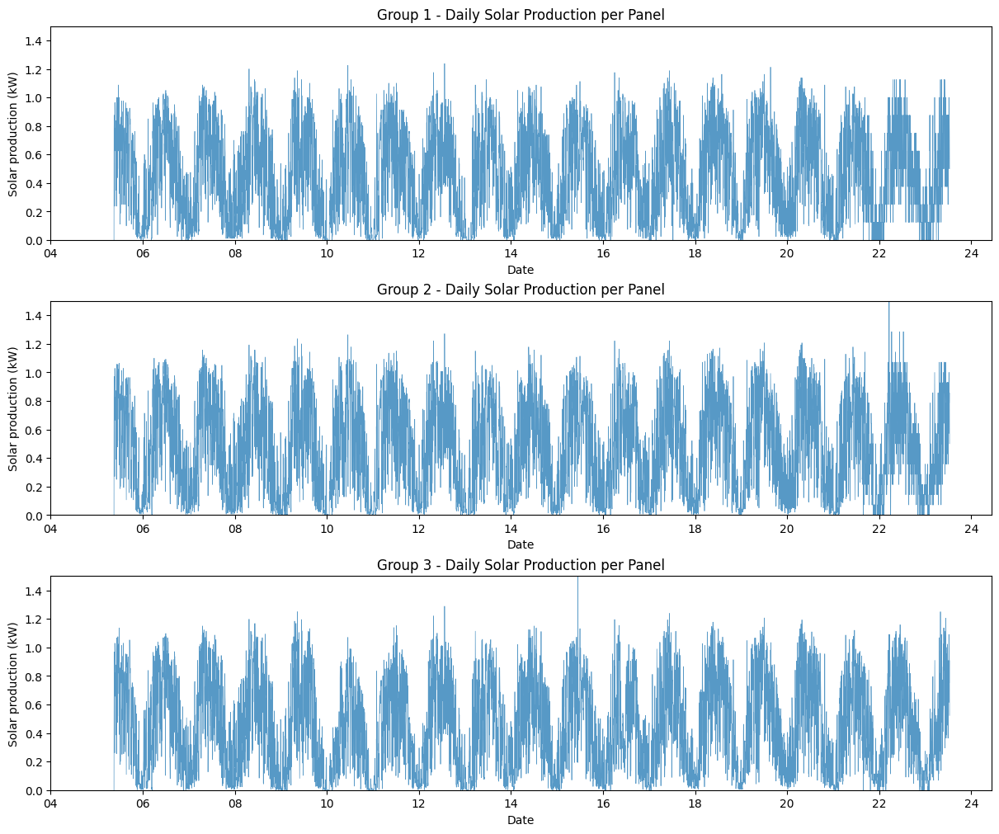

In [19]:
# inspect energy production per panel separately
pv_dict = {"Group 1":["group1_pv", 8], "Group 2":["group2_pv", 14], "Group 3":["group3_pv", 44]}
row = len(pv_dict)
_, axes = plt.subplots(row,1, figsize=(12, 10), constrained_layout=True, dpi=100,)


for (key, _ ), ax in zip(pv_dict.items(), axes):
    pv, num_panel = pv_dict[key]
    df_ = df[[pv]].copy()
    # Filter out the data of the common time span
    # df_ = df_.loc[common_idx, :]

    

    # ax.plot(df_.index, df_[['pv', 'load']], label=["PV", "Load"], alpha=0.75)
    ax.plot(df_.index, df_[[pv]]/num_panel, label=["PV"], alpha=0.75, linewidth=0.5)

    ax.set(
        ylim = (0, 1.5),
        title = f"{key} - Daily Solar Production per Panel",
    )

    # Get the existing labels
    labels = [item.get_text() for item in ax.get_xticklabels()]

    # Modify the labels
    new_labels = [label.replace('20', '', 1) for label in labels]

    # Set the new labels
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(new_labels)

    #print(ax.get_xticklabels())

    ax.set_xlabel("Date")
    ax.set_ylabel("Solar production (kW)")

    #plt.legend()

plt.show()

### Repair of panels

In [20]:
df.head()

,group1_pv,group2_pv,group3_pv
date,,,
2005-05-18,0.0,0.0,0.0
2005-05-19,6.2,11.4,32.2
2005-05-20,7.0,13.6,42.6
2005-05-21,6.2,11.4,36.2
2005-05-22,4.4,8.0,25.0


In [21]:
show_info(df)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,6630,0.0,520,...
1,group2_pv,float64,6630,0.0,872,...
2,group3_pv,float64,6630,0.0,1743,...


In [22]:
# Add a new feature "panel_age"
df["panel_age"] = (df.index - df.index[0]).days / 365.25
df["panel_age"] = df["panel_age"].apply(np.floor).astype("int")

df.head()

,group1_pv,group2_pv,group3_pv,panel_age
date,,,,
2005-05-18,0.0,0.0,0.0,0
2005-05-19,6.2,11.4,32.2,0
2005-05-20,7.0,13.6,42.6,0
2005-05-21,6.2,11.4,36.2,0
2005-05-22,4.4,8.0,25.0,0


In [23]:
df_monthly = df.resample("1M").sum().drop(columns=["panel_age"])

# Add more date features
df_monthly = add_date_features(df_monthly)
df_monthly.week = df_monthly.week.astype(int) # otherwise warning when calculating mode

df_monthly["group1_pv"] = df_monthly["group1_pv"]/8
df_monthly["group2_pv"] = df_monthly["group2_pv"]/14
df_monthly["group3_pv"] = df_monthly["group3_pv"]/44

show_info(df_monthly)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,219,0.0,216,...
1,group2_pv,float64,219,0.0,216,...
2,group3_pv,float64,219,0.0,217,...
3,year,int32,219,0.0,19,...
4,month,int32,219,0.0,12,...
5,week,int64,219,0.0,24,...
6,weekday,int32,219,0.0,7,"{1: 32, 2: 32, 0: 32, 3: 31, 4: 31, 5: 31, 6: 30}"
7,day_of_year,int32,219,0.0,23,...


### Visualizations - Monthly

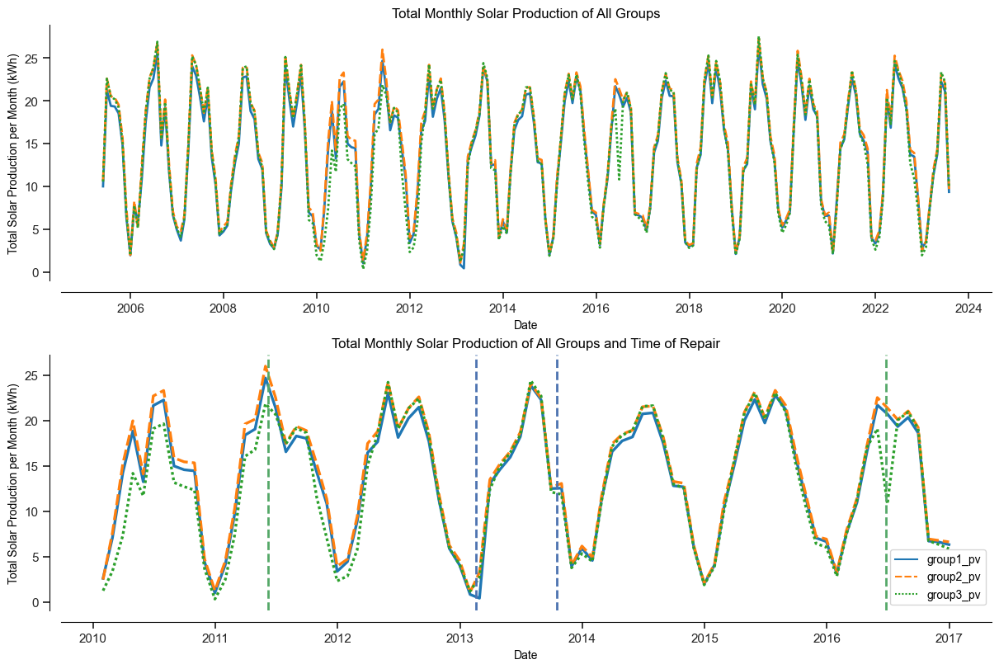

In [24]:
idx_maintenance_g1 = [
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    ]
idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]
lw = 2 # line width

# plotting
_, (ax1,ax2) = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True, dpi=100,)
# plot solar production
sns.lineplot(ax=ax1, linewidth=lw,
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])

# plot zoomed solar production
sns.lineplot(ax=ax2, linewidth=lw*1.2,
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.12.31"'))

# plot lines for repairs
for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C0", linestyle='--', lw=2)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C2", linestyle='--', lw=2)

# customize plots
ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Month (kWh)",
    title="Total Monthly Solar Production of All Groups",
)
ax2.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Month (kWh)",
    title = "Total Monthly Solar Production of All Groups and Time of Repair",
)

sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
# sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white', 'axes.grid': True})
sns.set_style("white")
sns.despine(offset=10, trim=False)
# ax1.grid(False)
# ax2.grid(False)
# sns.despine()
plt.show()

### Visualization - Weekly

In [25]:
df_weekly = df.resample("1W").sum().drop(columns=["panel_age"])

# Add more date features
df_weekly = add_date_features(df_weekly)
df_weekly.week = df_weekly.week.astype(int) # otherwise warning when calculating mode

df_weekly["group1_pv"] = df_weekly["group1_pv"]/8
df_weekly["group2_pv"] = df_weekly["group2_pv"]/14
df_weekly["group3_pv"] = df_weekly["group3_pv"]/44

show_info(df_weekly)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,948,0.0,643,...
1,group2_pv,float64,948,0.0,711,...
2,group3_pv,float64,948,0.0,861,...
3,year,int32,948,0.0,19,...
4,month,int32,948,0.0,12,...
5,week,int64,948,0.0,53,...
6,weekday,int32,948,0.0,1,{6: 948}
7,day_of_year,int32,948,0.0,365,...


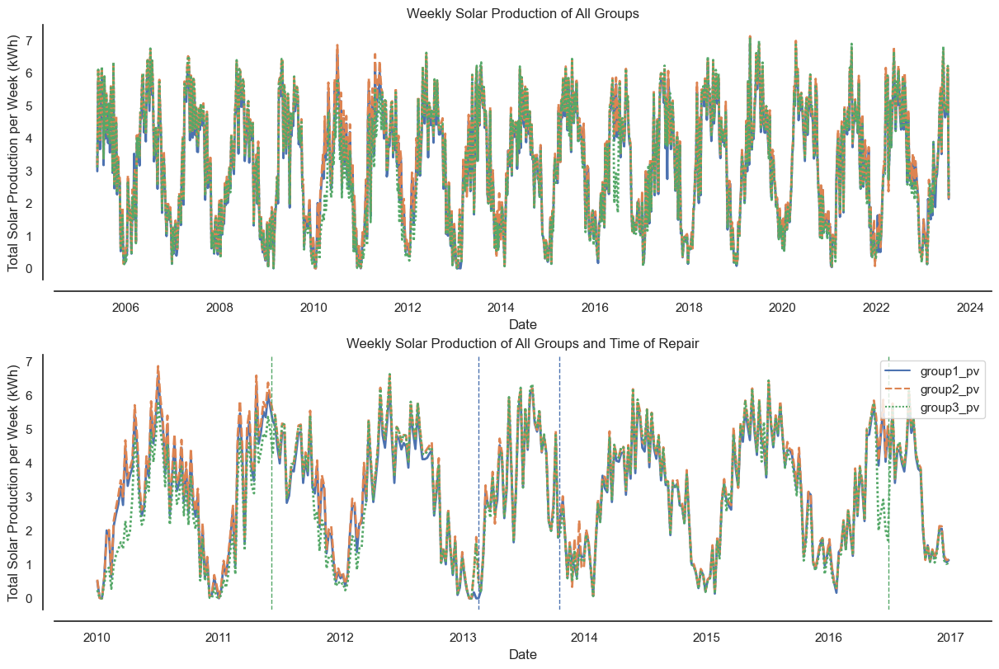

In [26]:
# plt.style.use('default')
# plt.style.use('ggplot')

idx_maintenance_g1 = [
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    ]
idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]

lw = 2 # line width

# plotting
_, (ax1,ax2) = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True, dpi=100,)
# plot solar production
sns.lineplot(ax=ax1, linewidth=lw,
             data=df_weekly[["group1_pv", "group2_pv", "group3_pv"]])

# plot zoomed solar production
sns.lineplot(ax=ax2, linewidth=lw,
             data=df_weekly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.12.31"'))

# plot lines for repairs
for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C0", linestyle='--', lw=1)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C2", linestyle='--', lw=1)

# customize plots
ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Week (kWh)",
    title="Weekly Solar Production of All Groups",
)
ax2.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Week (kWh)",
    title = "Weekly Solar Production of All Groups and Time of Repair",
)

sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

#### Weekly with Rounding

In [27]:
df_daily = df.copy().drop(columns=["panel_age"])

df_daily["group1_pv"] = (df_daily["group1_pv"]/8).round(3)
df_daily["group2_pv"] = (df_daily["group2_pv"]/14).round(3)
df_daily["group3_pv"] = (df_daily["group3_pv"]/44).round(3)
df_daily.head()

,group1_pv,group2_pv,group3_pv
date,,,
2005-05-18,0.000,0.000,0.000
2005-05-19,0.775,0.814,0.732
2005-05-20,0.875,0.971,0.968
2005-05-21,0.775,0.814,0.823
2005-05-22,0.550,0.571,0.568


In [28]:
df_weekly = df_daily.resample("1W").sum()

# Add more date features
df_weekly = add_date_features(df_weekly)
df_weekly.week = df_weekly.week.astype(int) # otherwise warning when calculating mode

show_info(df_weekly)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,948,0.0,705,...
1,group2_pv,float64,948,0.0,800,...
2,group3_pv,float64,948,0.0,896,...
3,year,int32,948,0.0,19,...
4,month,int32,948,0.0,12,...
5,week,int64,948,0.0,53,...
6,weekday,int32,948,0.0,1,{6: 948}
7,day_of_year,int32,948,0.0,365,...


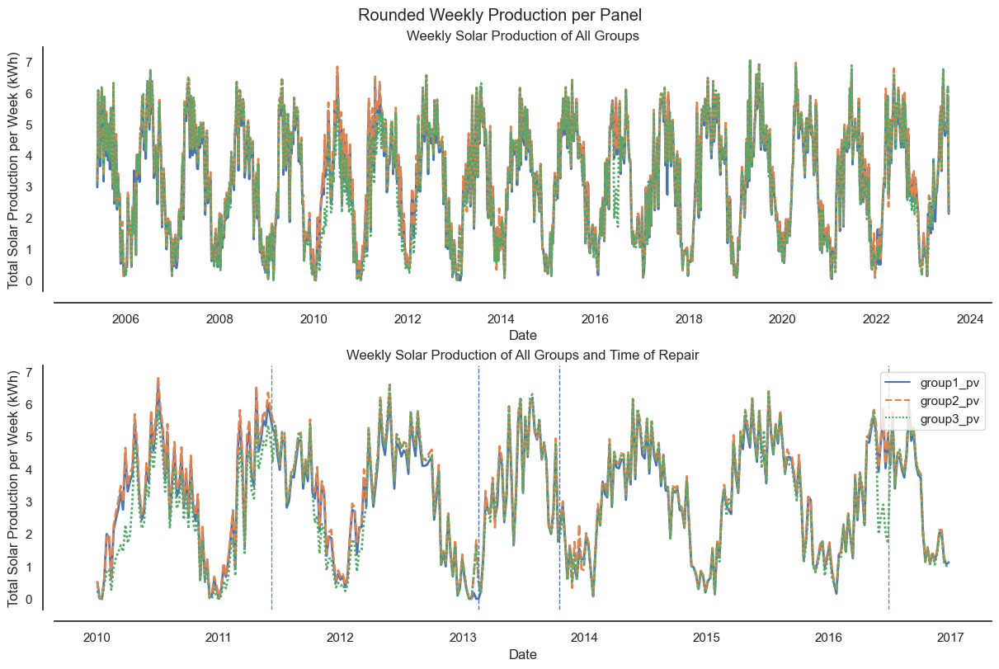

In [29]:
idx_maintenance_g1 = [
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    ]
idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]

lw = 2 # line width

# plotting
_, (ax1,ax2) = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True, dpi=100,)
# plot solar production
sns.lineplot(ax=ax1, linewidth=lw,
             data=df_weekly[["group1_pv", "group2_pv", "group3_pv"]])

# plot zoomed solar production
sns.lineplot(ax=ax2, linewidth=lw,
             data=df_weekly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.12.31"'))

# plot lines for repairs
for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C0", linestyle='--', lw=1)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C2", linestyle='--', lw=1)

# customize plots
ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Week (kWh)",
    title="Weekly Solar Production of All Groups",
)
ax2.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Week (kWh)",
    title = "Weekly Solar Production of All Groups and Time of Repair",
)

plt.suptitle("Rounded Weekly Production per Panel")
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

In [30]:
df_monthly = df_daily.resample("1M").sum()

# Add more date features
df_monthly = add_date_features(df_monthly)
df_monthly.week = df_monthly.week.astype(int) # otherwise warning when calculating mode

show_info(df_monthly)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,219,0.0,218,...
1,group2_pv,float64,219,0.0,219,...
2,group3_pv,float64,219,0.0,219,...
3,year,int32,219,0.0,19,...
4,month,int32,219,0.0,12,...
5,week,int64,219,0.0,24,...
6,weekday,int32,219,0.0,7,"{1: 32, 2: 32, 0: 32, 3: 31, 4: 31, 5: 31, 6: 30}"
7,day_of_year,int32,219,0.0,23,...


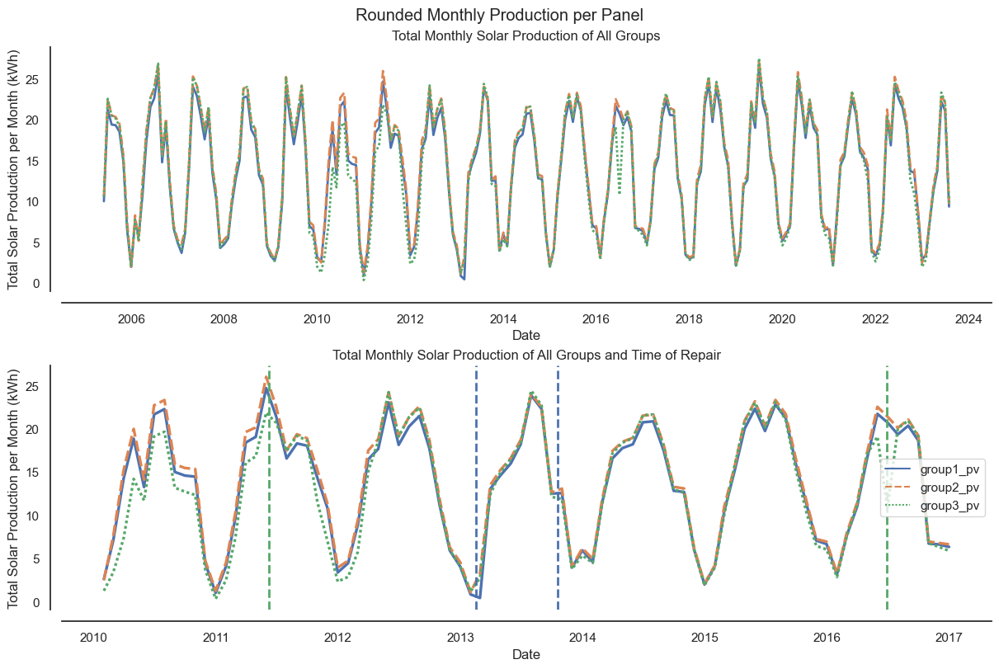

In [31]:
idx_maintenance_g1 = [
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    ]
idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]
lw = 2 # line width

# plotting
_, (ax1,ax2) = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True, dpi=100,)
# plot solar production
sns.lineplot(ax=ax1, linewidth=lw,
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])

# plot zoomed solar production
sns.lineplot(ax=ax2, linewidth=lw*1.2,
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.12.31"'))

# plot lines for repairs
for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C0", linestyle='--', lw=2)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="C2", linestyle='--', lw=2)

# customize plots
ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Month (kWh)",
    title="Total Monthly Solar Production of All Groups",
)
ax2.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Month (kWh)",
    title = "Total Monthly Solar Production of All Groups and Time of Repair",
)

plt.suptitle("Rounded Monthly Production per Panel")
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

### EDA Plots for Time Features

In [32]:
date_feature_list = ["year", "month", "week", "weekday", "day", "hour", "day_of_year"]

feature_dict = {
    'year': ["bar", "Year", "PV Generation (kWh)", "Total PV Generation for each Year"],
    'month': ["bar", "Month", "PV Generation (kWh)", "Average Total PV Generation over the Month"],
    'week': ["line", "Calendar Week", "PV Generation (kWh)", "Average Total PV Generation for each Calendar Week"],
    'weekday': ["bar", "Calendar Week Day", "PV Generation (kWh)", "Average Total PV Generation for each Calendar Week Day"],
    'day_of_year': ["line", "Date", "PV Generation (kWh)", "Average Total PV Generation for each Calendar Day"],
}

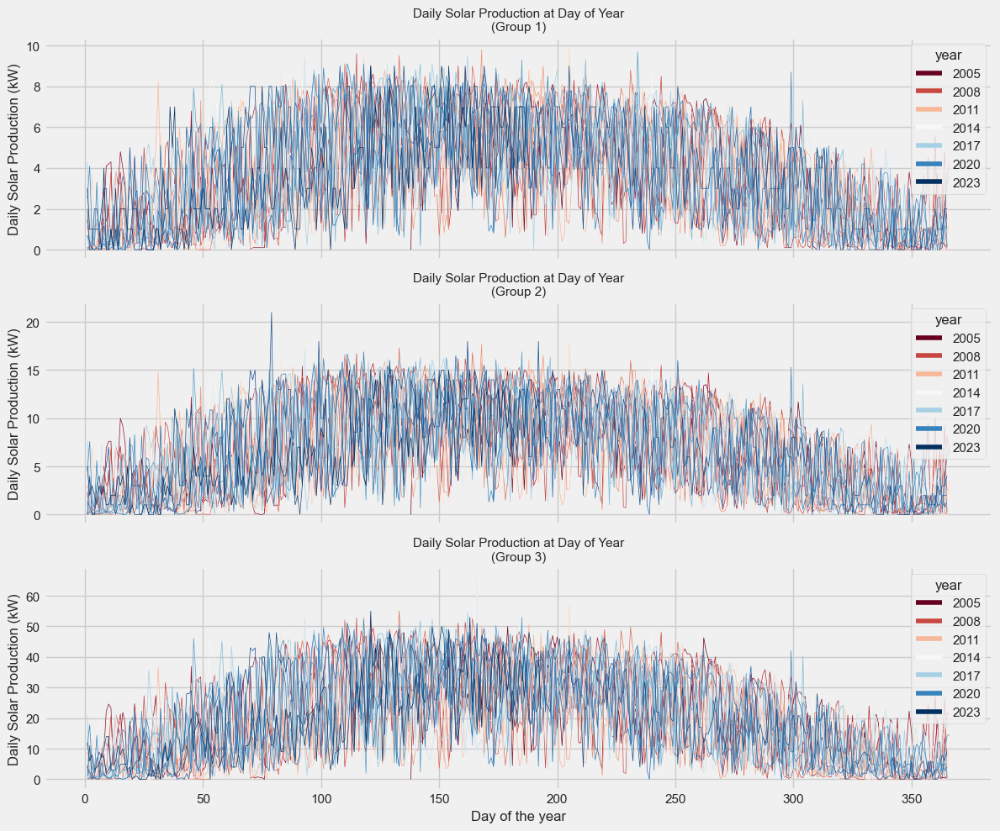

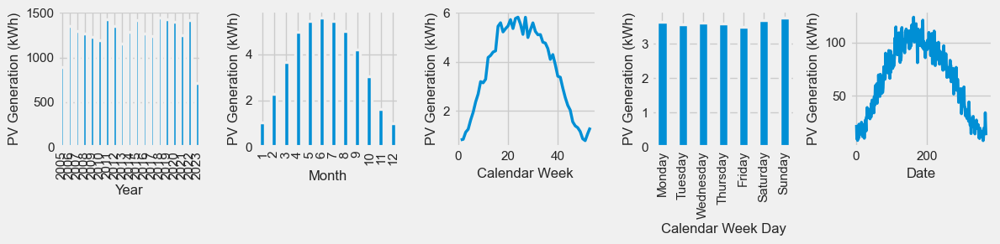

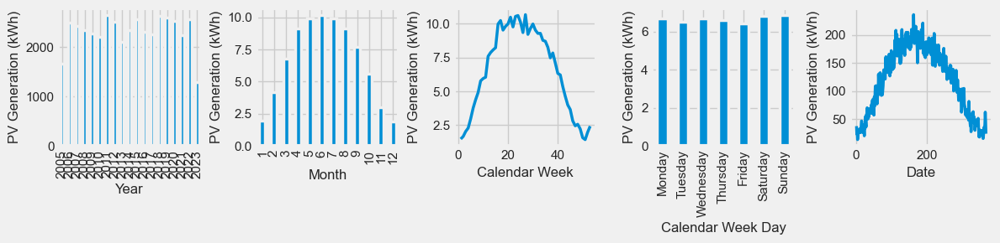

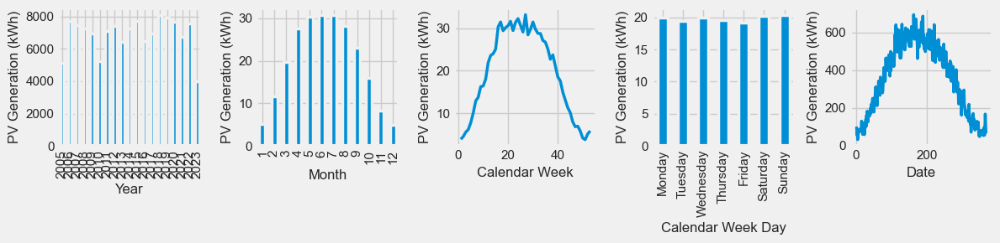

In [33]:
plt.style.use('fivethirtyeight')
plt.rcParams.update({'font.size': 10})

# plot lines for solar production over the year - for each year separately
fig, ax = plt.subplots(3,1, figsize=(12,10), sharex=True)
idx = 0
for key, _ in pv_dict.items():
    #print(f"The EDA feature plots for {hh!r}")

    pv, num_panel = pv_dict[key]
    df_ = df[[pv]].copy()

    # Add new features to dataframe of daily resolution
    df_ = add_date_features(df_)

    # plt.rcParams.update({'font.size': 10})
    sns.lineplot(data=df_, x=df_["day_of_year"], y=df_[pv], hue="year", palette="RdBu", linewidth=0.5, ax=ax[idx]).set(
        ylabel="Daily Solar Production (kW)", xlabel="Day of the year",)
    ax[idx].set_title(f"Daily Solar Production at Day of Year\n({key})", fontsize=11)

    idx += 1

plt.tight_layout()
plt.show()

for key, _ in pv_dict.items():
    pv, num_panel = pv_dict[key]
    df_ = df[[pv]].copy()
    df_ = add_date_features(df_)

    # test whether a column exists or not
    feature_list = [col for col in date_feature_list if col in df_.columns]
    # delete "year" from the list for better statistics
    # feature_list.remove('year')
    
    eda_count_plot(df_, feature_dict, feature_list, key)

In [34]:
show_info(df)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,group1_pv,float64,6630,0.0,520,...
1,group2_pv,float64,6630,0.0,872,...
2,group3_pv,float64,6630,0.0,1743,...
3,panel_age,int64,6630,0.0,19,...


## Classification regarding malfunction

- label data as defective, if production is lower than the other two groups
- here: focus on one group having the most defects: group 3

In [35]:
df.drop(columns="panel_age")
df.head(3)

,group1_pv,group2_pv,group3_pv,panel_age
date,,,,
2005-05-18,0.0,0.0,0.0,0
2005-05-19,6.2,11.4,32.2,0
2005-05-20,7.0,13.6,42.6,0


### Optional Data Transformation

- aim: reduce noise in winter due to low production (and accordingly low precision)
- yet: no clear improvement by any of the approaches regarding modelling

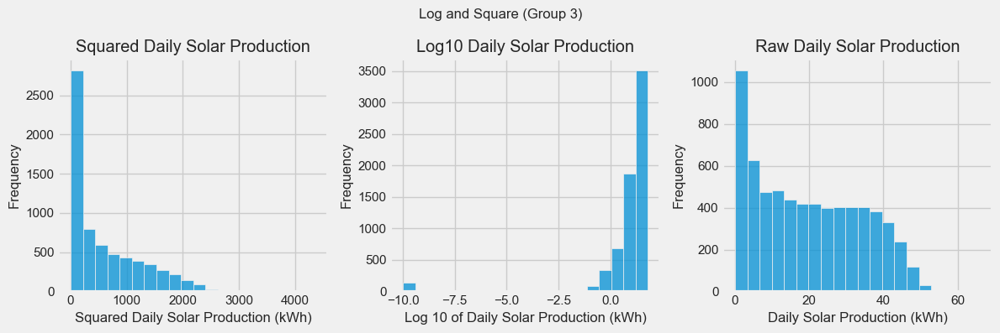

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(12,4))
sns.histplot(x=np.log10(df['group3_pv']+0.0000000001), bins=20, ax=ax2
).set(xlabel="Log 10 of Daily Solar Production (kWh)", ylabel="Frequency", title="Log10 Daily Solar Production")
sns.histplot(x=df['group3_pv'].pow(2), bins=20, ax=ax1
).set(xlabel="Squared Daily Solar Production (kWh)", ylabel="Frequency", title="Squared Daily Solar Production")
sns.histplot(x=df['group3_pv'], bins=20, ax=ax3
).set(xlabel="Daily Solar Production (kWh)", ylabel="Frequency", title="Raw Daily Solar Production")
plt.suptitle("Log and Square (Group 3)")
plt.tight_layout()
plt.show()

/Users/kathse/Documents/NeueFische/4_Capstone/capstone_solar_energy/.venv/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


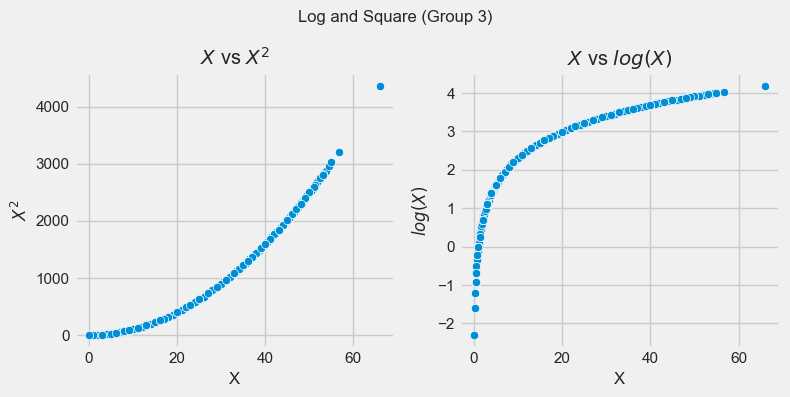

In [37]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,4))
sns.scatterplot(x=df['group3_pv'], y=df['group3_pv'].pow(2), ax=ax1).set(title="$X$ vs $X^2$", ylabel="$X^2$", xlabel="X")
sns.scatterplot(x=df['group3_pv'], y=np.log(df['group3_pv']), ax=ax2).set(title="$X$ vs $log(X)$", ylabel="$log(X)$", xlabel="X")
plt.suptitle("Log and Square (Group 3)")
plt.tight_layout()
plt.show()


In [38]:
# optional transformation of the data 
# to try to reduce the noise in winter 
rounding=None
# rounding="pow"
# rounding="log"
# rounding="orig" # rounding original total measurement
# rounding=1

In [39]:
# convert to production per panel
if rounding == "orig":
    rounding_tag = "_rounded%s" % rounding
    df["group1_pv"] = df["group1_pv"].round(0)/8
    df["group2_pv"] = df["group2_pv"].round(0)/14
    df["group3_pv"] = df["group3_pv"].round(0)/44

elif rounding == "log":
    rounding_tag = "_rounded%s" % rounding
    df["group1_pv"] = np.log(df["group1_pv"]/8)
    df["group2_pv"] = np.log(df["group2_pv"]/14)
    df["group3_pv"] = np.log(df["group3_pv"]/44)

elif rounding == "pow":
    rounding_tag = "_rounded%s" % rounding
    df["group1_pv"] = (df["group1_pv"]/8).pow(2)
    df["group2_pv"] = (df["group2_pv"]/14).pow(2)
    df["group3_pv"] = (df["group3_pv"]/44).pow(2)

else:
    df["group1_pv"] = df["group1_pv"]/8
    df["group2_pv"] = df["group2_pv"]/14
    df["group3_pv"] = df["group3_pv"]/44

    if rounding != None:
        rounding_tag = "_rounded%d" % rounding
        df.group1_pv = df.group1_pv.round(rounding)
        df.group2_pv = df.group2_pv.round(rounding)
        df.group3_pv = df.group3_pv.round(rounding)
    else:
        rounding_tag = ""

# use date as column
df = df.reset_index()

df.head(3)

,date,group1_pv,group2_pv,group3_pv,panel_age
0,2005-05-18,0.000,0.000000,0.000000,0
1,2005-05-19,0.775,0.814286,0.731818,0
2,2005-05-20,0.875,0.971429,0.968182,0


### Calculate Error Metrics

In [40]:
# expected production
df["mean_pv_12"] = 0.5*(df.group1_pv + df.group2_pv)
df["max_pv"] = df[["group1_pv", "group2_pv", "group3_pv"]].values.max(1)

# error compared to mean/max
# absolute = expected - actual
# relative = (expected - actual)/expected
# weighted = (expected - actual)*expected
df["g3_error_abs_mean"] = 0
df["g3_error_rel_mean"] = 0
df["g3_error_abs_max"] = 0
df["g3_error_rel_max"] = 0
for idx in range(len(df)):
    df.loc[idx, "g3_error_abs_mean"] = (df.loc[idx, "mean_pv_12"]-df.loc[idx, "group3_pv"])
    df.loc[idx, "g3_error_abs_max"] = (df.loc[idx, "max_pv"]-df.loc[idx, "group3_pv"])
    if df.loc[idx, "mean_pv_12"] != 0:
        df.loc[idx, "g3_error_rel_mean"] = (df.loc[idx, "mean_pv_12"]-df.loc[idx, "group3_pv"])/df.loc[idx, "mean_pv_12"]
    if df.loc[idx, "max_pv"] != 0:
        df.loc[idx, "g3_error_rel_max"] = (df.loc[idx, "max_pv"]-df.loc[idx, "group3_pv"])/df.loc[idx, "max_pv"]
df["g3_error_weight_mean"] = df.mean_pv_12 * df.g3_error_abs_mean
df["g3_error_weight_max"] = df.max_pv * df.g3_error_abs_max
df['g3_error_cubicabs_mean'] = df.g3_error_abs_mean ** 3
df['g3_error_cubicabs_max'] = df.g3_error_abs_max ** 3

# calculate rolling averages
# 5 days
df['g3_5_day_error_rel_mean'] = df.g3_error_rel_mean.rolling(5).mean()
df['g3_5_day_error_abs_mean'] = df.g3_error_abs_mean.rolling(5).mean()
df['g3_5_day_error_rel_max'] = df.g3_error_rel_max.rolling(5).mean()
df['g3_5_day_error_abs_max'] = df.g3_error_abs_max.rolling(5).mean()
df['g3_5_day_error_weight_mean'] = df.g3_error_weight_mean.rolling(5).mean()
df['g3_5_day_error_weight_max'] = df.g3_error_weight_max.rolling(5).mean()
df['g3_5_day_error_cubicabs_mean'] = df.g3_error_cubicabs_mean.rolling(5).mean()

# 10 days
df['g3_10_day_error_rel_mean'] = df.g3_error_rel_mean.rolling(10).mean()
df['g3_10_day_error_abs_mean'] = df.g3_error_abs_mean.rolling(10).mean()
df['g3_10_day_error_rel_max'] = df.g3_error_rel_max.rolling(10).mean()
df['g3_10_day_error_abs_max'] = df.g3_error_abs_max.rolling(10).mean()
df['g3_10_day_error_weight_mean'] = df.g3_error_weight_mean.rolling(10).mean()
df['g3_10_day_error_weight_max'] = df.g3_error_weight_max.rolling(10).mean()
df['g3_10_day_error_cubicabs_mean'] = df.g3_error_cubicabs_mean.rolling(10).mean()

# 30 days
df['g3_30_day_error_abs_mean'] = df.g3_error_abs_mean.rolling(30).mean()
df['g3_30_day_error_rel_mean'] = df.g3_error_rel_mean.rolling(30).mean()
df['g3_30_day_error_weight_mean'] = df.g3_error_weight_mean.rolling(30).mean()
df['g3_30_day_error_abs_max'] = df.g3_error_abs_max.rolling(30).mean()
df['g3_30_day_error_rel_max'] = df.g3_error_rel_max.rolling(30).mean()
df['g3_30_day_error_weight_max'] = df.g3_error_weight_max.rolling(30).mean()
df['g3_30_day_error_cubicabs_mean'] = df.g3_error_cubicabs_mean.rolling(30).mean()

# cubic value of rolling average
df['g3_5_day_error_cubic_mean'] = df.g3_5_day_error_abs_mean ** 3
df['g3_30_day_error_cubic_mean'] = df.g3_30_day_error_abs_mean ** 3

df.tail(5)

,date,group1_pv,group2_pv,group3_pv,panel_age,mean_pv_12,max_pv,g3_error_abs_mean,g3_error_rel_mean,g3_error_abs_max,...,g3_10_day_error_cubicabs_mean,g3_30_day_error_abs_mean,g3_30_day_error_rel_mean,g3_30_day_error_weight_mean,g3_30_day_error_abs_max,g3_30_day_error_rel_max,g3_30_day_error_weight_max,g3_30_day_error_cubicabs_mean,g3_5_day_error_cubic_mean,g3_30_day_error_cubic_mean
6625,2023-07-08,0.875,1.000000,0.977273,18,0.937500,1.000000,-0.039773,-0.042424,0.022727,...,-0.000141,-0.018696,-0.030702,-0.014006,0.028247,0.034638,0.023500,-0.000337,-0.000020,-0.000007
6626,2023-07-09,0.875,0.928571,0.977273,18,0.901786,0.977273,-0.075487,-0.083708,0.000000,...,-0.000184,-0.023566,-0.036210,-0.018313,0.025595,0.031607,0.021180,-0.000363,-0.000105,-0.000013
6627,2023-07-10,0.875,0.785714,0.750000,18,0.830357,0.875000,0.080357,0.096774,0.125000,...,-0.000110,-0.016613,-0.027665,-0.012654,0.029762,0.036369,0.024826,-0.000275,-0.000004,-0.000005
6628,2023-07-11,0.750,0.857143,0.909091,18,0.803571,0.909091,-0.105519,-0.131313,0.000000,...,-0.000228,-0.023999,-0.036509,-0.018831,0.025595,0.031607,0.021180,-0.000366,-0.000099,-0.000014
6629,2023-07-12,0.500,0.500000,0.522727,18,0.500000,0.522727,-0.022727,-0.045455,0.000000,...,-0.000226,-0.019129,-0.032590,-0.013382,0.025595,0.031607,0.021180,-0.000206,-0.000035,-0.000007


### Visualize Error Metrics


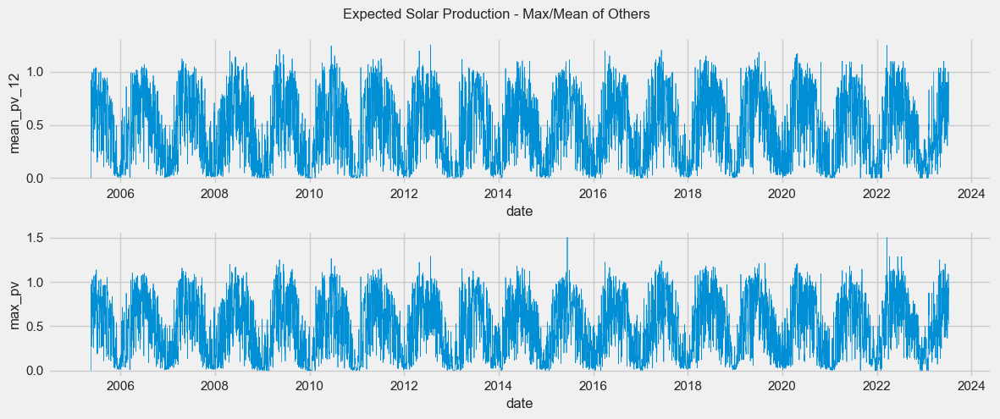

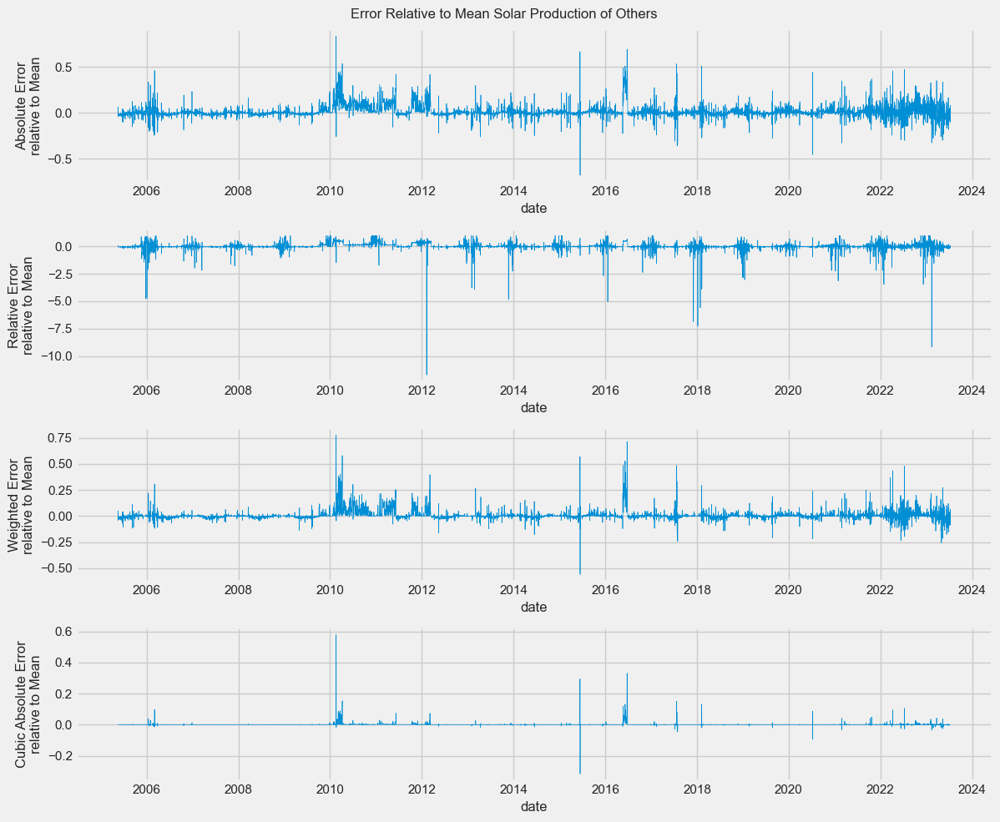

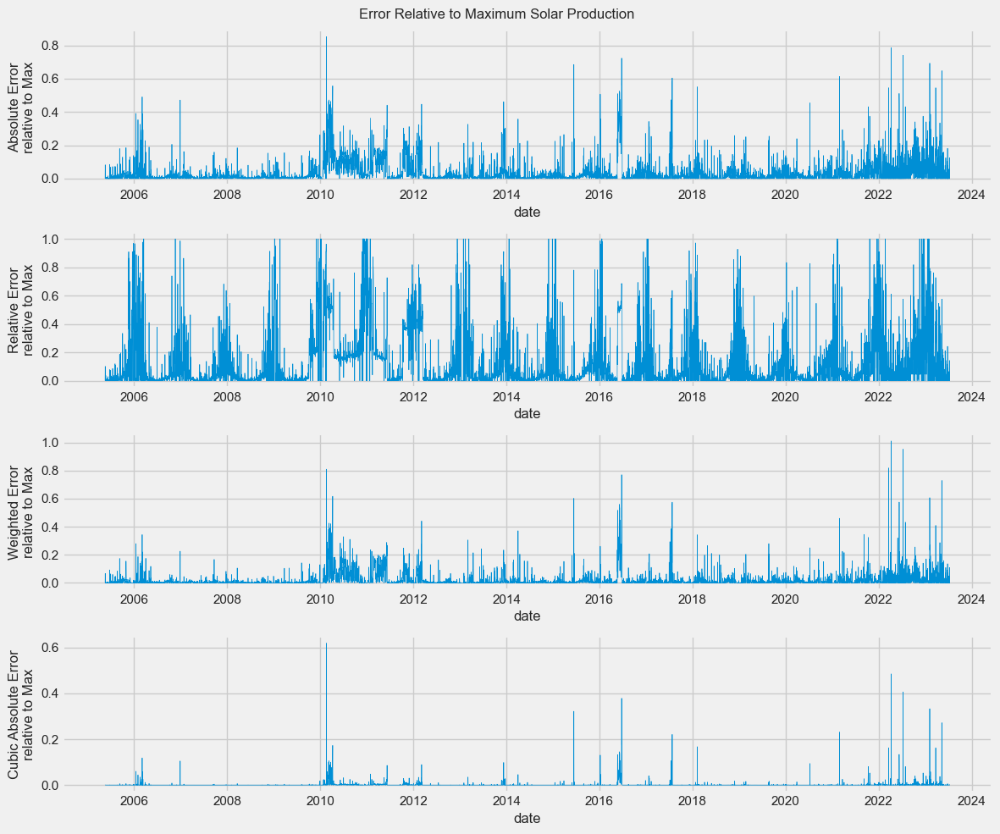

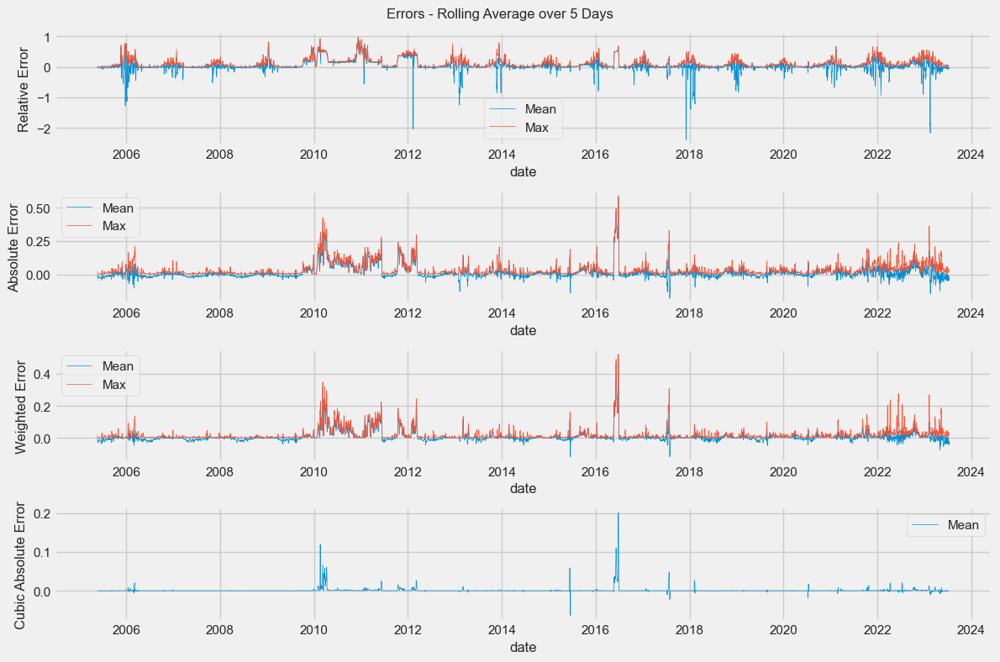

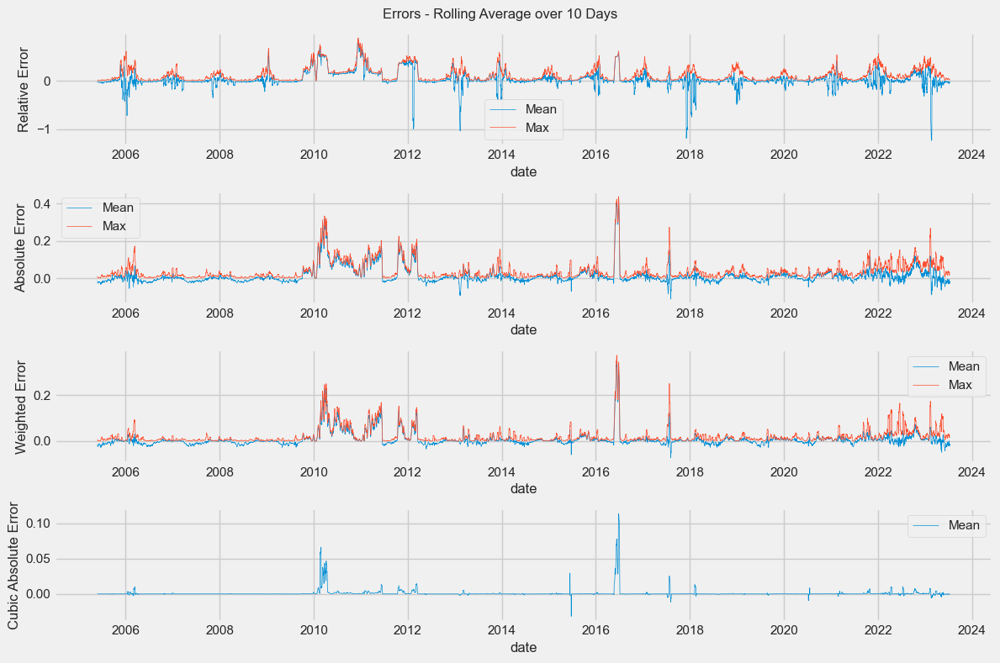

...

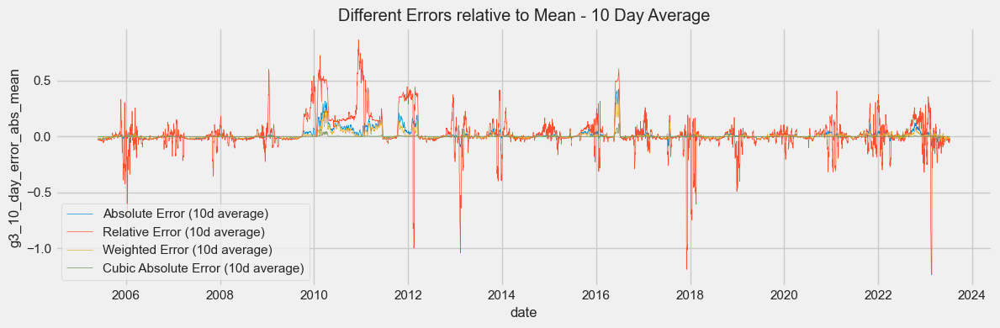

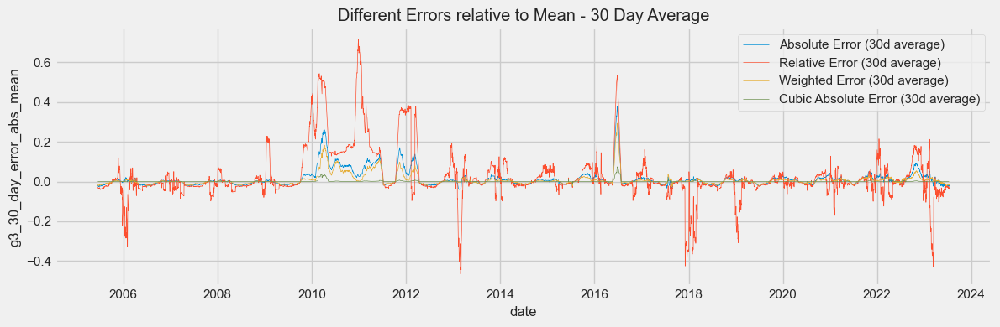

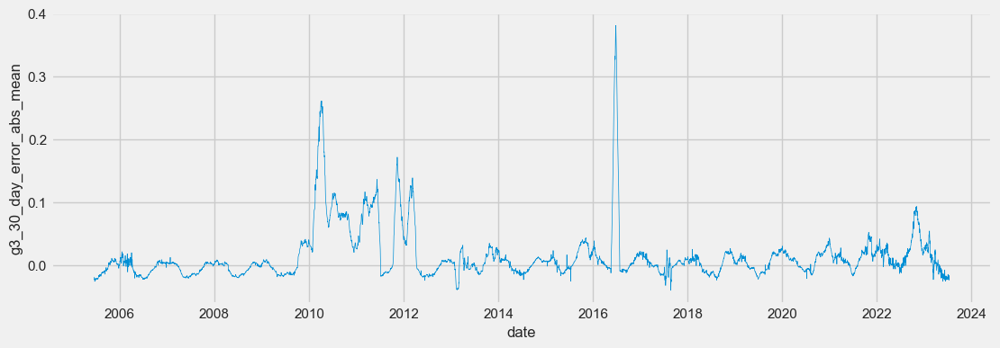

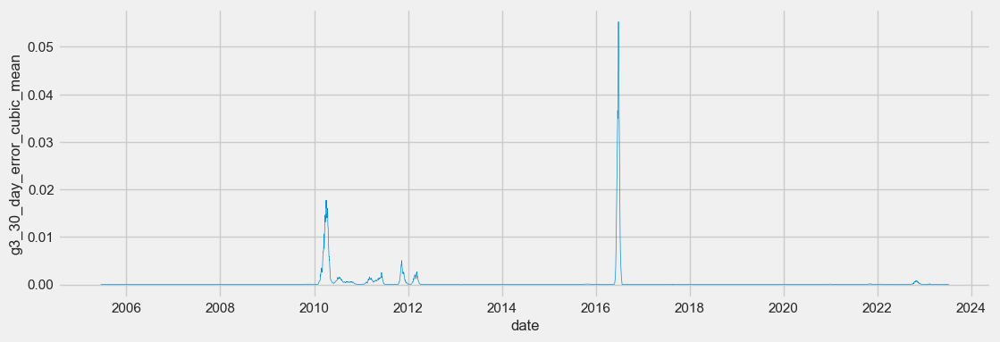

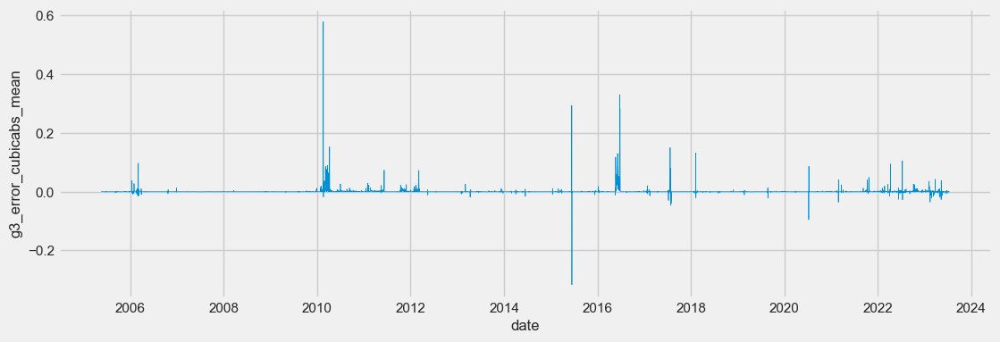

In [41]:
# different errors (acc. to mean of others)
fig, ax = plt.subplots(2,figsize=(12,5))
sns.lineplot(data=df, y="mean_pv_12", x="date", linewidth=0.5, ax=ax[0])
sns.lineplot(data=df, y="max_pv", x="date", linewidth=0.5, ax=ax[1])
fig.suptitle("Expected Solar Production - Max/Mean of Others")
plt.tight_layout()
plt.show()

# different errors (acc. to mean of others)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(12,10))
sns.lineplot(data=df, y="g3_error_abs_mean", x="date", linewidth=0.5, ax=ax1
).set(ylabel="Absolute Error\nrelative to Mean")
sns.lineplot(data=df, y="g3_error_rel_mean", x="date", linewidth=0.5, ax=ax2
).set(ylabel="Relative Error\nrelative to Mean")
sns.lineplot(data=df, y="g3_error_weight_mean", x="date", linewidth=0.5, ax=ax3
).set(ylabel="Weighted Error\nrelative to Mean")
sns.lineplot(data=df, y="g3_error_cubicabs_mean", x="date", linewidth=0.5, ax=ax4
).set(ylabel="Cubic Absolute Error\nrelative to Mean")
fig.suptitle("Error Relative to Mean Solar Production of Others")
plt.tight_layout()
plt.show()

# different errors (acc. to max of others)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(12,10))
sns.lineplot(data=df, y="g3_error_abs_max", x="date", linewidth=0.5, ax=ax1
).set(ylabel="Absolute Error\nrelative to Max")
sns.lineplot(data=df, y="g3_error_rel_max", x="date", linewidth=0.5, ax=ax2
).set(ylabel="Relative Error\nrelative to Max")
sns.lineplot(data=df, y="g3_error_weight_max", x="date", linewidth=0.5, ax=ax3
).set(ylabel="Weighted Error\nrelative to Max")
sns.lineplot(data=df, y="g3_error_cubicabs_max", x="date", linewidth=0.5, ax=ax4
).set(ylabel="Cubic Absolute Error\nrelative to Max")
fig.suptitle("Error Relative to Maximum Solar Production")
plt.tight_layout()
plt.show()

# different 5-day errors - mean vs. max
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(12,8))
sns.lineplot(data=df, y="g3_5_day_error_rel_mean", x="date", linewidth=0.5, ax=ax1, label="Mean"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_5_day_error_rel_max", x="date", linewidth=0.5, ax=ax1, label="Max"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_5_day_error_abs_mean", x="date", linewidth=0.5, ax=ax2, label="Mean"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_5_day_error_abs_max", x="date", linewidth=0.5, ax=ax2, label="Max"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_5_day_error_weight_mean", x="date", linewidth=0.5, ax=ax3, label="Mean"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_5_day_error_weight_max", x="date", linewidth=0.5, ax=ax3, label="Max"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_5_day_error_cubicabs_mean", x="date", linewidth=0.5, ax=ax4, label="Mean"
).set(ylabel="Cubic Absolute Error")
fig.suptitle("Errors - Rolling Average over 5 Days")
plt.tight_layout()
plt.show()

# different 10-day errors - mean vs. max
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(12,8))
sns.lineplot(data=df, y="g3_10_day_error_rel_mean", x="date", linewidth=0.5, ax=ax1, label="Mean"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_10_day_error_rel_max", x="date", linewidth=0.5, ax=ax1, label="Max"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_10_day_error_abs_mean", x="date", linewidth=0.5, ax=ax2, label="Mean"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_10_day_error_abs_max", x="date", linewidth=0.5, ax=ax2, label="Max"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_10_day_error_weight_mean", x="date", linewidth=0.5, ax=ax3, label="Mean"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_10_day_error_weight_max", x="date", linewidth=0.5, ax=ax3, label="Max"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_10_day_error_cubicabs_mean", x="date", linewidth=0.5, ax=ax4, label="Mean"
).set(ylabel="Cubic Absolute Error")
fig.suptitle("Errors - Rolling Average over 10 Days")
plt.tight_layout()
plt.show()

# different 30-day errors - mean vs. max
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(12,8))
sns.lineplot(data=df, y="g3_30_day_error_rel_mean", x="date", linewidth=0.5, ax=ax1, label="Mean"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_30_day_error_rel_max", x="date", linewidth=0.5, ax=ax1, label="Max"
).set(ylabel="Relative Error")
sns.lineplot(data=df, y="g3_30_day_error_abs_mean", x="date", linewidth=0.5, ax=ax2, label="Mean"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_30_day_error_abs_max", x="date", linewidth=0.5, ax=ax2, label="Max"
).set(ylabel="Absolute Error")
sns.lineplot(data=df, y="g3_30_day_error_weight_mean", x="date", linewidth=0.5, ax=ax3, label="Mean"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_30_day_error_weight_max", x="date", linewidth=0.5, ax=ax3, label="Max"
).set(ylabel="Weighted Error")
sns.lineplot(data=df, y="g3_30_day_error_cubicabs_mean", x="date", linewidth=0.5, ax=ax4, label="Mean"
).set(ylabel="Cubic Absolute Error")
fig.suptitle("Errors - Rolling Average over 30 Days")
plt.tight_layout()
plt.show()

plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_5_day_error_abs_mean", x="date", linewidth=0.5,
             label="Absolute Error (5d average)")
sns.lineplot(data=df, y="g3_5_day_error_rel_mean", x="date", linewidth=0.5,
             label="Relative Error (5d average)")
sns.lineplot(data=df, y="g3_5_day_error_weight_mean", x="date", linewidth=0.5,
             label="Weighted Error (5d average)")
sns.lineplot(data=df, y="g3_5_day_error_cubicabs_mean", x="date", linewidth=0.5,
             label="Cubic Absolute Error (5d average)")
plt.title("Different Errors relative to Mean - 5 Day Average")
plt.legend()
plt.tight_layout()
plt.show()

plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_10_day_error_abs_mean", x="date", linewidth=0.5,
             label="Absolute Error (10d average)")
sns.lineplot(data=df, y="g3_10_day_error_rel_mean", x="date", linewidth=0.5,
             label="Relative Error (10d average)")
sns.lineplot(data=df, y="g3_10_day_error_weight_mean", x="date", linewidth=0.5,
             label="Weighted Error (10d average)")
sns.lineplot(data=df, y="g3_10_day_error_cubicabs_mean", x="date", linewidth=0.5,
             label="Cubic Absolute Error (10d average)")
plt.title("Different Errors relative to Mean - 10 Day Average")
plt.legend()
plt.tight_layout()
plt.show()

plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_30_day_error_abs_mean", x="date", linewidth=0.5,
             label="Absolute Error (30d average)")
sns.lineplot(data=df, y="g3_30_day_error_rel_mean", x="date", linewidth=0.5,
             label="Relative Error (30d average)")
sns.lineplot(data=df, y="g3_30_day_error_weight_mean", x="date", linewidth=0.5,
             label="Weighted Error (30d average)")
sns.lineplot(data=df, y="g3_30_day_error_cubicabs_mean", x="date", linewidth=0.5,
             label="Cubic Absolute Error (30d average)")
plt.title("Different Errors relative to Mean - 30 Day Average")
plt.legend()
plt.tight_layout()
plt.show()

plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_30_day_error_abs_mean", x="date", linewidth=0.5)
plt.show()
plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_30_day_error_cubic_mean", x="date", linewidth=0.5)
plt.show()
plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g3_error_cubicabs_mean", x="date", linewidth=0.5)
plt.show()

--> even better: mean abs error --> rolling average --> cubic value

### Find Error Thresholds

- plot production + error metrics
- color potential defective time windows according to various thresholds for different metrics

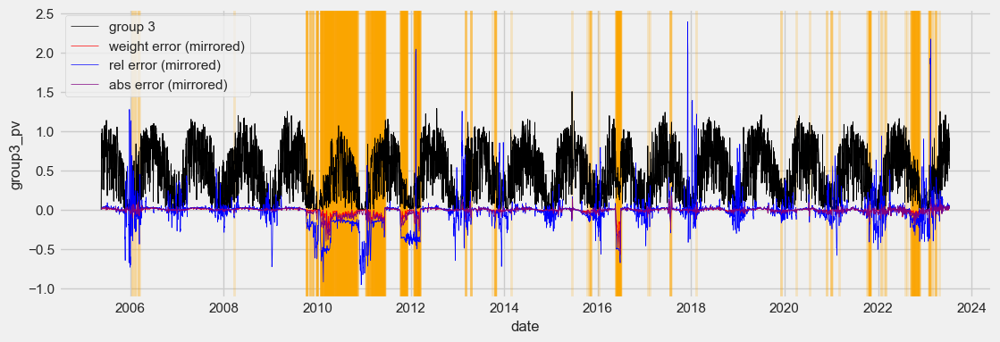

In [42]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[((df.g3_5_day_error_weight_mean>0.02) &\
             (df.g3_5_day_error_abs_mean>0.02) &\
             (df.g3_5_day_error_rel_mean>0.1)) \
                # | ((df.g3_5_day_error_rel_mean>0.5) & (df.g3_5_day_error_weight_mean>0.005))
                ].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_5_day_error_weight_mean*(-1), x="date", linewidth=0.5, color="red", label="weight error (mirrored)")
sns.lineplot(data=df, y=df.g3_5_day_error_rel_mean*(-1), x="date", linewidth=0.5, color="blue", label="rel error (mirrored)")
sns.lineplot(data=df, y=df.g3_5_day_error_abs_mean*(-1), x="date", linewidth=0.5, color="purple", label="abs error (mirrored)")
plt.legend()
plt.show()

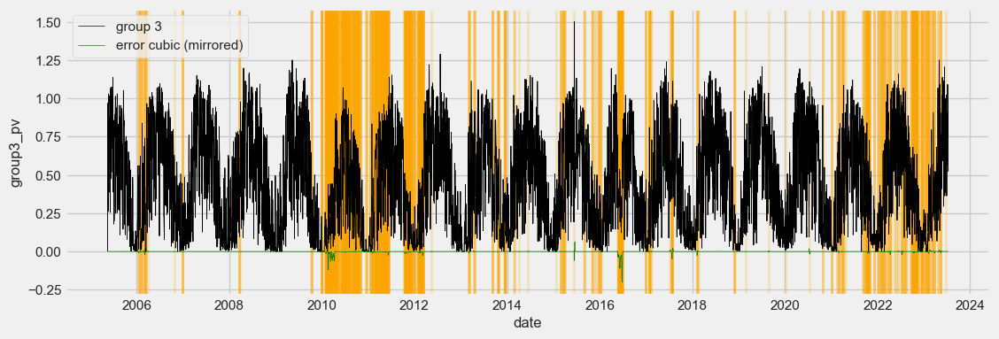

In [43]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_5_day_error_cubicabs_mean>0.0005)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_5_day_error_cubicabs_mean*(-1), x="date", linewidth=0.5, color="green", label="error cubic (mirrored)")
plt.legend()
plt.show()


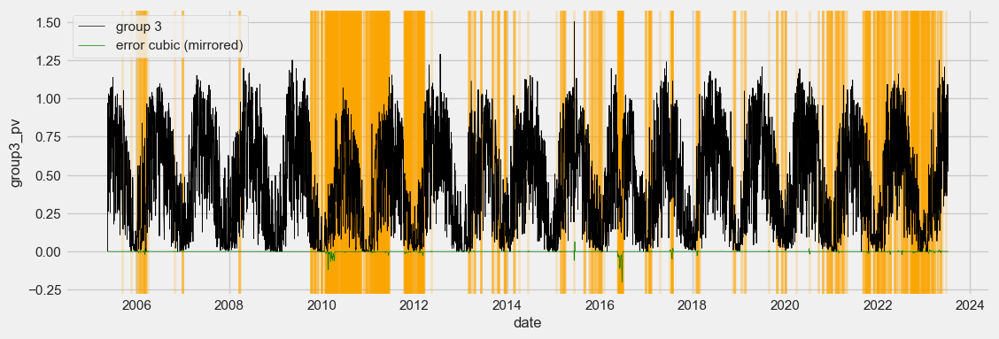

In [44]:
# better in winter, but more noisy
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_5_day_error_cubicabs_mean>0.0003)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_5_day_error_cubicabs_mean*(-1), x="date", linewidth=0.5, color="green", label="error cubic (mirrored)")
plt.legend()
plt.show()


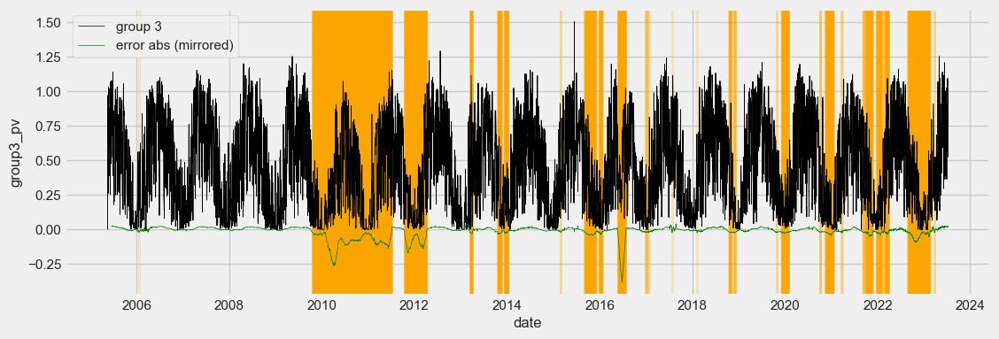

In [45]:
# better in winter but too noisy
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_30_day_error_abs_mean>0.02)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_30_day_error_abs_mean*(-1), x="date", linewidth=0.5, color="green", label="error abs (mirrored)")
plt.legend()
plt.show()


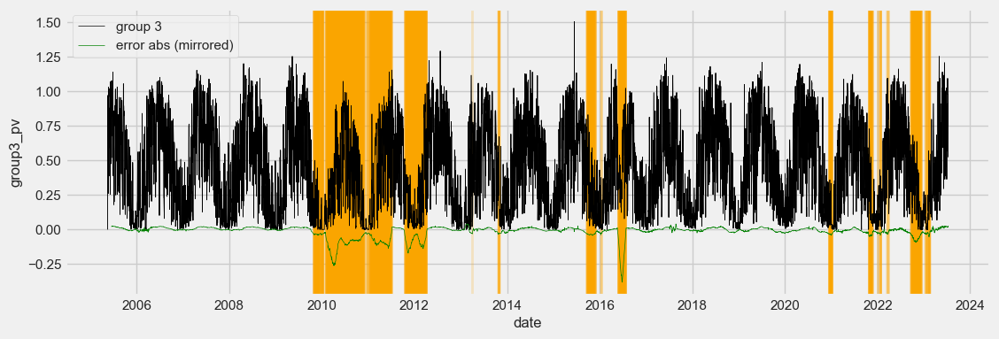

In [46]:
# better in winter and less noisy
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_30_day_error_abs_mean>0.03)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_30_day_error_abs_mean*(-1), x="date", linewidth=0.5, color="green", label="error abs (mirrored)")
plt.legend()
plt.show()


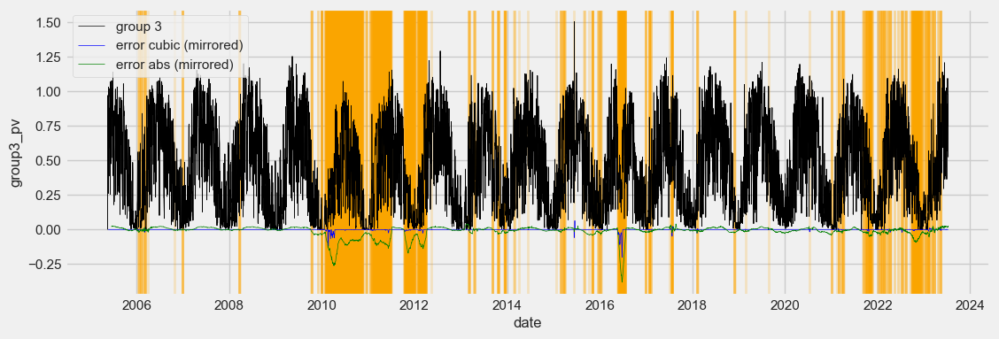

In [47]:
# compromise (but previous is better)
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_5_day_error_cubicabs_mean>0.0006) |\
            (df.g3_30_day_error_abs_mean>0.04)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_5_day_error_cubicabs_mean*(-1), x="date", linewidth=0.5, color="blue", label="error cubic (mirrored)")
sns.lineplot(data=df, y=df.g3_30_day_error_abs_mean*(-1), x="date", linewidth=0.5, color="green", label="error abs (mirrored)")
plt.legend()
plt.show()


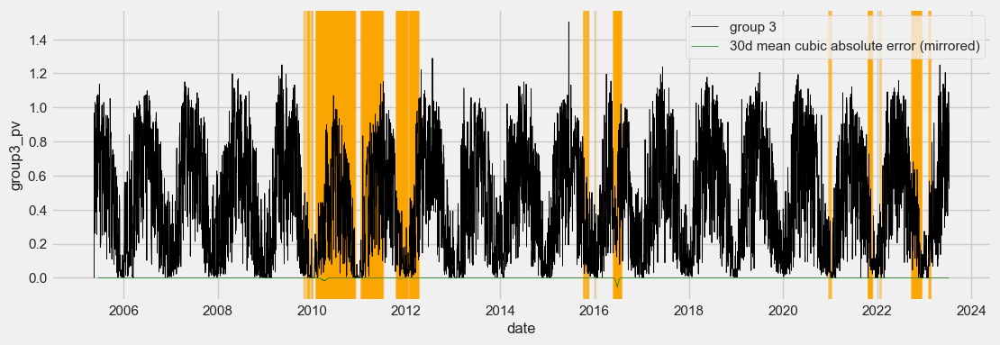

In [48]:
# better in winter and less noisy
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_30_day_error_cubic_mean>0.00005)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_30_day_error_cubic_mean*(-1), x="date", linewidth=0.5, color="green", label="30d mean cubic absolute error (mirrored)")
plt.legend()
plt.show()


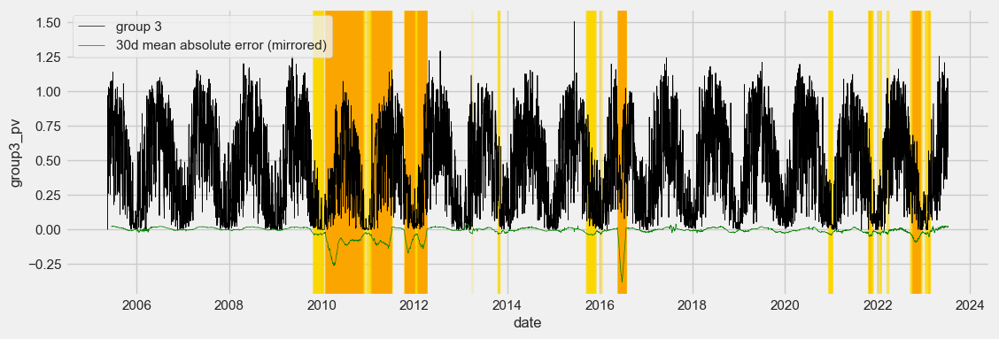

In [49]:
# still best
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black")
for x in df[(df.g3_30_day_error_abs_mean>0.03)].date:
    fig.axvline(x, color='gold', lw=2, alpha=0.2)
for x in df[(df.g3_30_day_error_abs_mean>0.05)].date:
    fig.axvline(x, color='orange', lw=2, alpha=0.2)
fig = sns.lineplot(data=df, y="group3_pv", x="date", linewidth=0.5, color="black", label="group 3")
sns.lineplot(data=df, y=df.g3_30_day_error_abs_mean*(-1), x="date", linewidth=0.5, color="green", label="30d mean absolute error (mirrored)")
plt.legend()
plt.show()


> best filter: `(df.g3_30_day_error_abs_mean>0.03)`

### Erroneous Time Ranges

#### Issues between 2009 and 2020 by error-based filtering

In [50]:
date_list =\
    df[((df.g3_5_day_error_cubicabs_mean>0.0005) | (df.g3_30_day_error_abs_mean>0.04)) &\
    (df.date>datetime(2009, 1, 1)) & (df.date<datetime(2021, 1, 1))].date
len(date_list)

831

In [51]:
", ".join(sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list]))

'2009-10-09, 2009-10-10, 2009-10-11, 2009-10-12, 2009-10-13, 2009-12-03, 2009-12-04, 2009-12-26, 2009-12-27, 2009-12-28, 2009-12-29, 2009-12-30, 2009-12-31, 2010-01-01, 2010-01-02, 2010-01-26, 2010-01-27, 2010-01-28, 2010-01-29, 2010-01-30, 2010-01-31, 2010-02-01, 2010-02-02, 2010-02-03, 2010-02-04, 2010-02-05, 2010-02-06, 2010-02-07, 2010-02-08, 2010-02-09, 2010-02-10, 2010-02-11, 2010-02-12, 2010-02-13, 2010-02-14, 2010-02-15, 2010-02-16, 2010-02-17, 2010-02-18, 2010-02-19, 2010-02-20, 2010-02-21, 2010-02-22, 2010-02-23, 2010-02-24, 2010-02-25, 2010-02-26, 2010-02-27, 2010-02-28, 2010-03-01, 2010-03-02, 2010-03-03, 2010-03-04, 2010-03-05, 2010-03-06, 2010-03-07, 2010-03-08, 2010-03-09, 2010-03-10, 2010-03-11, 2010-03-12, 2010-03-13, 2010-03-14, 2010-03-15, 2010-03-16, 2010-03-17, 2010-03-18, 2010-03-19, 2010-03-20, 2010-03-21, 2010-03-22, 2010-03-23, 2010-03-24, 2010-03-25, 2010-03-26, 2010-03-27, 2010-03-28, 2010-03-29, 2010-03-30, 2010-03-31, 2010-04-01, 2010-04-02, 2010-04-03, 201

In [52]:
date_list =\
    df[(df.g3_30_day_error_abs_mean>0.03) &\
    (df.date>datetime(2009, 1, 1)) & (df.date<datetime(2021, 1, 1))].date
len(date_list)

890

In [53]:
", ".join(sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list]))

'2009-10-26, 2009-10-27, 2009-10-28, 2009-10-29, 2009-10-30, 2009-10-31, 2009-11-01, 2009-11-02, 2009-11-03, 2009-11-04, 2009-11-05, 2009-11-06, 2009-11-07, 2009-11-08, 2009-11-09, 2009-11-10, 2009-11-12, 2009-11-13, 2009-11-14, 2009-11-15, 2009-11-16, 2009-11-17, 2009-11-18, 2009-11-19, 2009-11-20, 2009-11-21, 2009-11-22, 2009-11-23, 2009-11-24, 2009-11-25, 2009-11-26, 2009-11-27, 2009-11-28, 2009-11-29, 2009-11-30, 2009-12-01, 2009-12-02, 2009-12-03, 2009-12-04, 2009-12-05, 2009-12-06, 2009-12-07, 2009-12-08, 2009-12-09, 2009-12-10, 2009-12-11, 2009-12-12, 2009-12-13, 2009-12-14, 2009-12-15, 2009-12-16, 2009-12-17, 2009-12-25, 2009-12-26, 2009-12-27, 2009-12-28, 2009-12-29, 2009-12-30, 2009-12-31, 2010-01-01, 2010-01-02, 2010-01-03, 2010-01-04, 2010-01-05, 2010-01-06, 2010-01-07, 2010-01-08, 2010-01-09, 2010-01-10, 2010-01-30, 2010-01-31, 2010-02-01, 2010-02-02, 2010-02-03, 2010-02-04, 2010-02-05, 2010-02-06, 2010-02-07, 2010-02-08, 2010-02-09, 2010-02-10, 2010-02-11, 2010-02-12, 201

#### Time windows of interest

Note: lagging due to rolling average! - 30ds +- window to reach threshold (approx 3-6 d > 5d)

In [54]:
# time window 1
date_list =\
    df[(df.g3_30_day_error_abs_mean>0.03) &\
    (df.date>datetime(2009, 1, 1)) & (df.date<datetime(2011, 8, 1))].date
str_list = sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list])
print("Issue 1 start", min(str_list))
print("Issue 1 end", max(str_list))
print("; ".join(str_list))


Issue 1 start 2009-10-26
Issue 1 end 2011-07-03
2009-10-26; 2009-10-27; 2009-10-28; 2009-10-29; 2009-10-30; 2009-10-31; 2009-11-01; 2009-11-02; 2009-11-03; 2009-11-04; 2009-11-05; 2009-11-06; 2009-11-07; 2009-11-08; 2009-11-09; 2009-11-10; 2009-11-12; 2009-11-13; 2009-11-14; 2009-11-15; 2009-11-16; 2009-11-17; 2009-11-18; 2009-11-19; 2009-11-20; 2009-11-21; 2009-11-22; 2009-11-23; 2009-11-24; 2009-11-25; 2009-11-26; 2009-11-27; 2009-11-28; 2009-11-29; 2009-11-30; 2009-12-01; 2009-12-02; 2009-12-03; 2009-12-04; 2009-12-05; 2009-12-06; 2009-12-07; 2009-12-08; 2009-12-09; 2009-12-10; 2009-12-11; 2009-12-12; 2009-12-13; 2009-12-14; 2009-12-15; 2009-12-16; 2009-12-17; 2009-12-25; 2009-12-26; 2009-12-27; 2009-12-28; 2009-12-29; 2009-12-30; 2009-12-31; 2010-01-01; 2010-01-02; 2010-01-03; 2010-01-04; 2010-01-05; 2010-01-06; 2010-01-07; 2010-01-08; 2010-01-09; 2010-01-10; 2010-01-30; 2010-01-31; 2010-02-01; 2010-02-02; 2010-02-03; 2010-02-04; 2010-02-05; 2010-02-06; 2010-02-07; 2010-02-08; 2010

In [55]:
# time window 2
date_list =\
    df[(df.g3_30_day_error_abs_mean>0.03) &\
    (df.date>datetime(2011, 8, 1)) & (df.date<datetime(2012, 5, 1))].date
str_list = sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list])
print("; ".join(str_list))
print("Issue 2 start", min(str_list))
print("Issue 2 end", max(str_list))


2011-10-17; 2011-10-18; 2011-10-19; 2011-10-20; 2011-10-21; 2011-10-22; 2011-10-23; 2011-10-24; 2011-10-25; 2011-10-26; 2011-10-27; 2011-10-28; 2011-10-29; 2011-10-30; 2011-10-31; 2011-11-01; 2011-11-02; 2011-11-03; 2011-11-04; 2011-11-05; 2011-11-06; 2011-11-07; 2011-11-08; 2011-11-09; 2011-11-10; 2011-11-11; 2011-11-12; 2011-11-13; 2011-11-14; 2011-11-15; 2011-11-16; 2011-11-17; 2011-11-18; 2011-11-19; 2011-11-20; 2011-11-21; 2011-11-22; 2011-11-23; 2011-11-24; 2011-11-25; 2011-11-26; 2011-11-27; 2011-11-28; 2011-11-29; 2011-11-30; 2011-12-01; 2011-12-02; 2011-12-03; 2011-12-04; 2011-12-05; 2011-12-06; 2011-12-07; 2011-12-08; 2011-12-09; 2011-12-10; 2011-12-11; 2011-12-12; 2011-12-13; 2011-12-14; 2011-12-15; 2011-12-16; 2011-12-17; 2011-12-18; 2011-12-19; 2011-12-20; 2011-12-21; 2011-12-22; 2011-12-23; 2011-12-24; 2011-12-25; 2011-12-26; 2011-12-27; 2011-12-28; 2011-12-29; 2011-12-30; 2011-12-31; 2012-01-01; 2012-01-02; 2012-01-03; 2012-01-04; 2012-01-05; 2012-01-06; 2012-01-07; 2012

In [56]:
# time window 3
date_list =\
    df[(df.g3_30_day_error_abs_mean>0.03) &\
    (df.date>datetime(2016, 1, 1)) & (df.date<datetime(2017, 1, 1))].date
str_list = sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list])
print("; ".join(str_list))
print("Issue 3 start", min(str_list[3:]))
print("Issue 3 end", max(str_list))


2016-01-10; 2016-01-11; 2016-01-12; 2016-05-24; 2016-05-25; 2016-05-26; 2016-05-27; 2016-05-28; 2016-05-29; 2016-05-30; 2016-05-31; 2016-06-01; 2016-06-02; 2016-06-03; 2016-06-04; 2016-06-05; 2016-06-06; 2016-06-07; 2016-06-08; 2016-06-09; 2016-06-10; 2016-06-11; 2016-06-12; 2016-06-13; 2016-06-14; 2016-06-15; 2016-06-16; 2016-06-17; 2016-06-18; 2016-06-19; 2016-06-20; 2016-06-21; 2016-06-22; 2016-06-23; 2016-06-24; 2016-06-25; 2016-06-26; 2016-06-27; 2016-06-28; 2016-06-29; 2016-06-30; 2016-07-01; 2016-07-02; 2016-07-03; 2016-07-04; 2016-07-05; 2016-07-06; 2016-07-07; 2016-07-08; 2016-07-09; 2016-07-10; 2016-07-11; 2016-07-12; 2016-07-13; 2016-07-14; 2016-07-15; 2016-07-16; 2016-07-17; 2016-07-18; 2016-07-19; 2016-07-20; 2016-07-21; 2016-07-22; 2016-07-23; 2016-07-24
Issue 3 start 2016-05-24
Issue 3 end 2016-07-24


#### Summary - Time Windows of Interest

Note: lagging due to rolling average! - 30ds +- window to reach threshold (approx 3-6 d > 5d)

- timeframe_of_interest: 2009-10-26 - 2011-07-03 
    - corrected for lag: 2009-09-27 - 2011-06-03 # 30d
    - corrected for lag: 2009-09-22 - 2011-06-09  
      > approx. time to detection (known repair: +6)
- timeframe_of_interest: 2011-10-17 - 2012-04-04
    - corrected for lag: 2011-09-18 - 2012-03-05 # 30d
    - corrected for lag: 2011-09-13 - 2012-03-10  
      > approx. time to detection
- timeframe_of_interest: 2016-05-24 - 2016-07-24
    - corrected for lag: 2016-04-25 - 2016-06-24 # 30d
    - corrected for lag: 2016-04-20 - 2016-06-27  
      > approx. time to detection (known repair: +3)

Repair dates:
- 09.06.2011
- 27.06.2016


### Manual refinement of time windows (start & end)

In [57]:
# interval 1 - start
df[(df.date > datetime(2009, 9, 22)) & (df.date < datetime(2009, 10, 30))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error rises starting from 2009-10-04 - hard to see from absolute, but better from relative error!

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
1589,2009-09-23,0.8000,0.835714,0.822727,-0.004870,-0.005955
1590,2009-09-24,0.2375,0.242857,0.229545,0.010633,0.044272
1591,2009-09-25,0.4000,0.435714,0.425000,-0.007143,-0.017094
1592,2009-09-26,0.8250,0.857143,0.845455,-0.004383,-0.005211
1593,2009-09-27,0.7625,0.800000,0.777273,0.003977,0.005091
1594,2009-09-28,0.5125,0.542857,0.534091,-0.006412,-0.012152
1595,2009-09-29,0.0625,0.064286,0.056818,0.006575,0.103713
1596,2009-09-30,0.7000,0.750000,0.722727,0.002273,0.003135
1597,2009-10-01,0.2125,0.221429,0.218182,-0.001218,-0.005612
1598,2009-10-02,0.1500,0.164286,0.156818,0.000325,0.002066


In [58]:
# interval 1 - end
df[(df.date > datetime(2011, 6, 1)) & (df.date < datetime(2011, 6, 20))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error gone since 2011-06-10 (repaired on 2011-06-09)

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
2206,2011-06-02,0.7125,0.750000,0.631818,0.099432,0.135975
2207,2011-06-03,0.9125,0.950000,0.806818,0.124432,0.133618
2208,2011-06-04,1.0125,1.050000,0.888636,0.142614,0.138292
2209,2011-06-05,0.8375,0.871429,0.731818,0.122646,0.143536
2210,2011-06-06,0.9250,0.978571,0.684091,0.267695,0.281255
2211,2011-06-07,0.8500,0.892857,0.611364,0.260065,0.298435
2212,2011-06-08,0.7375,0.771429,0.522727,0.231737,0.307154
2213,2011-06-09,0.5625,0.607143,0.165909,0.418912,0.716308
2214,2011-06-10,0.7750,0.814286,0.815909,-0.021266,-0.026762
2215,2011-06-11,0.9125,0.950000,0.950000,-0.018750,-0.020134


In [59]:
# interval 2 - start
df[(df.date > datetime(2011, 9, 28)) & (df.date < datetime(2011, 10, 30))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error rises starting from 2011-10-10 (maybe already since 7th)

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
2325,2011-09-29,0.7625,0.807143,0.781818,0.003003,0.003827
2326,2011-09-30,0.8250,0.828571,0.815909,0.010877,0.013155
2327,2011-10-01,0.7750,0.850000,0.804545,0.007955,0.009790
2328,2011-10-02,0.8000,0.835714,0.813636,0.004221,0.005161
2329,2011-10-03,0.6875,0.735714,0.715909,-0.004302,-0.006045
2330,2011-10-04,0.6875,0.721429,0.695455,0.009010,0.012789
2331,2011-10-05,0.1625,0.207143,0.188636,-0.003815,-0.020641
2332,2011-10-06,0.7125,0.742857,0.729545,-0.001867,-0.002566
2333,2011-10-07,0.3750,0.400000,0.372727,0.014773,0.038123
2334,2011-10-08,0.4375,0.464286,0.422727,0.028166,0.062466


In [60]:
# interval 2 - end
df[(df.date > datetime(2012, 3, 1)) & (df.date < datetime(2012, 4, 5))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error gone since 2011-03-16 (repair unknown)

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
2480,2012-03-02,0.1250,0.142857,0.086364,0.047565,0.355152
2481,2012-03-03,0.8250,0.864286,0.547727,0.296916,0.351528
2482,2012-03-04,0.5000,0.528571,0.336364,0.177922,0.345960
2483,2012-03-05,0.7500,0.800000,0.522727,0.252273,0.325513
2484,2012-03-06,0.9250,0.985714,0.538636,0.416721,0.436194
2485,2012-03-07,0.6625,0.714286,0.459091,0.229302,0.333098
2486,2012-03-08,0.2125,0.235714,0.138636,0.085471,0.381384
2487,2012-03-09,0.6250,0.664286,0.431818,0.212825,0.330144
2488,2012-03-10,0.1750,0.207143,0.122727,0.068344,0.357689
2489,2012-03-11,0.3625,0.385714,0.252273,0.121834,0.325667


In [61]:
# interval 3 - start
df[(df.date > datetime(2016, 5, 5)) & (df.date < datetime(2016, 5, 30))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error rises starting from 2016-05-22 (evtl. typo leading to differences in 2016-05-20/21)

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
4006,2016-05-06,0.9250,0.964286,0.965909,-0.021266,-0.022512
4007,2016-05-07,1.1375,1.164286,1.154545,-0.003653,-0.003174
4008,2016-05-08,0.9625,0.992857,0.986364,-0.008685,-0.008883
4009,2016-05-09,1.0125,1.021429,1.006818,0.010146,0.009977
4010,2016-05-10,0.9875,1.057143,1.047727,-0.025406,-0.024851
4011,2016-05-11,0.8875,0.907143,0.909091,-0.011769,-0.013116
4012,2016-05-12,1.0000,1.035714,1.013636,0.004221,0.004147
4013,2016-05-13,0.5000,0.521429,0.518182,-0.007468,-0.014622
4014,2016-05-14,0.8625,0.914286,0.900000,-0.011607,-0.013065
4015,2016-05-15,0.3625,0.371429,0.363636,0.003328,0.009069


In [62]:
# interval 3 - end
df[(df.date > datetime(2016, 6, 20)) & (df.date < datetime(2016, 7, 2))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g3_error_abs_mean", "g3_error_rel_mean"]]
# error gone since 2011-03-28 (repair on 2016-06-27)

,date,group1_pv,group2_pv,group3_pv,g3_error_abs_mean,g3_error_rel_mean
4052,2016-06-21,0.5500,0.542857,0.206818,0.339610,0.621509
4053,2016-06-22,0.7500,0.735714,0.236364,0.506494,0.681818
4054,2016-06-23,1.0000,1.064286,0.340909,0.691234,0.669707
4055,2016-06-24,0.8000,0.828571,0.268182,0.546104,0.670654
4056,2016-06-25,0.9625,0.978571,0.313636,0.656899,0.676842
4057,2016-06-26,0.6625,0.700000,0.220455,0.460795,0.676397
4058,2016-06-27,0.6000,0.607143,0.465909,0.137662,0.228080
4059,2016-06-28,0.6875,0.714286,0.718182,-0.017289,-0.024667
4060,2016-06-29,0.6500,0.671429,0.661364,-0.000649,-0.000983
4061,2016-06-30,0.4375,0.442857,0.443182,-0.003003,-0.006823


### Visualizations with Defects Labelled

#### Production over Time

In [63]:
# ranges of malfunctioning for group 3 (H)
# defective time ranges including first and last day
defect_ranges3 = [(datetime(2009,10, 4), datetime(2011,6, 9)),
                  (datetime(2011,10,10), datetime(2012,3,15)),
                  (datetime(2016, 5,22), datetime(2016,6,27))]

idx_maintenance_g3 = [
    "09.06.2011", # H repair - group 3
    "27.06.2016", # H repair - group 3
    ]

lw = 2 # line width

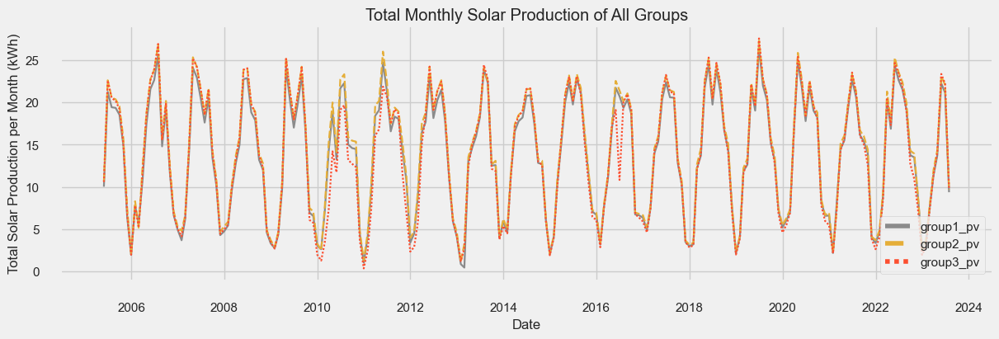

In [64]:
# colored plot
_, (ax1) = plt.subplots(1, 1, figsize=(12, 4), constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw*0.8, palette=("C4", "C2", "C1"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])

# customize plot
# ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Month (kWh)",
    title="Total Monthly Solar Production of All Groups",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'}) # , 'axes.grid': True})
sns.set_style("white")
sns.despine(offset=10, trim=False)
# ax1.grid(False); ax2.grid(False)
# sns.despine()
plt.show()


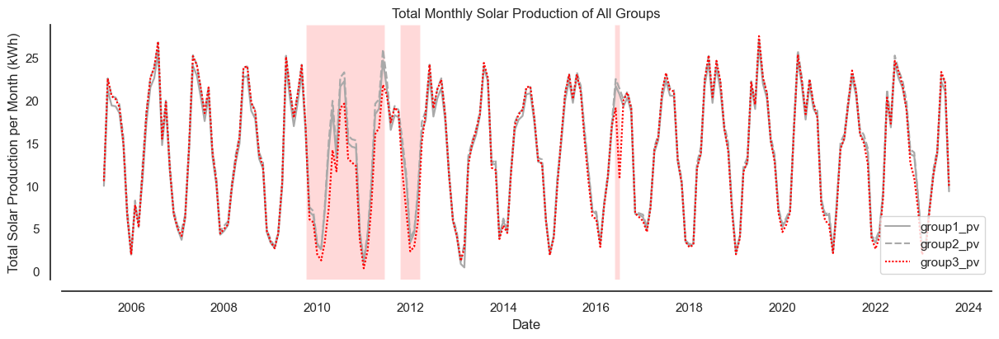

In [65]:
# highlight plot
_, (ax1) = plt.subplots(1, 1, figsize=(12, 4), constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw*0.8, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])

# mark malfunctions and repairs
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plot
# ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Month (kWh)",
    title="Total Monthly Solar Production of All Groups",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

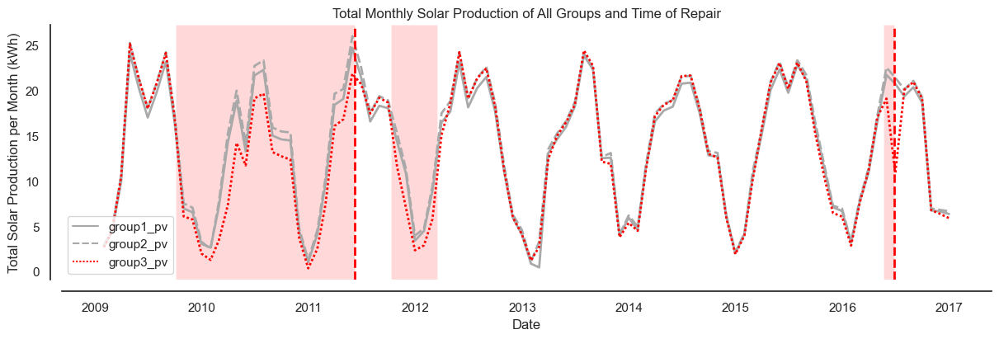

In [66]:
# zoomed plot
_, (ax1) = plt.subplots(1, 1, figsize=(12, 4), constrained_layout=True, dpi=100,)

sns.lineplot(ax=ax1, linewidth=lw*1., palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.01.01"'))

# mark malfunctions and repairs
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="red", linestyle='--', lw=2)
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

# customize plot
ax1.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Month (kWh)",
    title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax1.legend(loc='lower left')
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

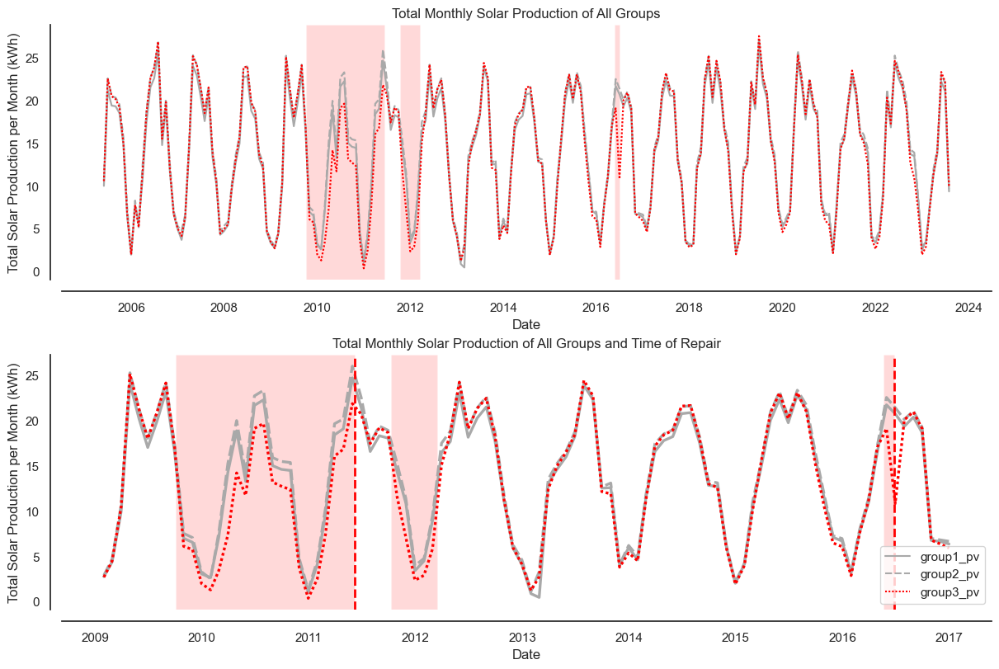

In [67]:
# combined plot
_, (ax1,ax2) = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw*0.8, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, linewidth=lw*1.2, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.01.01"'))

# mark malfunctions and repairs
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax2.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax2.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plot
ax1.legend([],[], frameon=False) # omit 1st legend
ax1.set(
    xlabel= "Date",
    ylabel= "Total Solar Production per Month (kWh)",
    title="Total Monthly Solar Production of All Groups",
)
ax2.set(
    xlabel = "Date",
    ylabel = "Total Solar Production per Month (kWh)",
    title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/2782866003.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


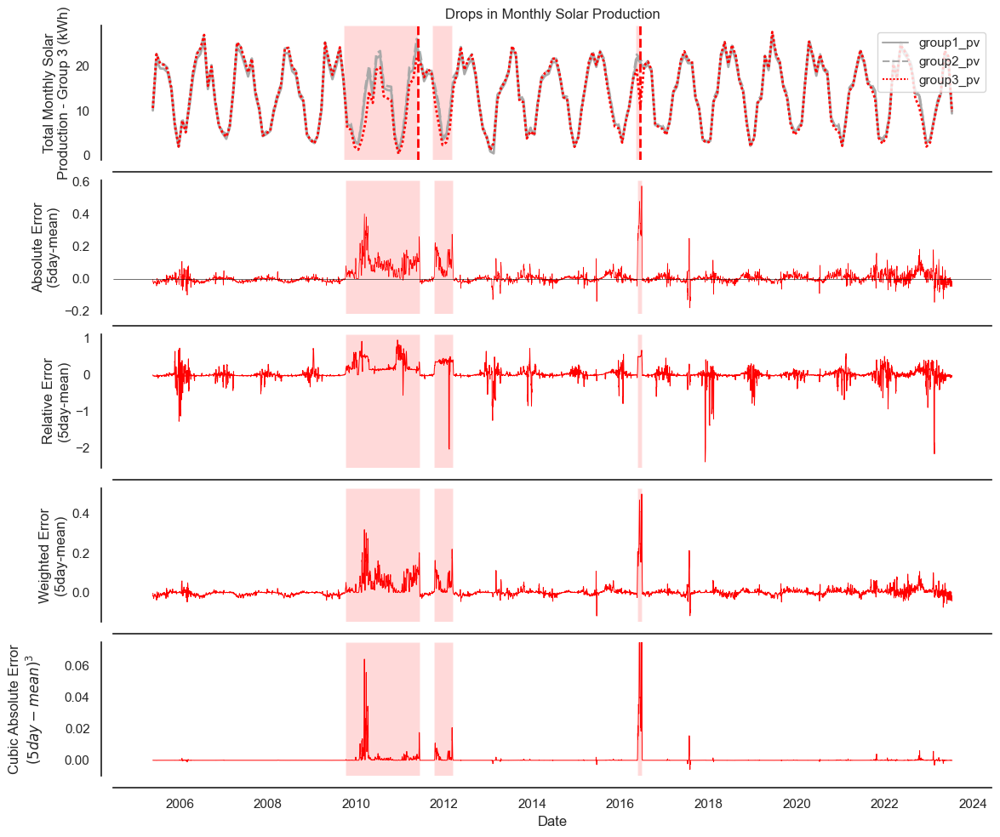

In [68]:
# solar production vs. error plots
_, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 10), sharex=False,
                                 constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g3_5_day_error_abs_mean", x="date", 
             color="red", linewidth=0.5)
sns.lineplot(ax=ax3, data=df, y="g3_5_day_error_rel_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax4, data=df, y="g3_5_day_error_weight_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax5, data=df, y="g3_5_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# plot repairs and error periods
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax2.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax3.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax4.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax5.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plots
ax1.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction - Group 3 (kWh)",
    title = "Drops in Monthly Solar Production",
)
ax2.axhline(0, color="black", linewidth=0.4) # zero baseline
ax2.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Absolute Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax3.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Relative Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax4.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Weighted Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set(
    xlabel = "Date",
    ylabel = "Cubic Absolute Error\n$(5day-mean)^3$\n",
    ylim = (-0.01, 0.075)
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/1585671239.py:63: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


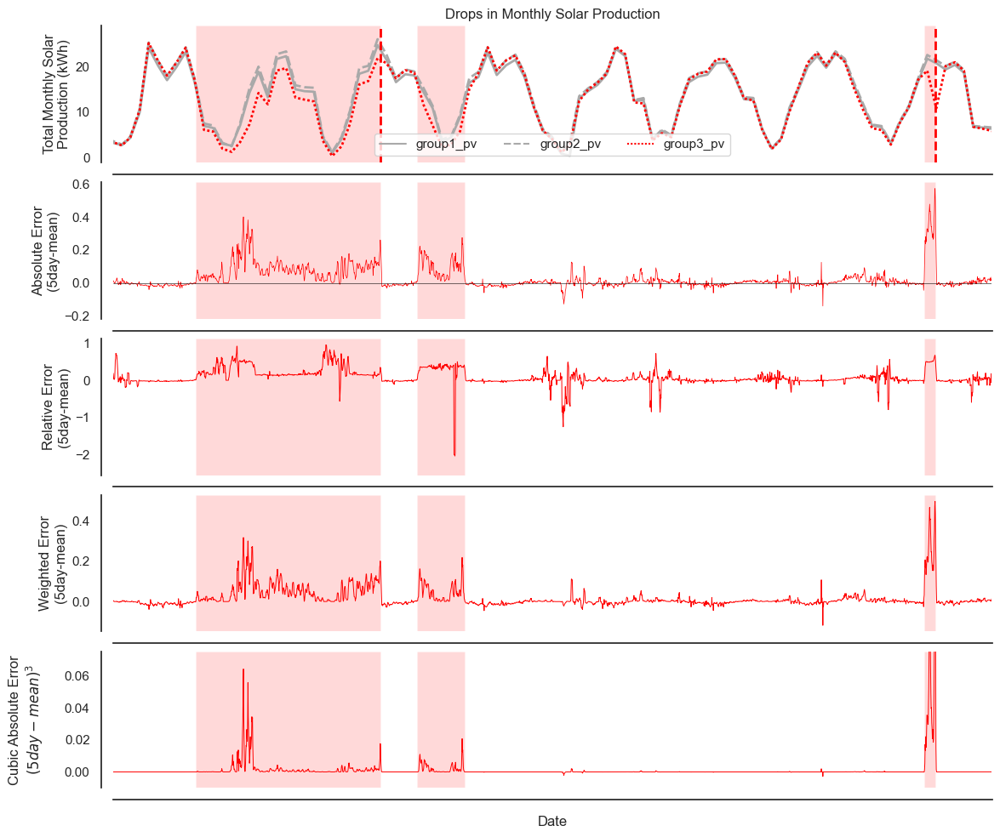

In [69]:
# zoomed solar production vs. error plots
_, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 10), sharex=True,
                                 constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g3_5_day_error_abs_mean", x="date", 
             color="red", linewidth=0.5)
sns.lineplot(ax=ax3, data=df, y="g3_5_day_error_rel_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax4, data=df, y="g3_5_day_error_weight_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax5, data=df, y="g3_5_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# plot repairs and error periods
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax2.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax3.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax4.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax5.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plots
ax1.legend(loc='lower center', ncol=3)
ax1.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production",
)
ax2.axhline(0, color="black", linewidth=0.4) # zero baseline
ax2.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Absolute Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax3.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Relative Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax4.set(
    xlabel = "Date",
    ylabel = "Weighted Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set(
    xlabel = "Date",
    ylabel = "Cubic Absolute Error\n$(5day-mean)^3$\n",
    ylim = (-0.01, 0.075)
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set_xlim(datetime(2009,1,1), datetime(2017,1,  1))
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/127120465.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


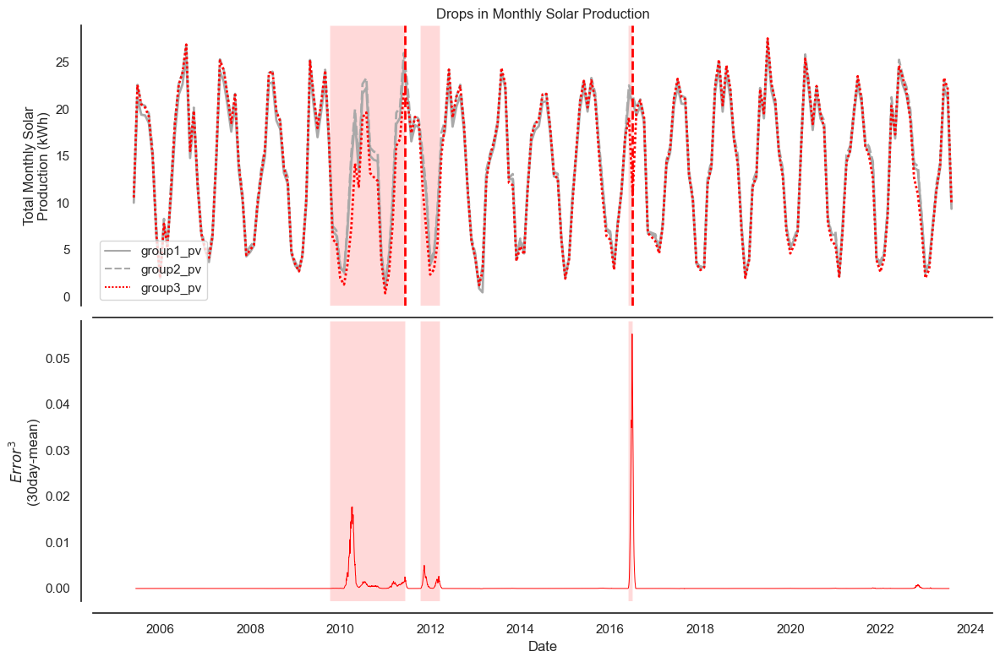

In [70]:
# solar production vs. 1 error plot
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True,
                                 constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g3_30_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# plot repairs and error periods
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax2.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plots
ax1.set(
    # xlabel = None,
    # xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production",
)
ax2.set(
    xlabel = "Date",
    ylabel = "$Error^3$\n(30day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/4261683370.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


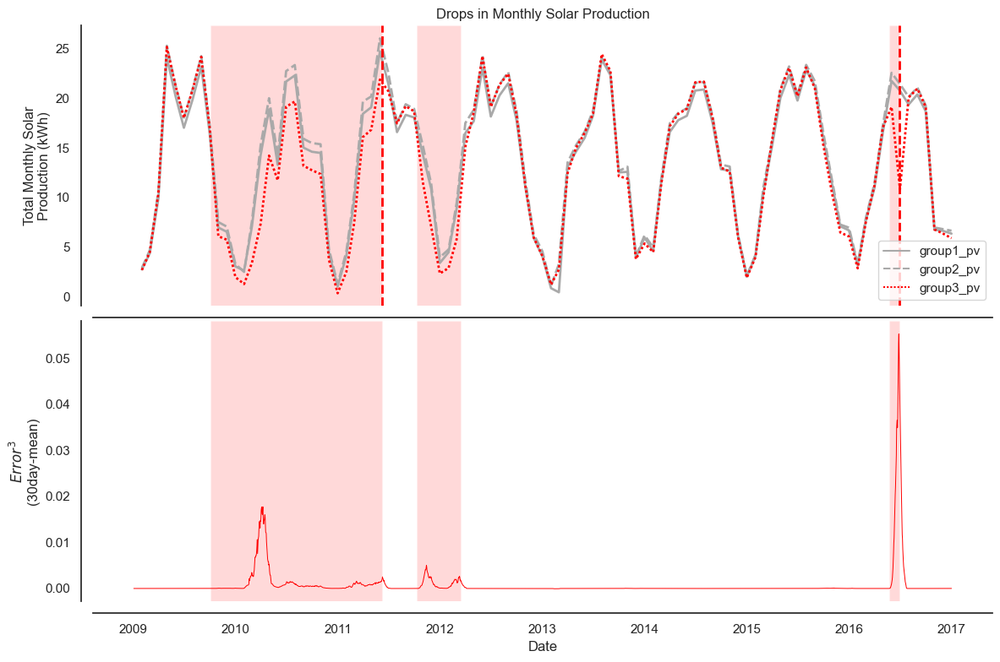

In [71]:
# zoomed solar production vs. 1 error plot
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True,
                                 constrained_layout=True, dpi=100,)
sns.lineplot(ax=ax1, linewidth=lw, palette=("darkgray", "darkgray", "red"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]].query('index < "2017.01.01" & index > "2009.01.01"'))
sns.lineplot(ax=ax2, data=df.query('date < "2017.01.01" & date > "2009.01.01"'), y="g3_30_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# plot repairs and error periods
for mini, maxi in defect_ranges3:
    ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)
    ax2.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

for date in idx_maintenance_g3:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="red", linestyle='--', lw=2)

# customize plots
ax1.set(
    # xlabel = None,
    # xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production",
)
ax2.set(
    xlabel = "Date",
    ylabel = "$Error^3$\n(30day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

### Defect Labelling Group 3 (H)

#### Overview for group 3 (H)
```py
# defective time ranges including first and last day
defect_ranges3 = [(datetime(2009,10, 4), datetime(2011,6, 9)),
                  (datetime(2011,10,10), datetime(2012,3,15)),
                  (datetime(2016, 5,22), datetime(2016,6,27))]
```
```py
idx_maintenance_g3 = [
    "09.06.2011",
    "27.06.2016",
    ]
```

In [72]:
df.head()

,date,group1_pv,group2_pv,group3_pv,panel_age,mean_pv_12,max_pv,g3_error_abs_mean,g3_error_rel_mean,g3_error_abs_max,...,g3_10_day_error_cubicabs_mean,g3_30_day_error_abs_mean,g3_30_day_error_rel_mean,g3_30_day_error_weight_mean,g3_30_day_error_abs_max,g3_30_day_error_rel_max,g3_30_day_error_weight_max,g3_30_day_error_cubicabs_mean,g3_5_day_error_cubic_mean,g3_30_day_error_cubic_mean
0,2005-05-18,0.000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2005-05-19,0.775,0.814286,0.731818,0,0.794643,0.814286,0.062825,0.079060,0.082468,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2005-05-20,0.875,0.971429,0.968182,0,0.923214,0.971429,-0.044968,-0.048708,0.003247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2005-05-21,0.775,0.814286,0.822727,0,0.794643,0.822727,-0.028084,-0.035342,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2005-05-22,0.550,0.571429,0.568182,0,0.560714,0.571429,-0.007468,-0.013318,0.003247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.432282e-08,NaN


In [73]:
df["sensor"] = 0 # high precision
df['sensor'] = np.where((df.date > '2021-08-26'), 1, df['sensor'])

In [74]:
# # label defects
# df["pv3_defect"] = 0 # version 1 (incorrect boundary cases)
# df['pv3_defect'] = np.where((df.date > '2009-10-04') & (df.date < '2011-06-09'), 1, df['pv3_defect'])
# df['pv3_defect'] = np.where((df.date > '2011-10-10') & (df.date < '2012-03-15'), 1, df['pv3_defect'])
# df['pv3_defect'] = np.where((df.date > '2016-05-20') & (df.date < '2016-06-27'), 1, df['pv3_defect'])

In [75]:
# label defects for group 3
df["pv3_defect"] = 0 # default false
df['pv3_defect'] = np.where((df.date >= '2009-10-04') & (df.date <= '2011-06-09'), 1, df['pv3_defect'])
df['pv3_defect'] = np.where((df.date >= '2011-10-10') & (df.date <= '2012-03-15'), 1, df['pv3_defect'])
df['pv3_defect'] = np.where((df.date >= '2016-05-22') & (df.date <= '2016-06-27'), 1, df['pv3_defect'])

In [76]:
# label defects for group 1
df["pv1_defect"] = 0 # default false
df['pv1_defect'] = np.where((df.date >= '2013-02-01') & (df.date <= '2013-02-17'), 1, df['pv1_defect'])

In [77]:
df.pv1_defect.value_counts()


pv1_defect
0    6613
1      17
Name: count, dtype: int64

In [78]:
# check for data imbalance
df.pv3_defect.value_counts()

pv3_defect
0    5821
1     809
Name: count, dtype: int64

In [79]:
# check for data imbalance (percentage)
df.pv3_defect.value_counts([0])

pv3_defect
0    0.877979
1    0.122021
Name: proportion, dtype: float64

In [80]:
df.columns

Index(['date', 'group1_pv', 'group2_pv', 'group3_pv', 'panel_age',
       'mean_pv_12', 'max_pv', 'g3_error_abs_mean', 'g3_error_rel_mean',
       'g3_error_abs_max', 'g3_error_rel_max', 'g3_error_weight_mean',
       'g3_error_weight_max', 'g3_error_cubicabs_mean',
       'g3_error_cubicabs_max', 'g3_5_day_error_rel_mean',
       'g3_5_day_error_abs_mean', 'g3_5_day_error_rel_max',
       'g3_5_day_error_abs_max', 'g3_5_day_error_weight_mean',
       'g3_5_day_error_weight_max', 'g3_5_day_error_cubicabs_mean',
       'g3_10_day_error_rel_mean', 'g3_10_day_error_abs_mean',
       'g3_10_day_error_rel_max', 'g3_10_day_error_abs_max',
       'g3_10_day_error_weight_mean', 'g3_10_day_error_weight_max',
       'g3_10_day_error_cubicabs_mean', 'g3_30_day_error_abs_mean',
       'g3_30_day_error_rel_mean', 'g3_30_day_error_weight_mean',
       'g3_30_day_error_abs_max', 'g3_30_day_error_rel_max',
       'g3_30_day_error_weight_max', 'g3_30_day_error_cubicabs_mean',
       'g3_5_day_error_cub

In [81]:
# extract minimal dataframe
df_labelled = df[["date", "group3_pv", "pv3_defect", "sensor"]].copy()
df_labelled.columns = ["date", "pv3", "pv3_defect", "sensor"]

In [82]:
df_labelled.tail()

,date,pv3,pv3_defect,sensor
6625,2023-07-08,0.977273,0,1
6626,2023-07-09,0.977273,0,1
6627,2023-07-10,0.750000,0,1
6628,2023-07-11,0.909091,0,1
6629,2023-07-12,0.522727,0,1


### Defect Labelling Group 1 (S)

In [83]:
# expected production
df["mean_pv_23"] = 0.5*(df.group2_pv + df.group3_pv)

# error compared to mean
# absolute = expected - actual
# relative = (expected - actual)/expected
# weighted = (expected - actual)*expected
df["g1_error_abs_mean"] = 0
df["g1_error_rel_mean"] = 0
for idx in range(len(df)):
    df.loc[idx, "g1_error_abs_mean"] = (df.loc[idx, "mean_pv_23"]-df.loc[idx, "group1_pv"])
    if df.loc[idx, "mean_pv_23"] != 0:
        df.loc[idx, "g1_error_rel_mean"] = (df.loc[idx, "mean_pv_23"]-df.loc[idx, "group1_pv"])/df.loc[idx, "mean_pv_23"]
df["g1_error_weight_mean"] = df.mean_pv_23 * df.g1_error_abs_mean
df['g1_error_cubic_mean'] = df.g1_error_abs_mean ** 3

# calculate rolling averages
# 5 days
df['g1_5_day_error_rel_mean'] = df.g1_error_rel_mean.rolling(5).mean()
df['g1_5_day_error_abs_mean'] = df.g1_error_abs_mean.rolling(5).mean()
df['g1_5_day_error_weight_mean'] = df.g1_error_weight_mean.rolling(5).mean()
df['g1_5_day_error_cubic_mean'] = df.g1_error_cubic_mean.rolling(5).mean()

# 10 days
df['g1_10_day_error_rel_mean'] = df.g1_error_rel_mean.rolling(10).mean()
df['g1_10_day_error_abs_mean'] = df.g1_error_abs_mean.rolling(10).mean()
df['g1_10_day_error_weight_mean'] = df.g1_error_weight_mean.rolling(10).mean()
df['g1_10_day_error_cubic_mean'] = df.g1_error_cubic_mean.rolling(10).mean()

# 30 days
df['g1_30_day_error_rel_mean'] = df.g1_error_rel_mean.rolling(30).mean()
df['g1_30_day_error_abs_mean'] = df.g1_error_abs_mean.rolling(30).mean()
df['g1_30_day_error_weight_mean'] = df.g1_error_weight_mean.rolling(30).mean()
df['g1_30_day_error_cubic_mean'] = df.g1_error_cubic_mean.rolling(30).mean()

In [84]:
# error compared to max
df["g1_error_abs_max"] = 0
df["g1_error_rel_max"] = 0
for idx in range(len(df)):
    df.loc[idx, "g1_error_abs_max"] = (df.loc[idx, "max_pv"]-df.loc[idx, "group1_pv"])
    if df.loc[idx, "mean_pv_23"] != 0:
        df.loc[idx, "g1_error_rel_max"] = (df.loc[idx, "max_pv"]-df.loc[idx, "group1_pv"])/df.loc[idx, "max_pv"]
df["g1_error_weight_max"] = df.mean_pv_23 * df.g1_error_abs_max
df['g1_error_cubic_max'] = df.g1_error_abs_max ** 3

# calculate rolling averages
# 5 days
df['g1_5_day_error_abs_max'] = df.g1_error_abs_max.rolling(5).mean()
df['g1_5_day_error_rel_max'] = df.g1_error_rel_max.rolling(5).mean()
df['g1_5_day_error_weight_max'] = df.g1_error_weight_max.rolling(5).mean()
df['g1_5_day_error_cubic_max'] = df.g1_error_cubic_max.rolling(5).mean()

# 5 days
df['g1_10_day_error_abs_max'] = df.g1_error_abs_max.rolling(10).mean()
df['g1_10_day_error_rel_max'] = df.g1_error_rel_max.rolling(10).mean()
df['g1_10_day_error_weight_max'] = df.g1_error_weight_max.rolling(10).mean()
df['g1_10_day_error_cubic_max'] = df.g1_error_cubic_max.rolling(10).mean()

# 5 days
df['g1_30_day_error_abs_max'] = df.g1_error_abs_max.rolling(30).mean()
df['g1_30_day_error_rel_max'] = df.g1_error_rel_max.rolling(30).mean()
df['g1_30_day_error_weight_max'] = df.g1_error_weight_max.rolling(30).mean()
df['g1_30_day_error_cubic_max'] = df.g1_error_cubic_max.rolling(30).mean()

In [85]:
idx_maintenance_g1 = [
    "17.02.2013", # S repair - group 1
    "17.10.2013", # S repair - group 1
    ]

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/1391896042.py:63: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


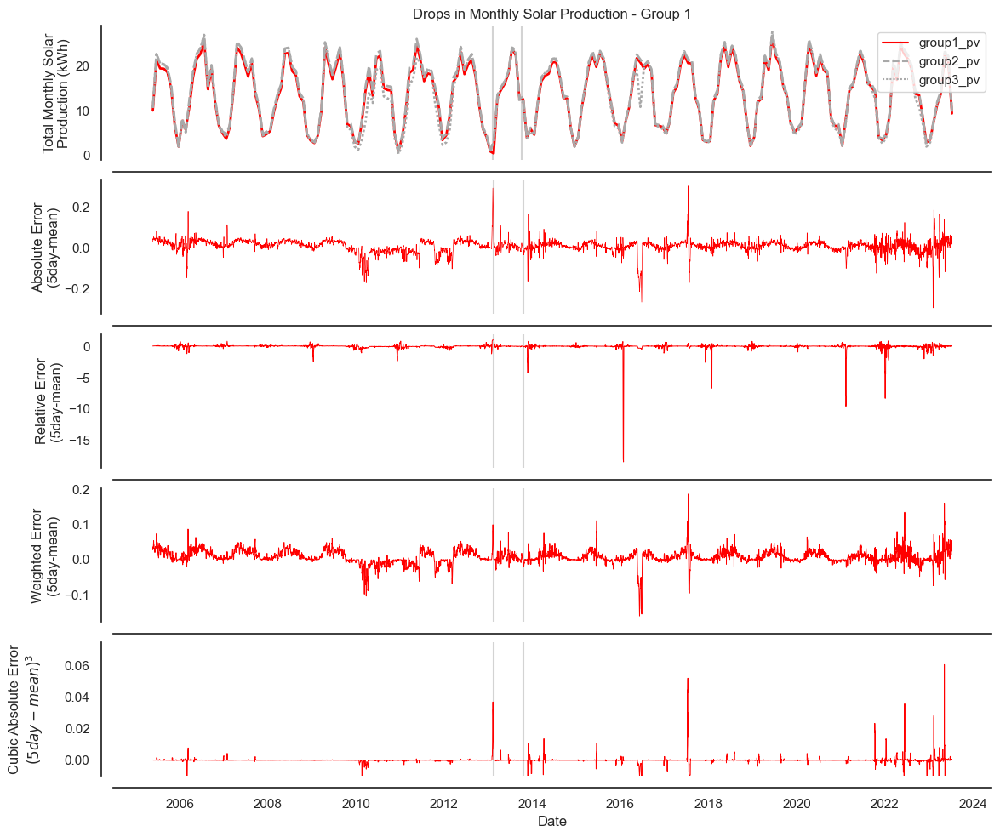

In [86]:
# plot solar production and error metrics mean for group 1
_, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 10), sharex=False,
                                 constrained_layout=True, dpi=100,)

for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax2.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax3.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax4.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax5.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)

# # plot repairs and error periods
# for mini, maxi in defect_ranges3:
#     ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

sns.lineplot(ax=ax1, linewidth=lw, palette=("red", "darkgray", "darkgray"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g1_5_day_error_abs_mean", x="date", 
             color="red", linewidth=0.5)
sns.lineplot(ax=ax3, data=df, y="g1_5_day_error_rel_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax4, data=df, y="g1_5_day_error_weight_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax5, data=df, y="g1_5_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# customize plots
ax1.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production - Group 1",
)
ax2.axhline(0, color="black", linewidth=0.4) # zero baseline
ax2.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Absolute Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax3.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Relative Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax4.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Weighted Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set(
    xlabel = "Date",
    ylabel = "Cubic Absolute Error\n$(5day-mean)^3$\n",
    ylim = (-0.01, 0.075)
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/1570799143.py:63: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


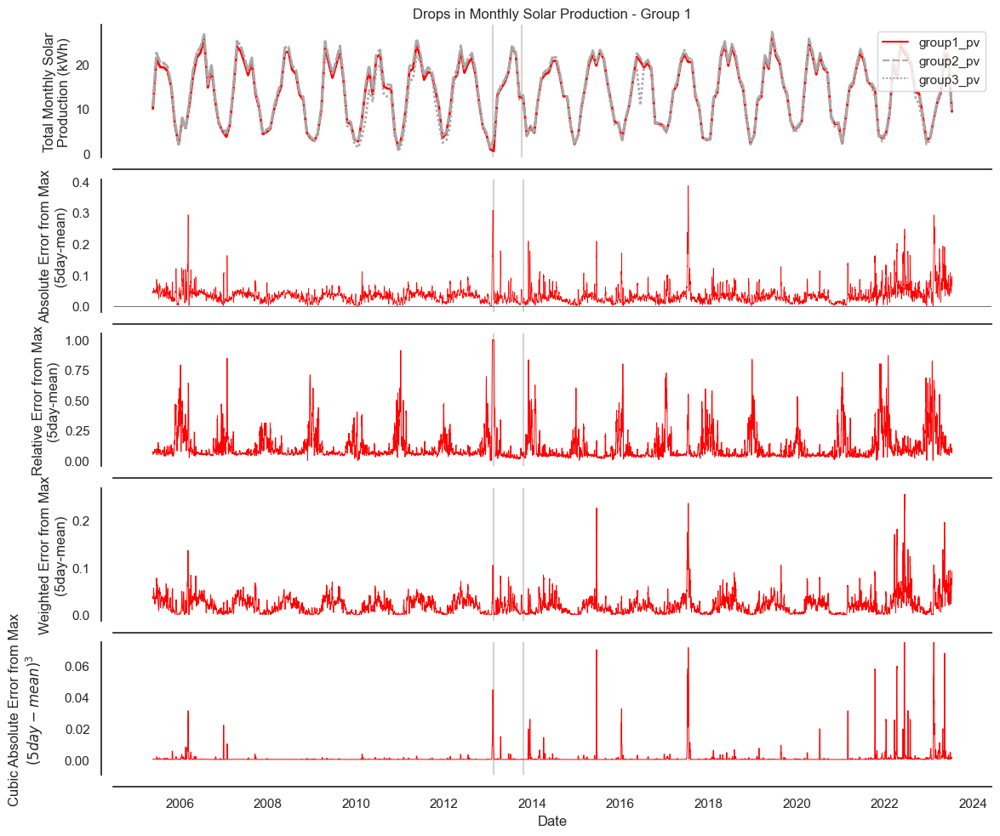

In [87]:
# plot solar production and error metrics max for group 1
_, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 10), sharex=False,
                                 constrained_layout=True, dpi=100,)

for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    ax1.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax2.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax3.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax4.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
    ax5.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)

# # plot repairs and error periods
# for mini, maxi in defect_ranges3:
#     ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

sns.lineplot(ax=ax1, linewidth=lw, palette=("red", "darkgray", "darkgray"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g1_5_day_error_abs_max", x="date", 
             color="red", linewidth=0.5)
sns.lineplot(ax=ax3, data=df, y="g1_5_day_error_rel_max", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax4, data=df, y="g1_5_day_error_weight_max", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax5, data=df, y="g1_5_day_error_cubic_max", x="date", 
             color="red", linewidth=0.7)

# customize plots
ax1.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production - Group 1",
)
ax2.axhline(0, color="black", linewidth=0.4) # zero baseline
ax2.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Absolute Error from Max\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax3.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Relative Error from Max\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax4.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Weighted Error from Max\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set(
    xlabel = "Date",
    ylabel = "Cubic Absolute Error from Max\n$(5day-mean)^3$\n",
    ylim = (-0.01, 0.075)
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/784630961.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


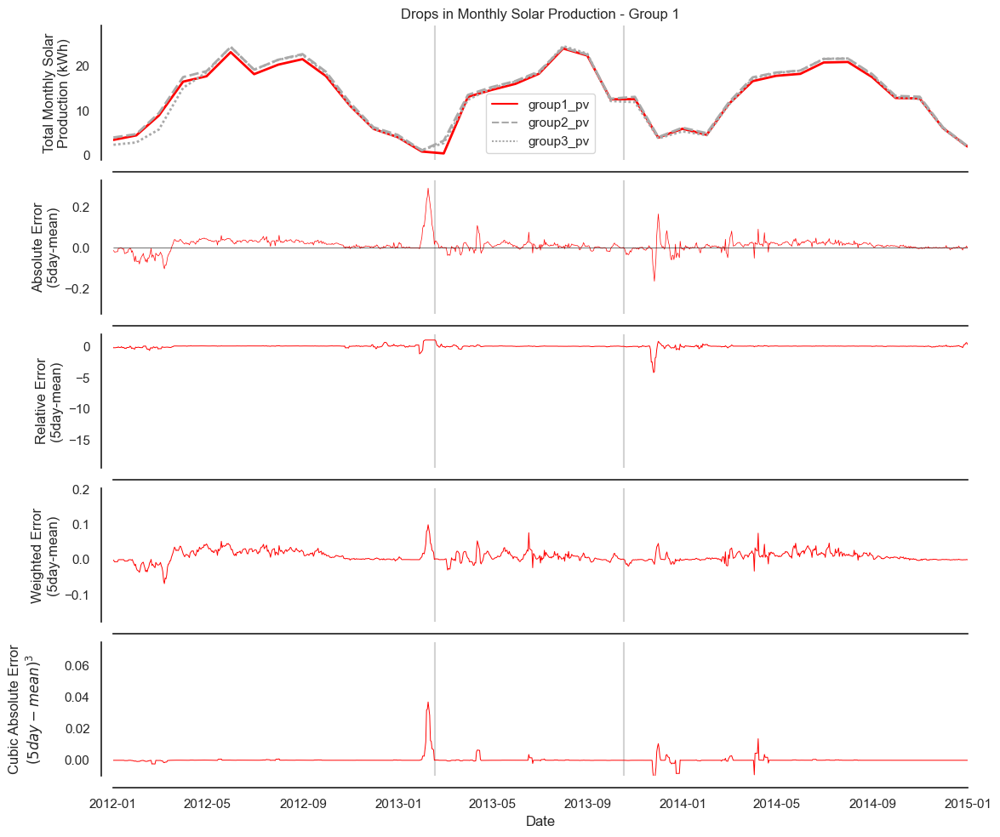

In [88]:
# plot solar production and error metrics mean for group 1 - zoomed
_, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 10), sharex=False,
                                 constrained_layout=True, dpi=100,)

for date in idx_maintenance_g1:
    date_line = pd.to_datetime(date, format="%d.%m.%Y")
    for ax in (ax1, ax2, ax3, ax4, ax5):
        ax.axvline(date_line, color="darkgray", linestyle='-', lw=1.5, alpha=0.5)
        # ax.set_xlim(datetime(2016,1,1), datetime(2018,1,1))
        ax.set_xlim(datetime(2012,1,1), datetime(2015,1,1))

# # plot repairs and error periods
# for mini, maxi in defect_ranges3:
#     ax1.axvspan(xmin=mini, xmax=maxi, facecolor="red", alpha=0.15)

sns.lineplot(ax=ax1, linewidth=lw, palette=("red", "darkgray", "darkgray"),
             data=df_monthly[["group1_pv", "group2_pv", "group3_pv"]])
sns.lineplot(ax=ax2, data=df, y="g1_5_day_error_abs_mean", x="date", 
             color="red", linewidth=0.5)
sns.lineplot(ax=ax3, data=df, y="g1_5_day_error_rel_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax4, data=df, y="g1_5_day_error_weight_mean", x="date", 
             color="red", linewidth=0.7)
sns.lineplot(ax=ax5, data=df, y="g1_5_day_error_cubic_mean", x="date", 
             color="red", linewidth=0.7)

# customize plots
ax1.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Total Monthly Solar\nProduction (kWh)",
    title = "Drops in Monthly Solar Production - Group 1",
)
ax2.axhline(0, color="black", linewidth=0.4) # zero baseline
ax2.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Absolute Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax3.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Relative Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax4.set(
    xlabel = None,
    xticklabels=[],
    ylabel = "Weighted Error\n(5day-mean)",
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
ax5.set(
    xlabel = "Date",
    ylabel = "Cubic Absolute Error\n$(5day-mean)^3$\n",
    ylim = (-0.01, 0.075)
    # title = "Total Monthly Solar Production of All Groups and Time of Repair",
)
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
sns.set_style("white")
sns.despine(offset=10, trim=False)
plt.tight_layout()
plt.show()

In [89]:
# time window 1
date_list =\
    df[(df.g1_30_day_error_abs_mean>0.03) &\
    (df.date>datetime(2012, 10, 1)) & (df.date<datetime(2013, 6, 1))].date
str_list = sorted([datetime.strftime(x, '%Y-%m-%d') for x in date_list])
print("Issue 1 start", min(str_list))
print("Issue 1 end", max(str_list))
print("; ".join(str_list))


Issue 1 start 2013-02-04
Issue 1 end 2013-03-08
2013-02-04; 2013-02-05; 2013-02-06; 2013-02-07; 2013-02-08; 2013-02-09; 2013-02-10; 2013-02-11; 2013-02-12; 2013-02-13; 2013-02-14; 2013-02-15; 2013-02-16; 2013-02-17; 2013-02-18; 2013-02-19; 2013-02-20; 2013-02-21; 2013-02-22; 2013-02-23; 2013-02-24; 2013-02-25; 2013-02-26; 2013-02-27; 2013-02-28; 2013-03-01; 2013-03-02; 2013-03-03; 2013-03-04; 2013-03-05; 2013-03-06; 2013-03-07; 2013-03-08


In [90]:
# interval 1 - start
df[(df.date > datetime(2013, 1, 1)) & (df.date < datetime(2013, 2, 15))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g1_error_abs_mean", "g1_error_rel_mean"]]
# error rises starting from 2013-02-01 (maybe already 01-31)

,date,group1_pv,group2_pv,group3_pv,g1_error_abs_mean,g1_error_rel_mean
2786,2013-01-02,0.0875,0.092857,0.077273,-0.002435,-0.028626
2787,2013-01-03,0.0125,0.021429,0.011364,0.003896,0.237624
2788,2013-01-04,0.0125,0.021429,0.018182,0.007305,0.368852
2789,2013-01-05,0.0375,0.035714,0.036364,-0.001461,-0.040541
2790,2013-01-06,0.1250,0.135714,0.113636,-0.000325,-0.002604
2791,2013-01-07,0.1500,0.157143,0.159091,0.008117,0.051335
2792,2013-01-08,0.0125,0.028571,0.006818,0.005195,0.293578
2793,2013-01-09,0.0250,0.014286,0.020455,-0.007630,-0.439252
2794,2013-01-10,0.0250,0.021429,0.009091,-0.009740,-0.638298
2795,2013-01-11,0.0250,0.042857,0.054545,0.023701,0.486667


In [91]:
# interval 1 - end
df[(df.date > datetime(2013, 2, 1)) & (df.date < datetime(2013, 3, 20))]\
    [["date", "group1_pv", "group2_pv", "group3_pv", "g1_error_abs_mean", "g1_error_rel_mean"]]
# error gone since 2013-02-18 (repaired on 2013-02-17)

,date,group1_pv,group2_pv,group3_pv,g1_error_abs_mean,g1_error_rel_mean
2817,2013-02-02,0.0000,0.028571,0.068182,0.048377,1.000000
2818,2013-02-03,0.0000,0.092857,0.047727,0.070292,1.000000
2819,2013-02-04,0.0000,0.292857,0.272727,0.282792,1.000000
2820,2013-02-05,0.0000,0.292857,0.286364,0.289610,1.000000
2821,2013-02-06,0.0000,0.528571,0.436364,0.482468,1.000000
2822,2013-02-07,0.0000,0.135714,0.129545,0.132630,1.000000
2823,2013-02-08,0.0000,0.285714,0.286364,0.286039,1.000000
2824,2013-02-09,0.0000,0.121429,0.088636,0.105032,1.000000
2825,2013-02-10,0.0000,0.150000,0.140909,0.145455,1.000000
2826,2013-02-11,0.0000,0.328571,0.309091,0.318831,1.000000


### Check for Data Inconsistencies

#### Full Plots

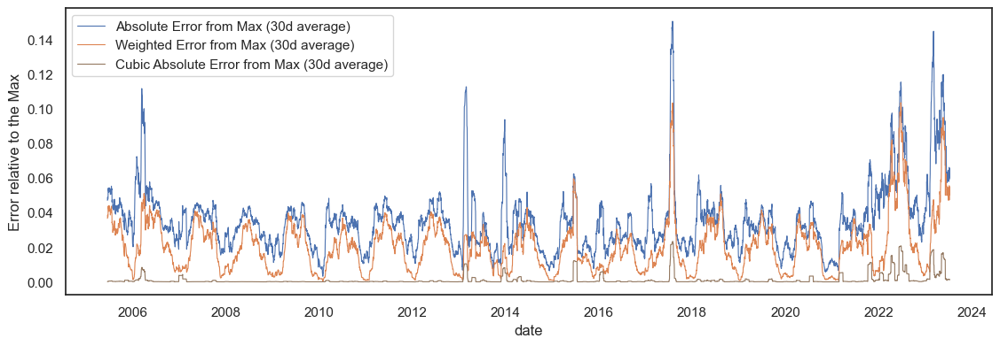

In [92]:
plt.subplots(figsize=(12,4))
sns.lineplot(data=df, y="g1_30_day_error_abs_max", x="date", linewidth=0.8,
             label="Absolute Error from Max (30d average)")
# sns.lineplot(data=df, y="g1_30_day_error_rel_max", x="date", linewidth=0.8,
#              label="Relative Error from Max (30d average)") # too big
sns.lineplot(data=df, y="g1_30_day_error_weight_max", x="date", linewidth=0.8,
             label="Weighted Error from Max (30d average)")
sns.lineplot(data=df, y="g1_30_day_error_cubic_max", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Max (30d average)", color="C5").set(ylabel="Error relative to the Max")
plt.legend()
plt.show()

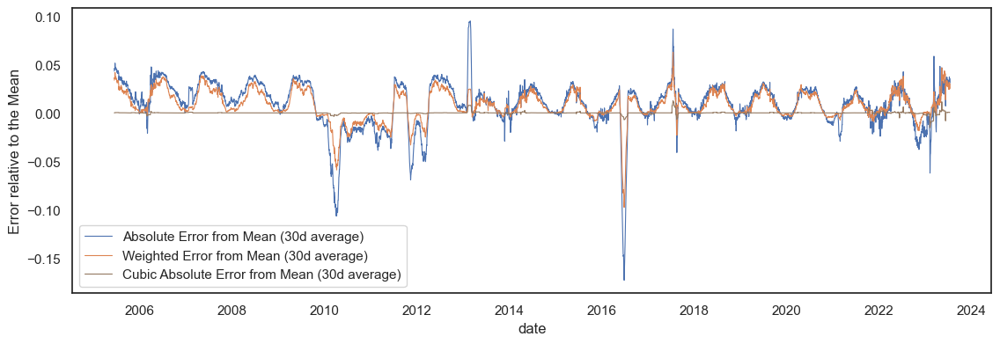

In [93]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_30_day_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (30d average)")
# sns.lineplot(data=df, y="g1_30_day_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (30d average)") # too big
sns.lineplot(data=df, y="g1_30_day_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (30d average)")
sns.lineplot(data=df, y="g1_30_day_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (30d average)", color="C5").set(ylabel="Error relative to the Mean")
plt.legend()
plt.show()

#### Zoomed Time Windows

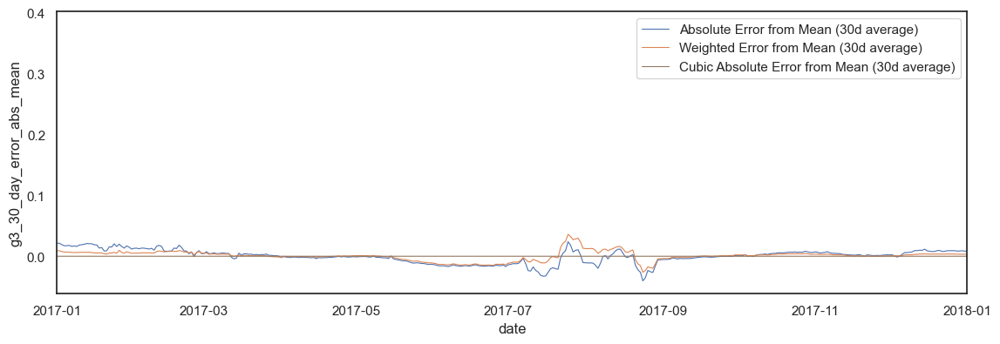

In [94]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g3_30_day_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (30d average)")
# sns.lineplot(data=df, y="g3_30_day_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (30d average)") # too big
sns.lineplot(data=df, y="g3_30_day_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (30d average)")
sns.lineplot(data=df, y="g3_30_day_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (30d average)", color="C5")
fig.set_xlim(datetime(2017, 1, 1), datetime(2018, 1, 1))
plt.legend()
plt.show()

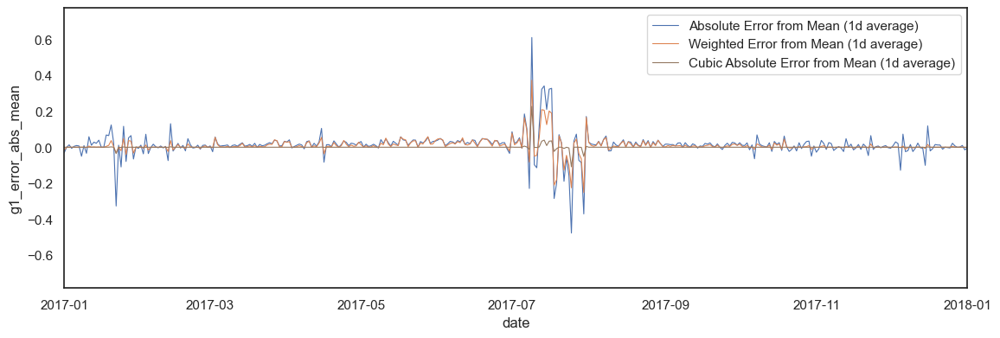

In [95]:
# zoom - daily error!
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (1d average)")
# sns.lineplot(data=df, y="g1_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (1d average)") # too big
sns.lineplot(data=df, y="g1_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (1d average)")
sns.lineplot(data=df, y="g1_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (1d average)", color="C5")
fig.set_xlim(datetime(2017, 1, 1), datetime(2018, 1, 1))
plt.legend()
plt.show()

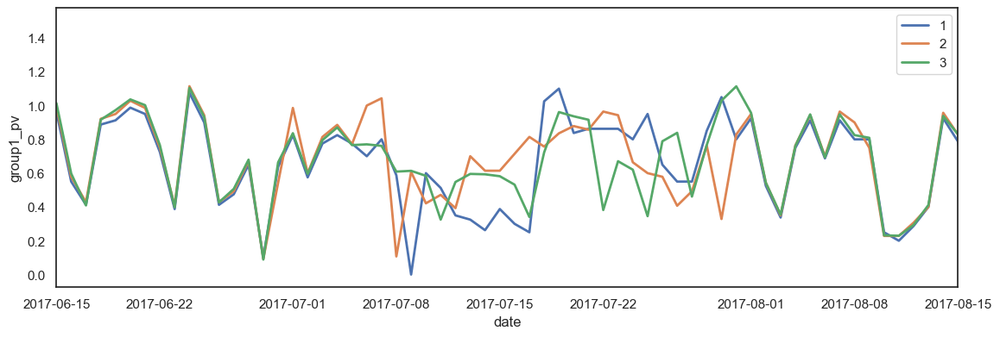

In [96]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(linewidth=lw, data=df, y="group1_pv", x="date", label="1")
sns.lineplot(linewidth=lw, data=df, y="group2_pv", x="date", label="2")
sns.lineplot(linewidth=lw, data=df, y="group3_pv", x="date", label="3")
fig.set_xlim(datetime(2017, 6, 15), datetime(2017, 8, 15))
plt.legend()
plt.show()


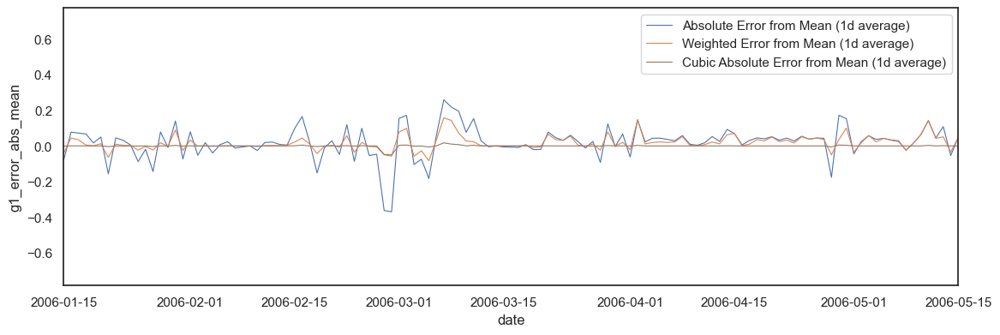

In [97]:
# zoom - daily error!
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (1d average)")
# sns.lineplot(data=df, y="g1_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (1d average)") # too big
sns.lineplot(data=df, y="g1_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (1d average)")
sns.lineplot(data=df, y="g1_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (1d average)", color="C5")
fig.set_xlim(datetime(2006, 1, 15), datetime(2006, 5, 15))
plt.legend()
plt.show()

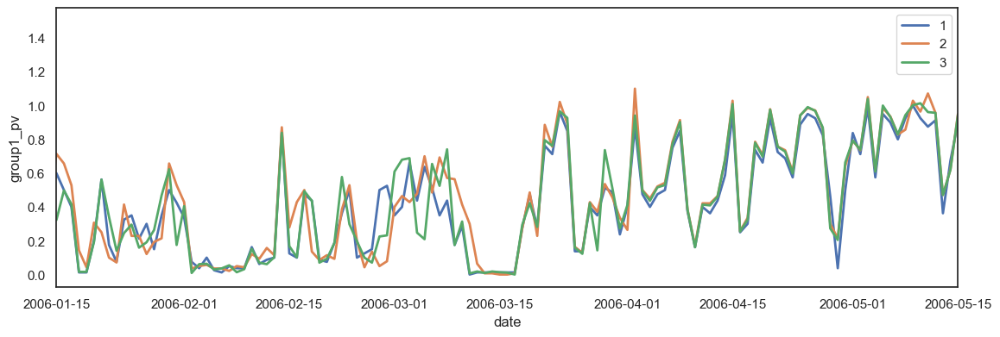

In [98]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(linewidth=lw, data=df, y="group1_pv", x="date", label="1")
sns.lineplot(linewidth=lw, data=df, y="group2_pv", x="date", label="2")
sns.lineplot(linewidth=lw, data=df, y="group3_pv", x="date", label="3")
fig.set_xlim(datetime(2006, 1, 15), datetime(2006, 5, 15))
plt.legend()
plt.show()


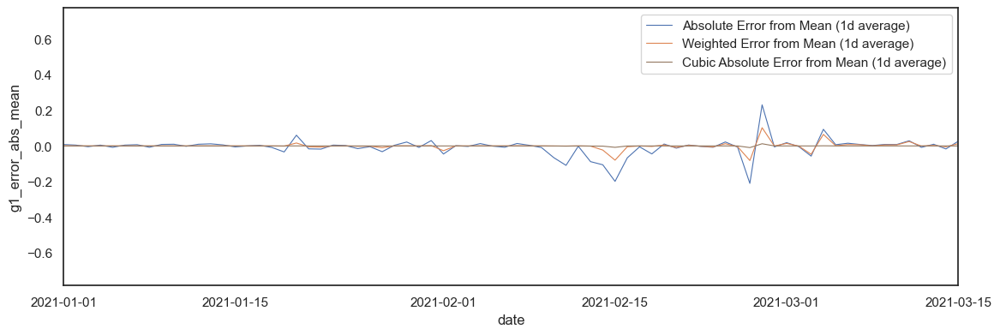

In [99]:
# zoom - daily error!
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (1d average)")
# sns.lineplot(data=df, y="g1_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (1d average)") # too big
sns.lineplot(data=df, y="g1_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (1d average)")
sns.lineplot(data=df, y="g1_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (1d average)", color="C5")
fig.set_xlim(datetime(2021, 1, 1), datetime(2021, 3, 15))
plt.legend()
plt.show()

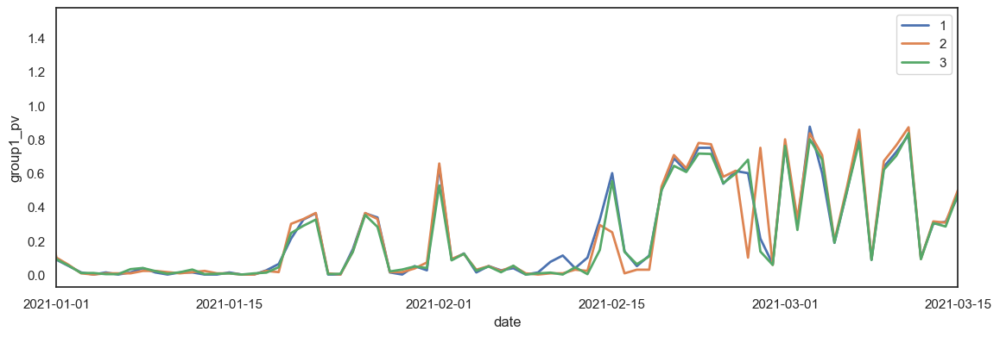

In [100]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(linewidth=lw, data=df, y="group1_pv", x="date", label="1")
sns.lineplot(linewidth=lw, data=df, y="group2_pv", x="date", label="2")
sns.lineplot(linewidth=lw, data=df, y="group3_pv", x="date", label="3")
fig.set_xlim(datetime(2021, 1, 1), datetime(2021, 3, 15))
plt.legend()
plt.show()


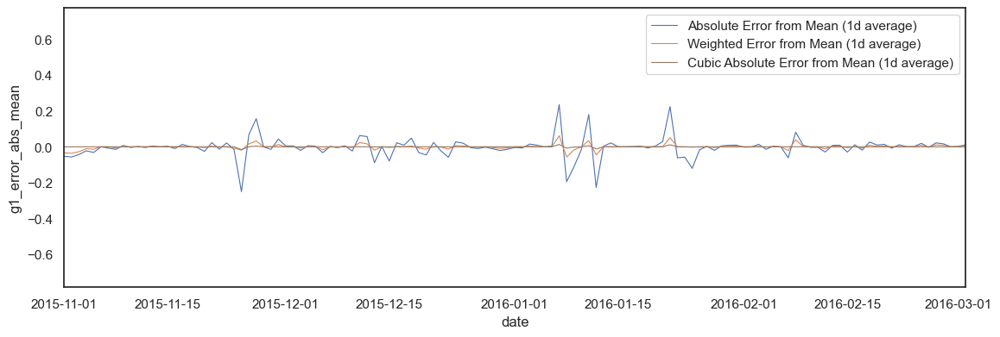

In [101]:
# zoom - daily error!
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (1d average)")
# sns.lineplot(data=df, y="g1_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (1d average)") # too big
sns.lineplot(data=df, y="g1_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (1d average)")
sns.lineplot(data=df, y="g1_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (1d average)", color="C5")
fig.set_xlim(datetime(2015, 11, 1), datetime(2016, 3, 2))
plt.legend()
plt.show()

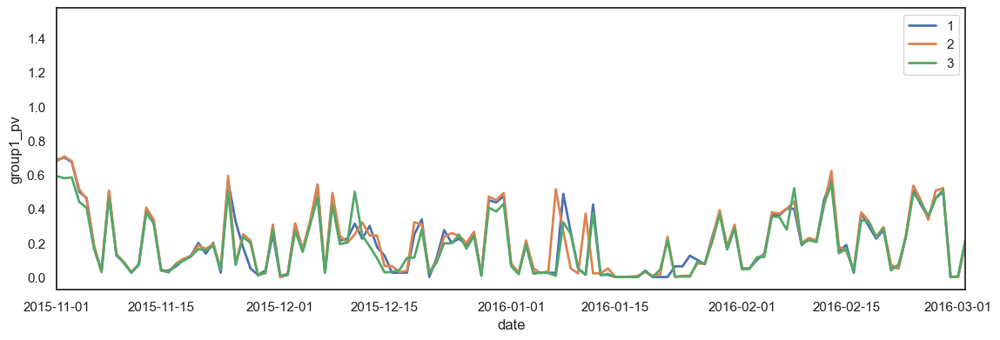

In [102]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(linewidth=lw, data=df, y="group1_pv", x="date", label="1")
sns.lineplot(linewidth=lw, data=df, y="group2_pv", x="date", label="2")
sns.lineplot(linewidth=lw, data=df, y="group3_pv", x="date", label="3")
fig.set_xlim(datetime(2015, 11, 1), datetime(2016, 3, 2))
plt.legend()
plt.show()


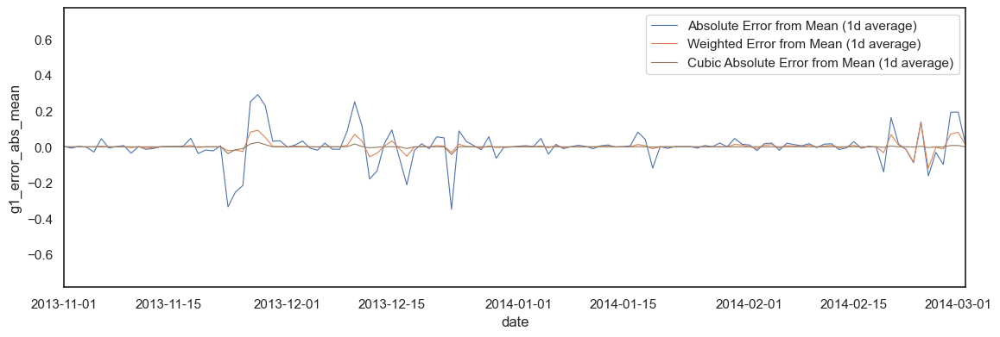

In [103]:
# zoom - daily error!
plt.subplots(figsize=(12,4))
fig = sns.lineplot(data=df, y="g1_error_abs_mean", x="date", linewidth=0.8,
             label="Absolute Error from Mean (1d average)")
# sns.lineplot(data=df, y="g1_error_rel_mean", x="date", linewidth=0.8,
#              label="Relative Error from Mean (1d average)") # too big
sns.lineplot(data=df, y="g1_error_weight_mean", x="date", linewidth=0.8,
             label="Weighted Error from Mean (1d average)")
sns.lineplot(data=df, y="g1_error_cubic_mean", x="date", linewidth=0.8,
             label="Cubic Absolute Error from Mean (1d average)", color="C5")
fig.set_xlim(datetime(2013, 11, 1), datetime(2014, 3, 2))
plt.legend()
plt.show()

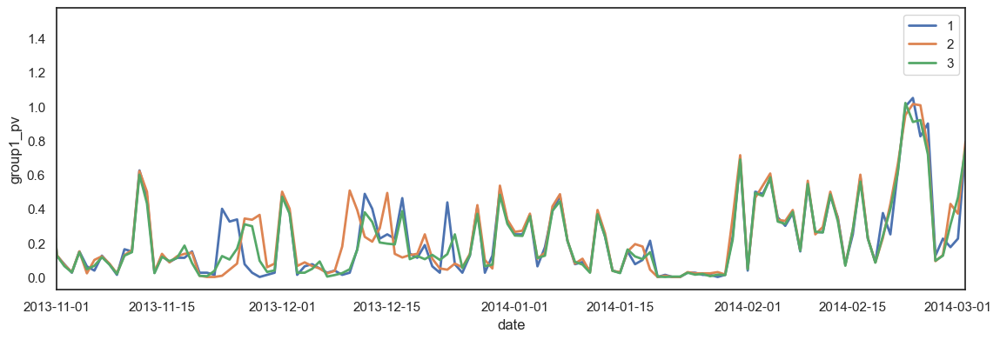

In [104]:
plt.subplots(figsize=(12,4))
fig = sns.lineplot(linewidth=lw, data=df, y="group1_pv", x="date", label="1")
sns.lineplot(linewidth=lw, data=df, y="group2_pv", x="date", label="2")
sns.lineplot(linewidth=lw, data=df, y="group3_pv", x="date", label="3")
fig.set_xlim(datetime(2013, 11, 1), datetime(2014, 3, 2))
plt.legend()
plt.show()


In [105]:
# extract minimal dataframe
df_labelled_gr1 = df[["date", "group1_pv", "pv1_defect", "sensor"]].copy()
df_labelled_gr1.columns = ["date", "pv1", "pv1_defect", "sensor"]

### Notes
- less digits (low precision of measurement!)
- higher variation due to new counter - even lower precision in measurement!
- a few short time windows with unexpected variability - maybe approximations made or shifted lines when inputting data

## Import Weather Data

- all weather information as features
- 'panel_age' included and encoded

In [106]:
# Read csv file 
weather_file = "../data/pv_households/GR/weather_goerlitz.csv"
df_weather = pd.read_csv(weather_file, parse_dates=["MESS_DATUM"])

# Drop useless information
df_weather.drop(columns=["Unnamed: 0", "index", "STATIONS_ID", 
                         "eor", "QN_3", "QN_4"], inplace=True)

rename_dict = {
    "MESS_DATUM": "date",
    "FX": "max_windgust",
    "FM": "mean_wind_velocity",
    "RSK": "precipitation_height",
    "RSKF": "precipitation_form",
    "SDK": "sunshine_duration",
    "SHK_TAG": "snow_depth",
    "NM": "mean_cloud_cover",
    "VPM": "mean_vapor_pressure",
    "PM": "mean_pressure",
    "TMK": "mean_temperature",
    "UPM": "mean_relative_humidity",
    "TXK": "max_temperature",
    "TNK": "min_temperature",
    "TGK": "min_air_temperature"
    # "QN_3": "quality_level_3",
    # "QN_4": "quality_level_4",
}

# Rename columns
df_weather.rename(columns=rename_dict, inplace=True)

# Set the index
df_weather.set_index(["date"], inplace=True)

# Filter out only the weather data within the same range as the household data
df_weather = df_weather.query('index > "2005-05-17" & index < "2023-07-13"')
show_info(df_weather)
df_weather.head()

,max_windgust,mean_wind_velocity,precipitation_height,precipitation_form,sunshine_duration,snow_depth,mean_cloud_cover,mean_vapor_pressure,mean_pressure,mean_temperature,mean_relative_humidity,max_temperature,min_temperature,min_air_temperature,color_tmk
date,,,,,,,,,,,,,,,
2005-05-18,8.2,3.2,0.0,6.0,0.0,0.0,7.3,10.1,989.8,7.9,94.0,9.6,4.4,1.6,0
2005-05-19,8.9,1.5,0.0,0.0,12.0,0.0,2.5,7.5,996.7,9.4,67.0,15.0,2.6,-0.1,0
2005-05-20,7.2,2.0,0.0,0.0,13.5,0.0,3.7,8.5,994.1,11.9,64.0,18.1,3.6,1.1,0
2005-05-21,11.1,3.5,0.0,6.0,9.5,0.0,6.0,11.0,987.5,16.7,59.0,23.6,6.5,4.1,0
2005-05-22,9.3,2.1,0.0,6.0,4.4,0.0,6.3,14.1,985.2,17.6,71.0,22.0,13.0,10.5,0


### Remove Duplicates

- duplicates from merging recent and historical weather data due to time overlap

In [107]:
# different table lengths - duplicates in weather table
print(df_labelled.shape)
print(df_weather.shape)

(6630, 4)
(6980, 15)


In [108]:
print(df_labelled.date.min(),df_labelled.date.max(), df_labelled.date.nunique())
print(df_weather.index.min(),df_weather.index.max(), df_weather.index.nunique())

2005-05-18 00:00:00 2023-07-12 00:00:00 6630
2005-05-18 00:00:00 2023-07-12 00:00:00 6630


In [109]:
df_weather[df_weather.index.duplicated()]

# 350 rows × 17 columns

,max_windgust,mean_wind_velocity,precipitation_height,precipitation_form,sunshine_duration,snow_depth,mean_cloud_cover,mean_vapor_pressure,mean_pressure,mean_temperature,mean_relative_humidity,max_temperature,min_temperature,min_air_temperature,color_tmk
date,,,,,,,,,,,,,,,
2022-01-16,14.1,6.2,0.3,8.0,5.450,0.0,7.5,5.6,992.31,1.0,84.17,3.5,-2.2,-3.6,0
2022-01-17,21.1,7.0,3.2,8.0,0.000,0.0,5.2,6.2,992.56,2.3,85.92,4.6,-0.5,-1.7,0
2022-01-18,8.6,3.3,0.0,6.0,0.050,0.0,6.5,5.8,1005.20,1.0,87.92,2.4,-0.6,-1.5,0
2022-01-19,14.8,6.0,0.6,8.0,7.250,0.0,6.3,5.8,994.68,1.5,84.50,2.7,-0.3,-1.0,0
2022-01-20,19.9,6.7,1.0,8.0,1.933,0.0,7.0,5.0,986.03,0.3,79.38,2.8,-2.3,-2.7,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,13.5,5.5,0.0,6.0,0.350,0.0,6.4,6.1,994.29,3.3,78.50,5.2,0.1,-1.9,0
2022-12-28,16.8,8.5,0.3,6.0,1.050,0.0,7.6,6.5,988.86,4.2,78.88,6.8,1.2,-0.6,0
2022-12-29,17.4,8.8,0.2,6.0,2.250,0.0,7.4,7.6,981.20,7.9,71.75,9.9,5.8,4.4,0


In [110]:
# Create a boolean mask for duplicated indices
mask = df_weather.index.duplicated(keep='first')

# Use the mask to drop the duplicated rows
df_weather = df_weather[~mask]
df_weather.shape

(6630, 15)

In [111]:
df_weather = add_date_features(df_weather)
df_weather.week = df_weather.week.astype(int) # otherwise warning when calculating mode
df_weather.shape

(6630, 20)

### Fill Weather NaNs

In [112]:
show_info(df_weather)


,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,max_windgust,float64,6616,0.21,238,...
1,mean_wind_velocity,float64,6605,0.38,109,...
2,precipitation_height,float64,6630,0.00,244,...
3,precipitation_form,float64,6630,0.00,5,"{6.0: 3243, 0.0: 2334, 8.0: 634, 7.0: 399, 4.0..."
4,sunshine_duration,float64,6609,0.32,557,...
5,snow_depth,float64,6182,6.76,36,...
6,mean_cloud_cover,float64,6619,0.17,81,...
7,mean_vapor_pressure,float64,6627,0.05,210,...
8,mean_pressure,float64,6627,0.05,1078,...
9,mean_temperature,float64,6630,0.00,410,...


<Axes: >

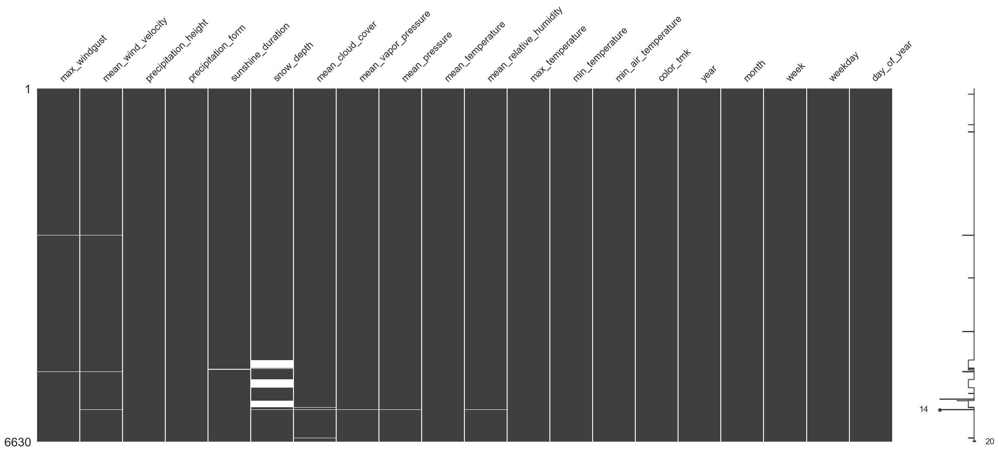

In [113]:
msno.matrix(df_weather)

In [114]:
df_weather.fillna(method="backfill", inplace=True)

## Merge Solar and Weather Data

In [115]:
# merge defect-labelled solar production dataframe (group 3) and weather data
df_labelled_weather_gr3 = df_labelled.set_index("date")
df_labelled_weather_gr3 = df_labelled_weather_gr3.join(df_weather)

df_labelled_weather_gr3["precipitation_form"] = df_labelled_weather_gr3["precipitation_form"].astype("int")

In [116]:
# merge defect-labelled solar production dataframe (group 1) and weather data
df_labelled_weather_gr1 = df_labelled_gr1.set_index("date")
df_labelled_weather_gr1 = df_labelled_weather_gr1.join(df_weather)
df_labelled_weather_gr1["precipitation_form"] = df_labelled_weather_gr1["precipitation_form"].astype("int")

### EDA - Solar & Weather

In [117]:
show_info(df_labelled_weather_gr3)

,Column,Dtype,Non-Null Count,Missing%,Unique Count,Unique Values
0,pv3,float64,6630,0.0,1743,...
1,pv3_defect,int64,6630,0.0,2,"{0: 5821, 1: 809}"
2,sensor,int64,6630,0.0,2,"{0: 5945, 1: 685}"
3,max_windgust,float64,6630,0.0,238,...
4,mean_wind_velocity,float64,6630,0.0,109,...
5,precipitation_height,float64,6630,0.0,244,...
6,precipitation_form,int64,6630,0.0,5,"{6: 3243, 0: 2334, 8: 634, 7: 399, 4: 20}"
7,sunshine_duration,float64,6630,0.0,557,...
8,snow_depth,float64,6630,0.0,36,...
9,mean_cloud_cover,float64,6630,0.0,81,...


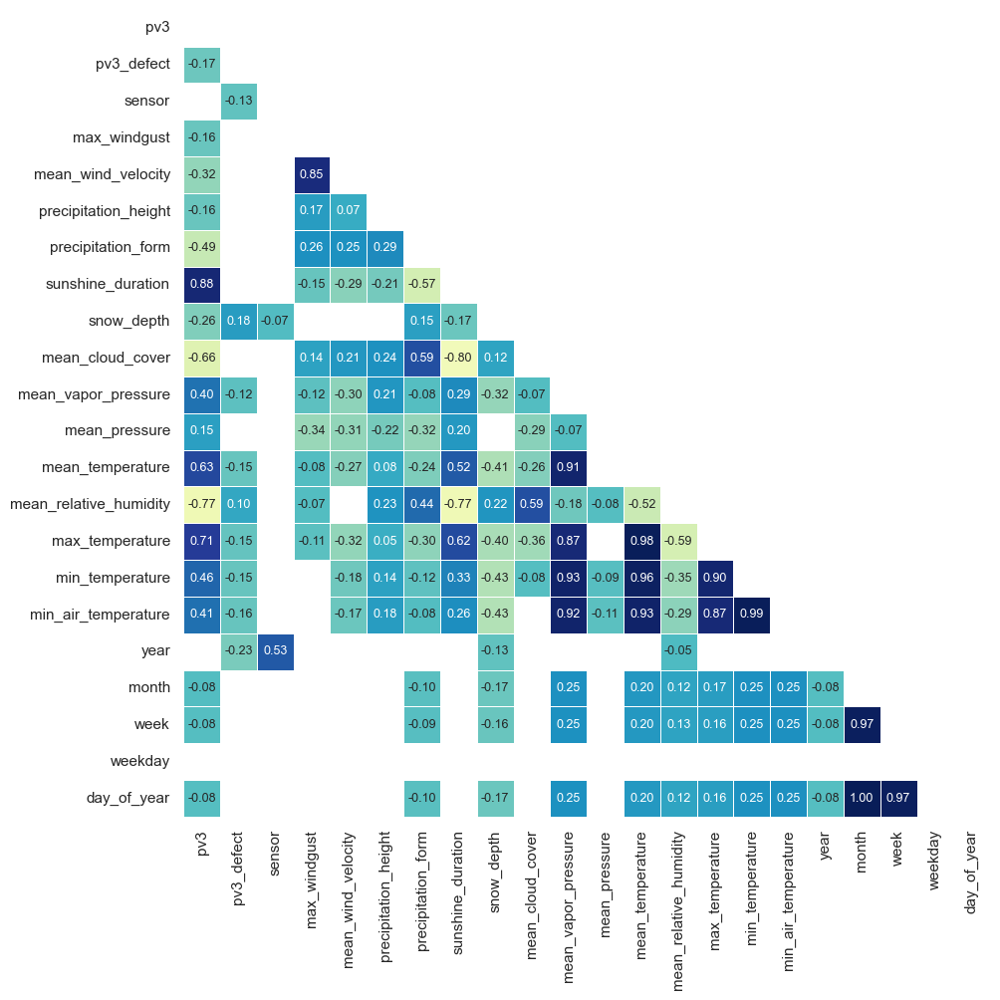

In [118]:
drop_cols = ["year", "month", "week", "weekday", "color_tmk", "day_of_year",
            "mean_temperature", "min_temperature", "min_air_temperature",
            "mean_cloud_cover", "max_windgust", "mean_vapor_pressure"]
drop_cols = ["color_tmk"]     
plot_corr(df_labelled_weather_gr3.drop(columns=drop_cols), filter_threshold=0.05, mask=True)

In [119]:
model_df_gr3 = df_labelled_weather_gr3.copy()
model_df_gr3.drop(columns=drop_cols, inplace=True) # drop "tmk_col"
model_df_gr3.columns 

Index(['pv3', 'pv3_defect', 'sensor', 'max_windgust', 'mean_wind_velocity',
       'precipitation_height', 'precipitation_form', 'sunshine_duration',
       'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure',
       'mean_pressure', 'mean_temperature', 'mean_relative_humidity',
       'max_temperature', 'min_temperature', 'min_air_temperature', 'year',
       'month', 'week', 'weekday', 'day_of_year'],
      dtype='object')

In [120]:
model_df_gr1 = df_labelled_weather_gr1.copy()
model_df_gr1.drop(columns=drop_cols, inplace=True) # drop "tmk_col"
model_df_gr1.columns 

Index(['pv1', 'pv1_defect', 'sensor', 'max_windgust', 'mean_wind_velocity',
       'precipitation_height', 'precipitation_form', 'sunshine_duration',
       'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure',
       'mean_pressure', 'mean_temperature', 'mean_relative_humidity',
       'max_temperature', 'min_temperature', 'min_air_temperature', 'year',
       'month', 'week', 'weekday', 'day_of_year'],
      dtype='object')

In [121]:
path = "../data/pv_households/GR/classification/"

if not os.path.exists(path):
    os.makedirs(path)
    
model_df_gr3.to_csv(path+"Group3_defects_1_labelled_with_weather_daily%s.csv" % rounding_tag)
model_df_gr1.to_csv(path+"Group1_defects_1_labelled_with_weather_daily%s.csv" % rounding_tag)

### Visualization Solar, Weather & Defects

In [122]:
viz_df = model_df_gr3.copy()
viz_df.reset_index(inplace=True)
viz_df['date'] = pd.to_datetime(viz_df['date'], format='%Y-%m-%d')
viz_df.set_index('date', inplace=True)
viz_df = add_date_features(viz_df)
viz_df.head(2)


,pv3,pv3_defect,sensor,max_windgust,mean_wind_velocity,precipitation_height,precipitation_form,sunshine_duration,snow_depth,mean_cloud_cover,...,mean_temperature,mean_relative_humidity,max_temperature,min_temperature,min_air_temperature,year,month,week,weekday,day_of_year
date,,,,,,,,,,,,,,,,,,,,,
2005-05-18,0.000000,0,0,8.2,3.2,0.0,6,0.0,0.0,7.3,...,7.9,94.0,9.6,4.4,1.6,2005,5,20,2,138
2005-05-19,0.731818,0,0,8.9,1.5,0.0,0,12.0,0.0,2.5,...,9.4,67.0,15.0,2.6,-0.1,2005,5,20,3,139


1. Production Decrease Month-wise

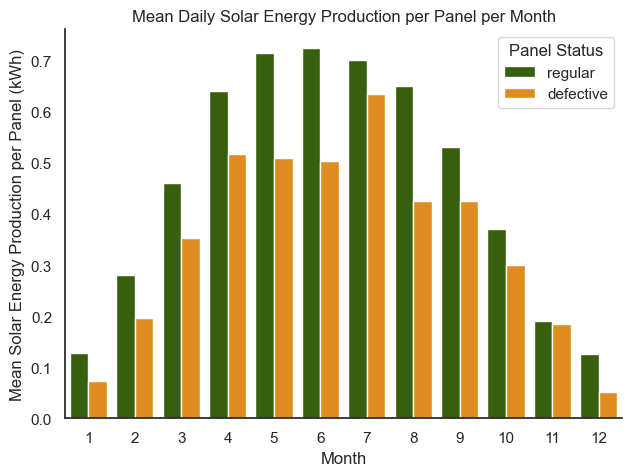

In [123]:
sns.barplot(data=viz_df, x="month", y="pv3", hue="pv3_defect", palette=("#376d00", "#ff9200"), errorbar=None,
            # estimator="mean"
).set(title="Mean Daily Solar Energy Production per Panel per Month", 
      xlabel="Month", 
      ylabel="Mean Solar Energy Production per Panel (kWh)")
plt.legend(title='Panel Status', loc='upper right', labels=['regular', 'defective'])
sns.despine()
plt.show()

2. Month-wise Defect Count

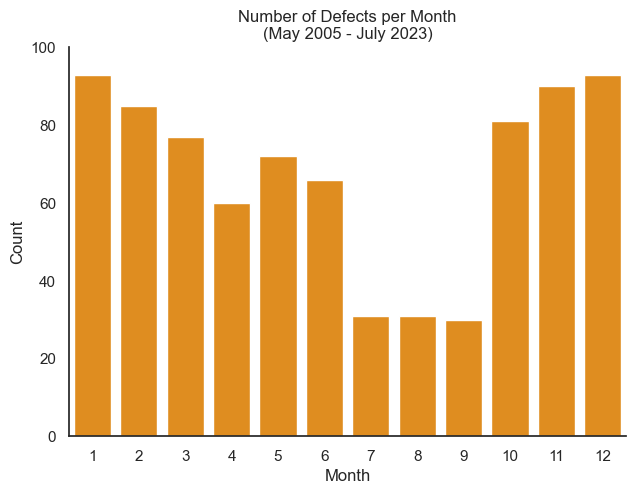

In [124]:
sns.countplot(data=viz_df[viz_df.pv3_defect == 1], x="month", color="#ff9200"
).set(ylim=(0,100), 
      title="Number of Defects per Month\n(May 2005 - July 2023)", 
      xlabel="Month", ylabel="Count")
sns.despine()
plt.show()

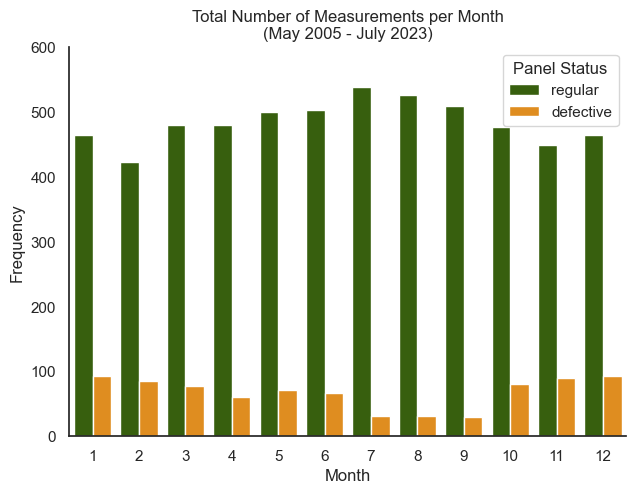

In [125]:
sns.countplot(data=viz_df, x="month", hue="pv3_defect", palette=("#376d00", "#ff9200")
).set(ylim=(0,600), 
      title="Total Number of Measurements per Month\n(May 2005 - July 2023)", 
      xlabel="Month", ylabel="Frequency")
plt.legend(title='Panel Status', loc='upper right', labels=['regular', 'defective'])
sns.despine()
plt.show()

3. Production vs. Sunshine - Defect vs. Regular

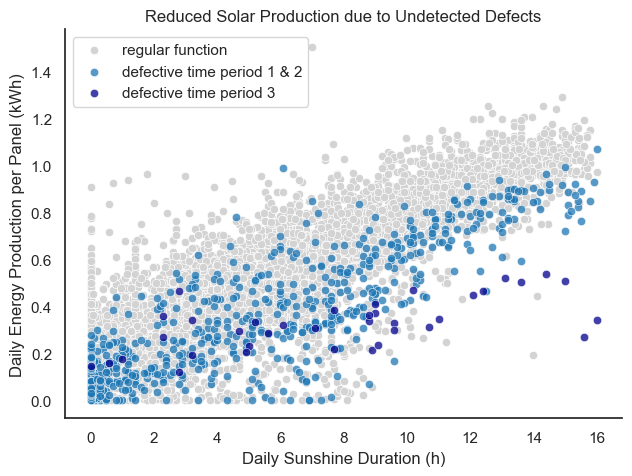

In [126]:
# sns.scatterplot(data=model_df_gr3, x="sunshine_duration", y="pv3", hue="pv3_defect", alpha=0.5)
fig, ax = plt.subplots()
sns.scatterplot(data=viz_df[viz_df.pv3_defect==0], x="sunshine_duration", y="pv3", 
                color="lightgray", alpha=0.99, label="regular function")
# sns.scatterplot(data=model_df_gr3[(model_df_gr3.pv3_defect==1)].query('index <= "2017.01.01"'), x="sunshine_duration", y="pv3", alpha=0.75)
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index<="2016-01-01")], 
                color="#1f77b4", x="sunshine_duration", y="pv3", alpha=0.75, label="defective time period 1 & 2")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2016-01-01")], 
                color="darkblue", x="sunshine_duration", y="pv3", alpha=0.75, label="defective time period 3")
ax.set_title("Reduced Solar Production due to Undetected Defects")
ax.set_xlabel("Daily Sunshine Duration (h)")
ax.set_ylabel("Daily Energy Production per Panel (kWh)")
sns.despine()
plt.show()

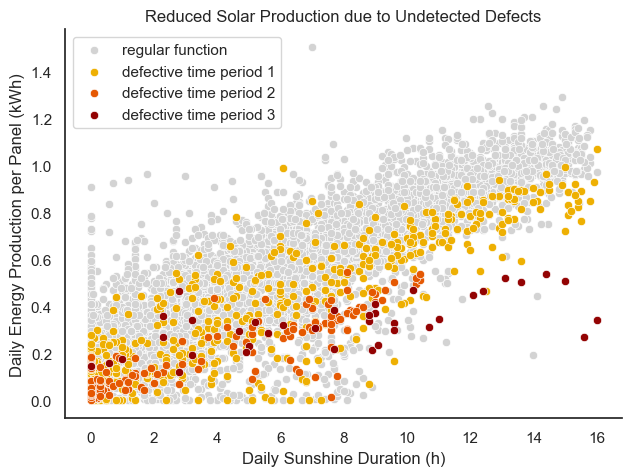

In [127]:
# sns.scatterplot(data=model_df_gr3, x="sunshine_duration", y="pv3", hue="pv3_defect", alpha=0.5)
fig, ax = plt.subplots()
sns.scatterplot(data=viz_df[model_df_gr3.pv3_defect==0], x="sunshine_duration", y="pv3", 
                color="lightgray", alpha=0.99, label="regular function")
# sns.scatterplot(data=model_df_gr3[(model_df_gr3.pv3_defect==1)].query('index <= "2017.01.01"'), x="sunshine_duration", y="pv3", alpha=0.75)
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index<="2011-08-01")], 
                color="#eeaf00", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 1")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2011-08-01") & (viz_df.index<="2016-01-01")], 
                color="#e55700", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 2") #ff9200 color slides
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2016-01-01")], 
                color="#920000", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 3")
# FFC300 FF5733 900C3F/95202e(cd0000)
ax.set_title("Reduced Solar Production due to Undetected Defects")
ax.set_xlabel("Daily Sunshine Duration (h)")
ax.set_ylabel("Daily Energy Production per Panel (kWh)")
sns.despine()
plt.show()

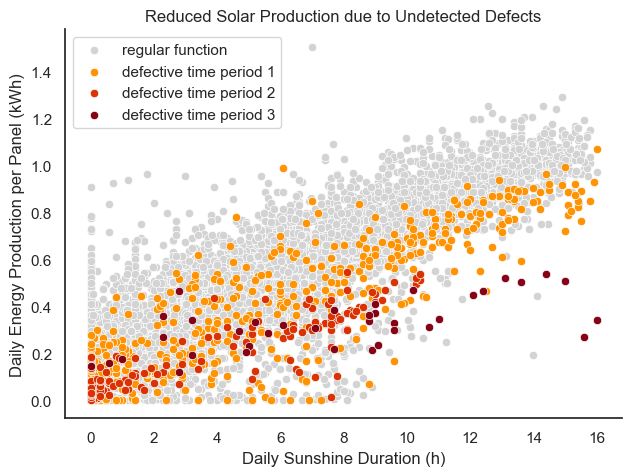

In [128]:
fig, ax = plt.subplots()
sns.scatterplot(data=viz_df[viz_df.pv3_defect==0], x="sunshine_duration", y="pv3", 
                color="lightgray", alpha=0.99, label="regular function")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index<="2011-08-01")], 
                color="#ff9200", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 1")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2011-08-01") & (viz_df.index<="2016-01-01")], 
                color="#db3000", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 2") #ff9200 color slides
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2016-01-01")], 
                color="#840013", x="sunshine_duration", y="pv3", alpha=0.99, label="defective time period 3")
ax.set_title("Reduced Solar Production due to Undetected Defects")
ax.set_xlabel("Daily Sunshine Duration (h)")
ax.set_ylabel("Daily Energy Production per Panel (kWh)")
sns.despine()
plt.show()

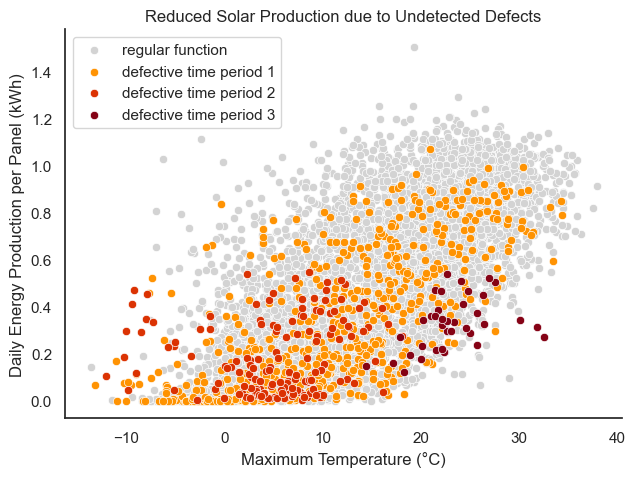

In [129]:
fig, ax = plt.subplots()
sns.scatterplot(data=viz_df[viz_df.pv3_defect==0], x="max_temperature", y="pv3", 
                color="lightgray", alpha=0.99, label="regular function")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index<="2011-08-01")], 
                color="#ff9200", x="max_temperature", y="pv3", alpha=0.99, label="defective time period 1")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2011-08-01") & (viz_df.index<="2016-01-01")], 
                color="#db3000", x="max_temperature", y="pv3", alpha=0.99, label="defective time period 2") #ff9200 color slides
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2016-01-01")], 
                color="#840013", x="max_temperature", y="pv3", alpha=0.99, label="defective time period 3")
ax.set_title("Reduced Solar Production due to Undetected Defects")
ax.set_xlabel("Maximum Temperature (°C)")
ax.set_ylabel("Daily Energy Production per Panel (kWh)")
sns.despine()
plt.show()

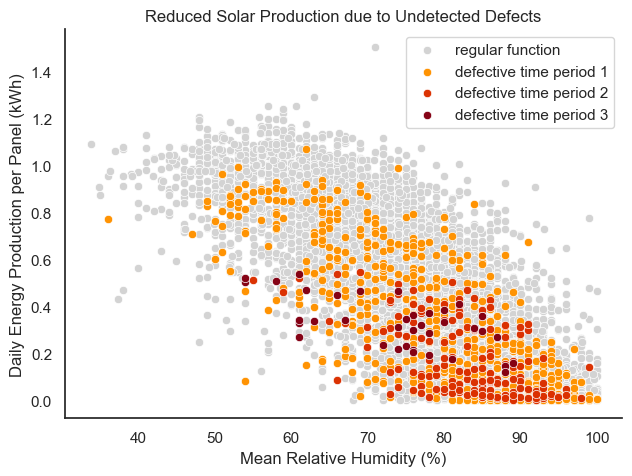

In [130]:
fig, ax = plt.subplots()
sns.scatterplot(data=viz_df[viz_df.pv3_defect==0], x="mean_relative_humidity", y="pv3", 
                color="lightgray", alpha=0.99, label="regular function")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index<="2011-08-01")], 
                color="#ff9200", x="mean_relative_humidity", y="pv3", alpha=0.99, label="defective time period 1")
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2011-08-01") & (viz_df.index<="2016-01-01")], 
                color="#db3000", x="mean_relative_humidity", y="pv3", alpha=0.99, label="defective time period 2") #ff9200 color slides
sns.scatterplot(data=viz_df[(viz_df.pv3_defect==1) & (viz_df.index>"2016-01-01")], 
                color="#840013", x="mean_relative_humidity", y="pv3", alpha=0.99, label="defective time period 3")
ax.set_title("Reduced Solar Production due to Undetected Defects")
ax.set_xlabel("Mean Relative Humidity (%)")
ax.set_ylabel("Daily Energy Production per Panel (kWh)")
sns.despine()
plt.show()

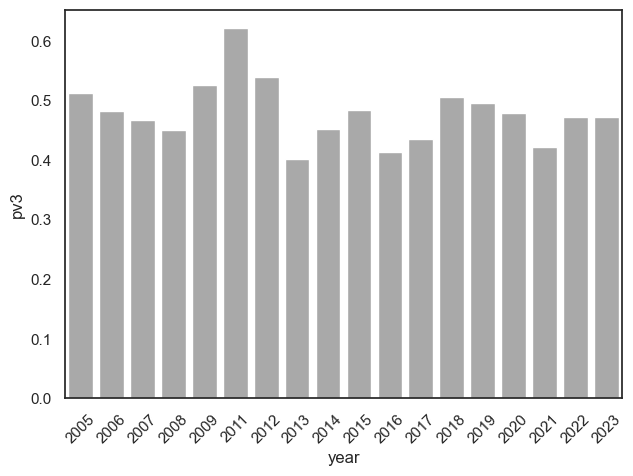

In [131]:
sns.barplot(data=viz_df[(viz_df.pv3_defect!=1)], x="year", y="pv3", estimator="mean", errorbar=None, color="darkgray")
plt.xticks(rotation=45)
plt.show()

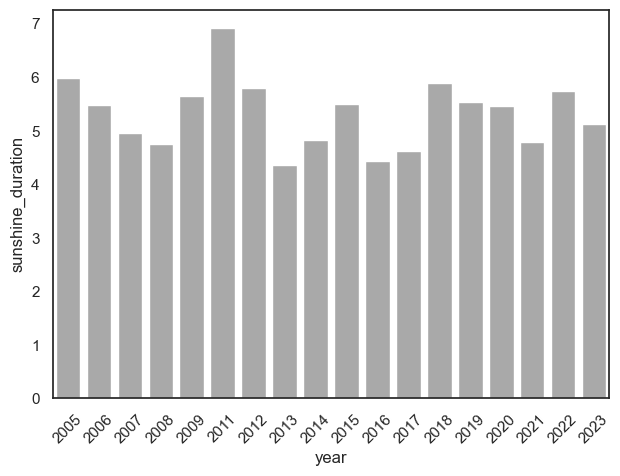

In [132]:
sns.barplot(data=viz_df[(viz_df.pv3_defect!=1)], x="year", y="sunshine_duration", 
            estimator="mean", errorbar=None, color="darkgray")
plt.xticks(rotation=45)
plt.show()

                   month  year
pv3                1      2005         NaN
                          2006    0.250880
                          2007    0.134238
                          2008    0.178152
                          2009    0.087023
                                    ...   
sunshine_duration  12     2019    2.261290
                          2020    2.600000
                          2021    1.819871
                          2022    1.187677
                          2023         NaN
Length: 456, dtype: float64


<Axes: >

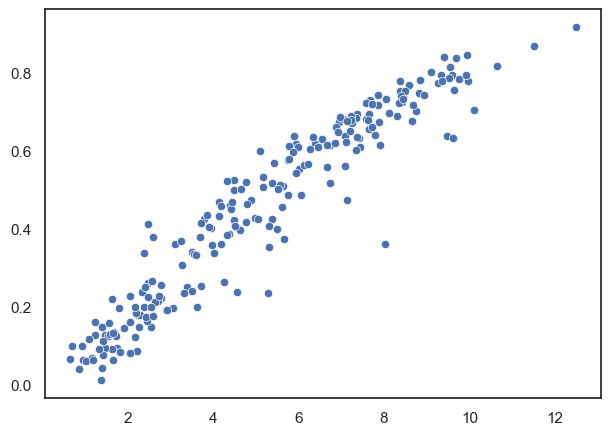

In [133]:
# compare monthly & yearwise mean energy production vs. sunshine duration
new_viz = viz_df.groupby(["year", "month"]).mean()[["pv3", "sunshine_duration"]].unstack().unstack()
print(new_viz)
sns.scatterplot(x=new_viz["sunshine_duration"], y=new_viz["pv3"])

4. Calculate Production Loss

In [134]:
# month-wise defect count
df_count_by_defect = viz_df.groupby(["month", "pv3_defect"]).count().pv3.unstack()
print(df_count_by_defect[1].sum(), "defective days in total - %.2f years" % (df_count_by_defect[1].sum()/365.25))
df_count_by_defect

# 805 defective days prior correction - now 809!

809 defective days in total - 2.21 years


pv3_defect,0,1
month,,
1,465,93
2,423,85
3,481,77
4,480,60
5,500,72
6,504,66
7,539,31
8,527,31
9,510,30


In [135]:
# month-wise daily loss in production 
df_pv3_by_defect = viz_df.groupby(["month", "pv3_defect"]).mean().pv3.unstack()
df_pv3_by_defect["loss"] = df_pv3_by_defect[0]-df_pv3_by_defect[1]
df_pv3_by_defect

pv3_defect,0,1,loss
month,,,
1,0.126965,0.072116,0.054848
2,0.280051,0.195909,0.084141
3,0.461709,0.353040,0.108668
4,0.639962,0.517159,0.122803
5,0.714723,0.509628,0.205095
6,0.725203,0.504752,0.220451
7,0.701935,0.634091,0.067844
8,0.651117,0.425513,0.225604
9,0.532103,0.424697,0.107406


In [136]:
# monthly loss
df_count_by_defect[1] * df_pv3_by_defect["loss"]

month
1      5.100909
2      7.152020
3      8.367468
4      7.368182
5     14.766855
6     14.549756
7      2.103179
8      6.993717
9      3.222193
10     5.842581
11     0.606818
12     6.981818
dtype: float64

In [137]:
# total loss per panel
(df_count_by_defect[1] * df_pv3_by_defect["loss"]).sum()

83.0554967104586

In [138]:
# total loss over full time period for 44 panels of group 3
(df_count_by_defect[1] * df_pv3_by_defect["loss"]).sum() * 44

3654.4418552601783

In [139]:
# total loss in Euro over full time period for 44 panels of group 3
# 54.53 cent guaranteed price acc. to EEG from 2004-07-21 
(df_count_by_defect[1] * df_pv3_by_defect["loss"]).sum() * 44 * .5453

1992.7671436733751

## Prepare Data for Modelling

### Modelling Options - Data Preprocessing

In [140]:
model_df_backup_gr3 = model_df_gr3.copy()
model_df_backup_gr1 = model_df_gr1.copy()

In [141]:
drop_new_sensor_data = False
aggregate_weekly = False

In [142]:
model_df_gr3 = model_df_backup_gr3.copy()
model_df_gr1 = model_df_backup_gr1.copy()

In [143]:
# drop time features 
model_df_gr3 = model_df_gr3.drop(columns=['year', 'month', 'week', 'weekday', 'day_of_year'])
model_df_gr1 = model_df_gr1.drop(columns=['year', 'month', 'week', 'weekday', 'day_of_year'])

In [144]:
# # optionally: aggregate data to weekly median
if aggregate_weekly:
    # group 3
    model_df_gr3 = model_df_gr3.resample('W', label='left').apply({
        # mean for most columns
        'pv3': 'mean',
        'max_windgust': 'mean',
        'mean_wind_velocity': 'mean',
        'precipitation_height': 'mean',
        'sunshine_duration': 'mean',
        'snow_depth': 'mean',
        'mean_cloud_cover': 'mean',
        'mean_vapor_pressure': 'mean',
        'mean_pressure': 'mean',
        'mean_temperature': 'mean',
        'mean_relative_humidity': 'mean',
        'max_temperature': ['mean', 'max'],
        'min_temperature': ['mean', 'min'],
        'min_air_temperature': ['mean', 'min'],

        # mode for categorical columns
        'pv3_defect': lambda x: stats.mode(x, keepdims=True)[0][0],
        'sensor': lambda x: stats.mode(x, keepdims=True)[0][0],
        'precipitation_form': lambda x: stats.mode(x, keepdims=True)[0][0],
        # 'year': lambda x: stats.mode(x, keepdims=True)[0][0],
        # 'month': lambda x: stats.mode(x, keepdims=True)[0][0],
        # 'week': lambda x: stats.mode(x, keepdims=True)[0][0],
        # 'weekday': 'median',
        # 'day_of_year': 'median',
        })

    # group 1
    model_df_gr1 = model_df_gr1.resample('W', label='left').apply({
        # mean for most columns
        'pv3': 'mean',
        'max_windgust': 'mean',
        'mean_wind_velocity': 'mean',
        'precipitation_height': 'mean',
        'sunshine_duration': 'mean',
        'snow_depth': 'mean',
        'mean_cloud_cover': 'mean',
        'mean_vapor_pressure': 'mean',
        'mean_pressure': 'mean',
        'mean_temperature': 'mean',
        'mean_relative_humidity': 'mean',
        'max_temperature': ['mean', 'max'],
        'min_temperature': ['mean', 'min'],
        'min_air_temperature': ['mean', 'min'],

        # mode for categorical columns
        'pv3_defect': lambda x: stats.mode(x, keepdims=True)[0][0],
        'sensor': lambda x: stats.mode(x, keepdims=True)[0][0],
        'precipitation_form': lambda x: stats.mode(x, keepdims=True)[0][0],
        })

model_df_gr3.head(2)

,pv3,pv3_defect,sensor,max_windgust,mean_wind_velocity,precipitation_height,precipitation_form,sunshine_duration,snow_depth,mean_cloud_cover,mean_vapor_pressure,mean_pressure,mean_temperature,mean_relative_humidity,max_temperature,min_temperature,min_air_temperature
date,,,,,,,,,,,,,,,,,
2005-05-18,0.000000,0,0,8.2,3.2,0.0,6,0.0,0.0,7.3,10.1,989.8,7.9,94.0,9.6,4.4,1.6
2005-05-19,0.731818,0,0,8.9,1.5,0.0,0,12.0,0.0,2.5,7.5,996.7,9.4,67.0,15.0,2.6,-0.1


In [145]:
# handle multi-index column names
if aggregate_weekly:
    new_columns = []
    for item in model_df_gr3.columns.map('_'.join):
        if not "_".join(item.split("_")[:-1]) in ["max_temperature", "min_temperature", "min_air_temperature"]:
            item = "_".join(item.split("_")[:-1])
        new_columns.append(item) # multiple aggregations made
    model_df_gr3.columns = new_columns
    model_df_gr3.to_csv(path+"Group3_defects_1_labelled_with_weather_weekly%s.csv" % rounding_tag)

    new_columns = []
    for item in model_df_gr1.columns.map('_'.join):
        if not "_".join(item.split("_")[:-1]) in ["max_temperature", "min_temperature", "min_air_temperature"]:
            item = "_".join(item.split("_")[:-1])
        new_columns.append(item) # multiple aggregations made
    model_df_gr1.columns = new_columns
    model_df_gr1.to_csv(path+"Group1_defects_1_labelled_with_weather_weekly%s.csv" % rounding_tag)

model_df_gr3.head(2)

,pv3,pv3_defect,sensor,max_windgust,mean_wind_velocity,precipitation_height,precipitation_form,sunshine_duration,snow_depth,mean_cloud_cover,mean_vapor_pressure,mean_pressure,mean_temperature,mean_relative_humidity,max_temperature,min_temperature,min_air_temperature
date,,,,,,,,,,,,,,,,,
2005-05-18,0.000000,0,0,8.2,3.2,0.0,6,0.0,0.0,7.3,10.1,989.8,7.9,94.0,9.6,4.4,1.6
2005-05-19,0.731818,0,0,8.9,1.5,0.0,0,12.0,0.0,2.5,7.5,996.7,9.4,67.0,15.0,2.6,-0.1


In [146]:
# optionally: omit new data since new sensor was installed
if drop_new_sensor_data:
    # group 3
    model_df_gr3 = model_df_gr3[model_df_gr3.sensor==0]
    model_df_gr3.drop(columns="sensor", inplace=True)
    # group 1
    model_df_gr1 = model_df_gr1[model_df_gr1.sensor==0]
    model_df_gr1.drop(columns="sensor", inplace=True)


### Dummify Categorical Data

In [147]:
# convert categorical column into dummy columns - group 3
precipitation_form_dummies = pd.get_dummies(model_df_gr3['precipitation_form'], prefix='precip', drop_first=True)
model_df_gr3 = model_df_gr3.drop(['precipitation_form'], axis=1)
model_df_gr3 = pd.concat([model_df_gr3, precipitation_form_dummies], axis=1)
model_df_gr3.columns 


Index(['pv3', 'pv3_defect', 'sensor', 'max_windgust', 'mean_wind_velocity',
       'precipitation_height', 'sunshine_duration', 'snow_depth',
       'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure',
       'mean_temperature', 'mean_relative_humidity', 'max_temperature',
       'min_temperature', 'min_air_temperature', 'precip_4', 'precip_6',
       'precip_7', 'precip_8'],
      dtype='object')

In [148]:
# convert categorical column into dummy columns - group 1
precipitation_form_dummies = pd.get_dummies(model_df_gr1['precipitation_form'], prefix='precip', drop_first=True)
model_df_gr1 = model_df_gr1.drop(['precipitation_form'], axis=1)
model_df_gr1 = pd.concat([model_df_gr1, precipitation_form_dummies], axis=1)
model_df_gr1.columns 


Index(['pv1', 'pv1_defect', 'sensor', 'max_windgust', 'mean_wind_velocity',
       'precipitation_height', 'sunshine_duration', 'snow_depth',
       'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure',
       'mean_temperature', 'mean_relative_humidity', 'max_temperature',
       'min_temperature', 'min_air_temperature', 'precip_4', 'precip_6',
       'precip_7', 'precip_8'],
      dtype='object')

In [149]:
# write data to file
if drop_new_sensor_data and aggregate_weekly:
    num = 3
    tag = "weekly_old"
elif drop_new_sensor_data:
    num = 1
    tag = "daily_old"
elif aggregate_weekly:
    num = 2
    tag = "weekly_all"
else:
    num = 0
    tag = "daily_all"
filename = "Group3_defects_2_modelling_%d_%s_unscaled%s.csv" % (num, tag, rounding_tag)
filename_gr1 = "Group1_defects_2_modelling_%d_%s_unscaled%s.csv" % (num, tag, rounding_tag)
    
model_df_gr3.to_csv(path+filename)
model_df_gr1.to_csv(path+filename_gr1)

In [150]:
model_df = model_df_gr3.copy()

### Define X and y for Modelling

In [151]:
# Define features and target
X = model_df.copy()
X.drop(columns=["pv3_defect"], inplace=True)
y = model_df['pv3_defect']
# y = model_df[abs(model_df['pv3']) != float("inf")]['pv3_defect']

# Split data into train and test sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, 
                                                    random_state=RSEED)

### Feature Scaling

In [152]:
# scale features
scaler = StandardScaler().set_output(transform="pandas")
num_columns = ['pv3', 'max_windgust', 'mean_wind_velocity', 'precipitation_height', 'sunshine_duration',
               'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure', 'mean_temperature', 
               'mean_relative_humidity', 'max_temperature', 'min_temperature', 'min_air_temperature']
num_columns_agg = ['pv3', 'max_windgust', 'mean_wind_velocity', 'precipitation_height', 'sunshine_duration', 
               'snow_depth', 'mean_cloud_cover', 'mean_vapor_pressure', 'mean_pressure', 'mean_temperature',
               'mean_relative_humidity', 'max_temperature_mean', 'max_temperature_max',
               'min_temperature_mean', 'min_temperature_min', 'min_air_temperature_mean', 'min_air_temperature_min',]
cat_columns = ['sensor', 'precipitation_form', 'precip_4', 'precip_6', 'precip_7', 'precip_8']
if "min_temperature_min" in X_train.columns:
    X_train[num_columns_agg] = scaler.fit_transform(X_train[num_columns_agg])
    X_test[num_columns_agg] = scaler.transform(X_test[num_columns_agg])
else:
    X_train[num_columns] = scaler.fit_transform(X_train[num_columns])
    X_test[num_columns] = scaler.transform(X_test[num_columns])

## Modelling - Classification with Weather Data

### LogReg Model

Recall Train:   0.12364760432766615
F1 Score Train: 0.19184652278177458
AUC Train:      0.5503357197073161
Recall Test:   0.19135802469135801
F1 Score Test: 0.2743362831858407
AUC Test:      0.5815037546137202


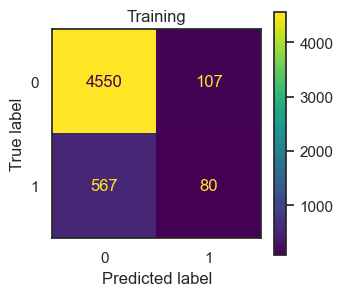

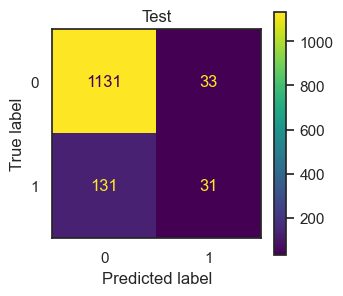

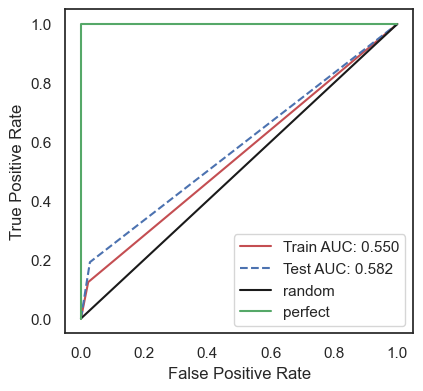

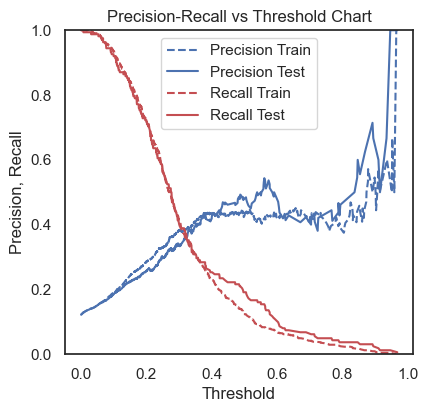

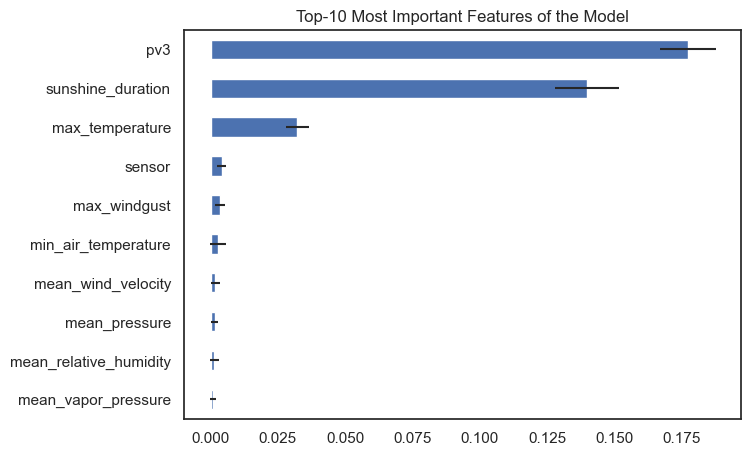

In [153]:
# initialize & fit model
model = LogisticRegression(class_weight={0:.4, 1:.6})
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

### Random Forest Model

- issue: random forest is sensitive to data imbalance!
- see [here](https://stats.stackexchange.com/questions/242833/is-random-forest-a-good-option-for-unbalanced-data-classification)

Recall Train:   0.17619783616692428
F1 Score Train: 0.29960578186596587
AUC Train:      0.5880989180834622
Recall Test:   0.09876543209876543
F1 Score Test: 0.17391304347826084
AUC Test:      0.5468053964617539


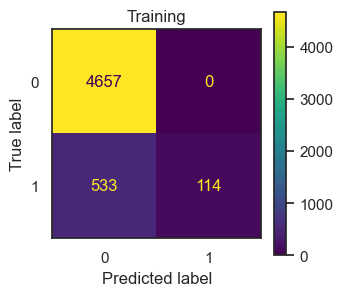

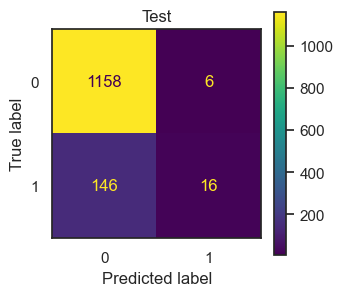

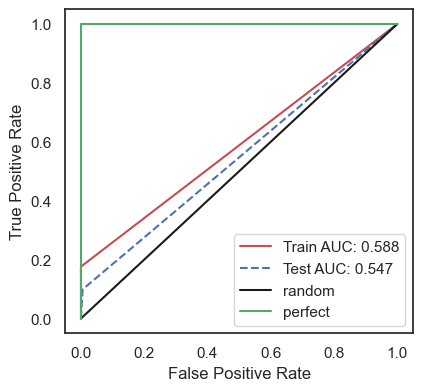

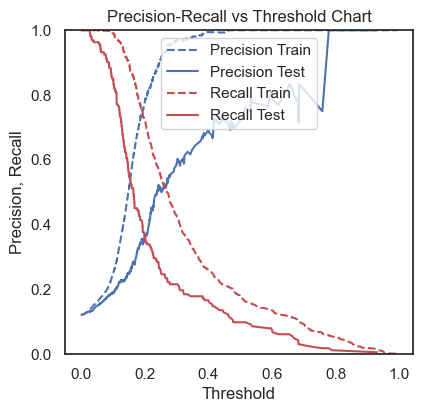

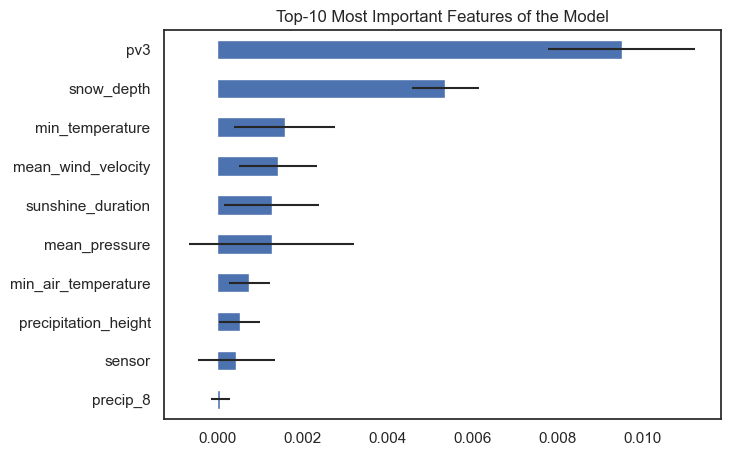

In [154]:
# initialize & fit model
model = RandomForestClassifier(n_estimators=40, random_state=42, max_depth=10, max_features='sqrt',)
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

### Random Forest Undersampling

- according to [this description](https://machinelearningmastery.com/bagging-and-random-forest-for-imbalanced-classification/)

/Users/kathse/Documents/NeueFische/4_Capstone/capstone_solar_energy/.venv/lib/python3.11/site-packages/imblearn/ensemble/_forest.py:546: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/kathse/Documents/NeueFische/4_Capstone/capstone_solar_energy/.venv/lib/python3.11/site-packages/imblearn/ensemble/_forest.py:558: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/kathse/Documents/NeueFische/4_Capstone/capstone_solar_energy/.venv/lib/python3.11/site-packages/imblearn/ensemble/_forest.py:546: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'a

Mean Recall: 0.623
Recall Train:   0.9829984544049459
F1 Score Train: 0.5719424460431655
AUC Train:      0.8904685207390846
Recall Test:   0.5802469135802469
F1 Score Test: 0.3230240549828179
AUC Test:      0.6500890925289551


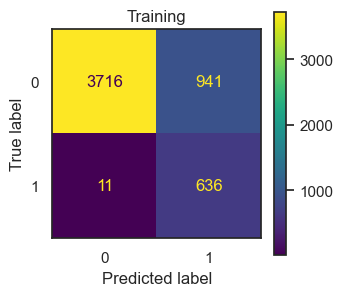

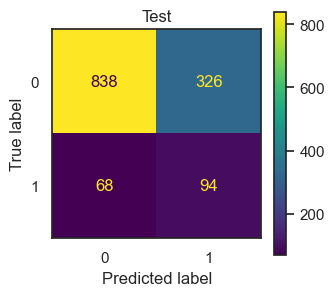

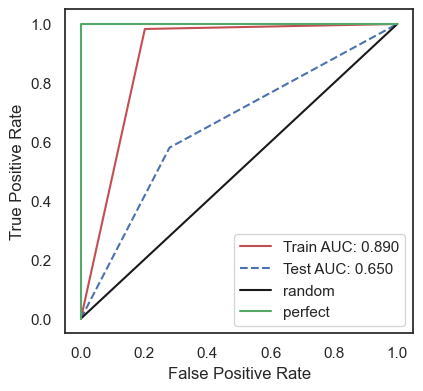

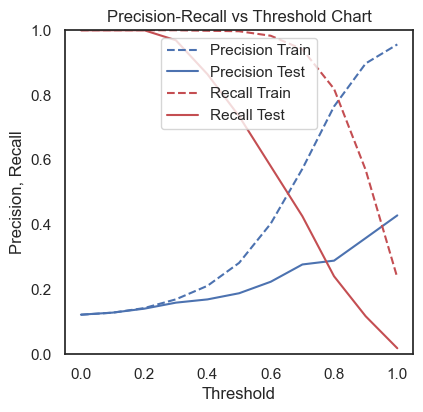

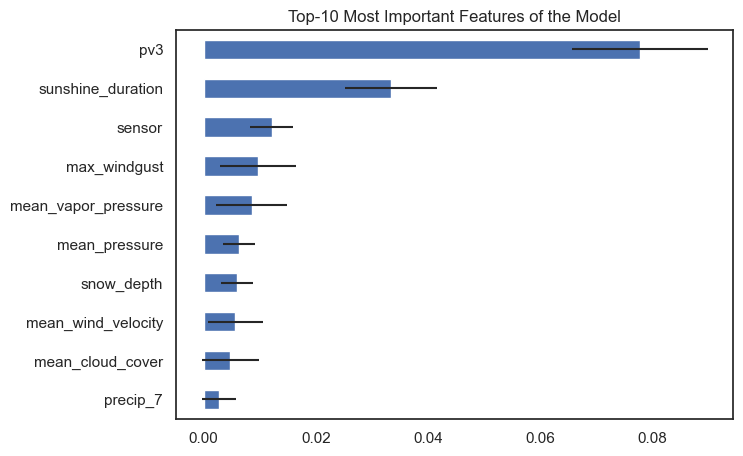

In [155]:
# random forest with random undersampling for imbalanced classification
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.ensemble import BalancedRandomForestClassifier

# define model
model = BalancedRandomForestClassifier(n_estimators=10, random_state=42)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='recall', cv=cv, n_jobs=-1)
# summarize performance
print('Mean Recall: %.3f' % mean(scores))

# fit and evaluate model
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

### KNN Model

Recall Train:   0.2704791344667697
F1 Score Train: 0.39592760180995473
AUC Train:      0.6285829213240011
Recall Test:   0.1728395061728395
F1 Score Test: 0.2545454545454546
AUC Test:      0.5735331551482754


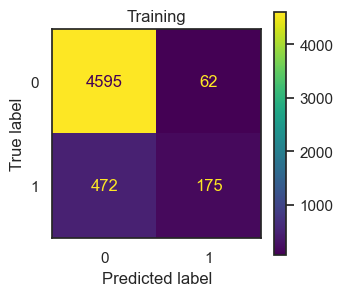

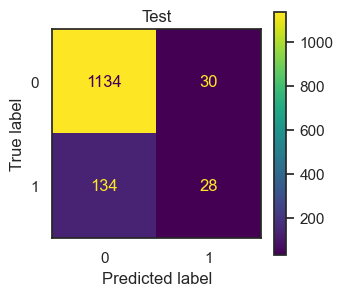

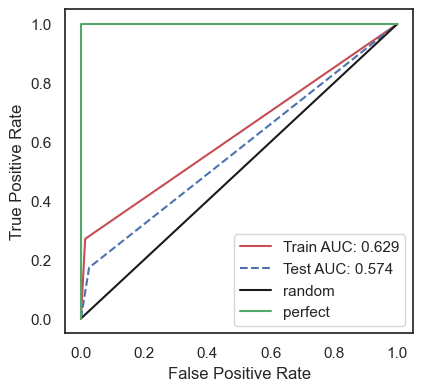

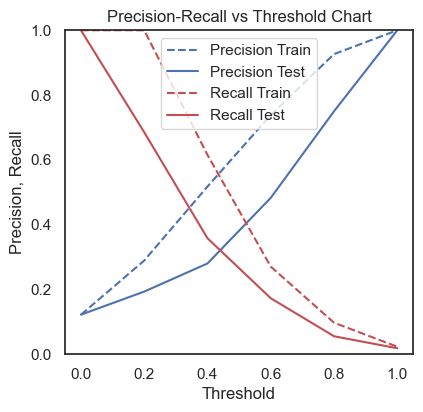

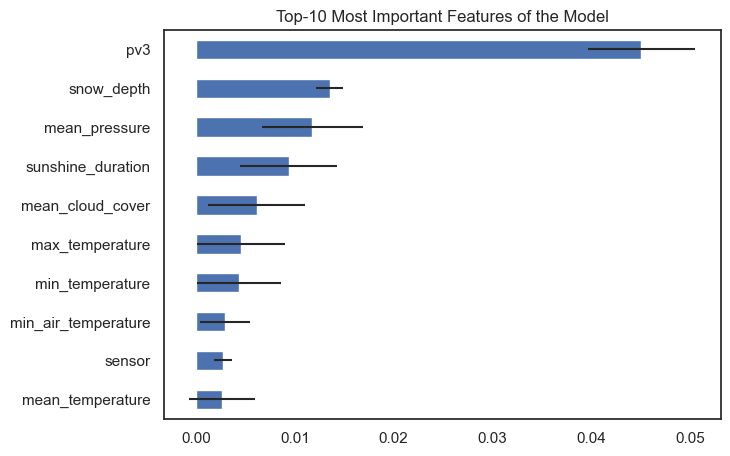

In [156]:
# initialize & fit model
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

### XGboost

Recall Train:   1.0
F1 Score Train: 0.9383611312545322
AUC Train:      0.990873953188748
Recall Test:   0.3765432098765432
F1 Score Test: 0.3777089783281733
AUC Test:      0.6453162784777905


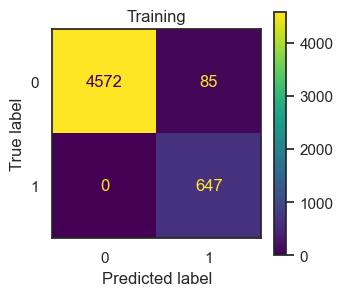

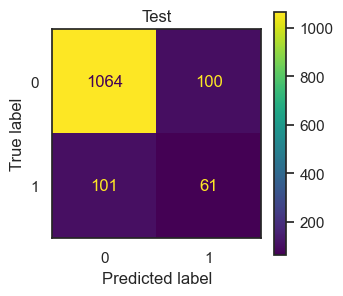

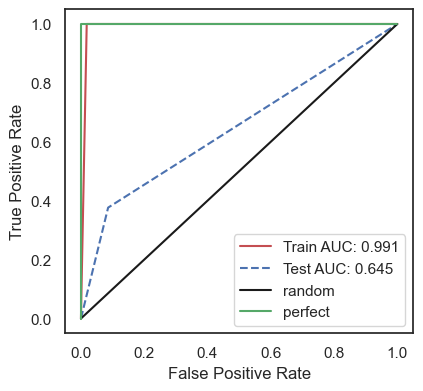

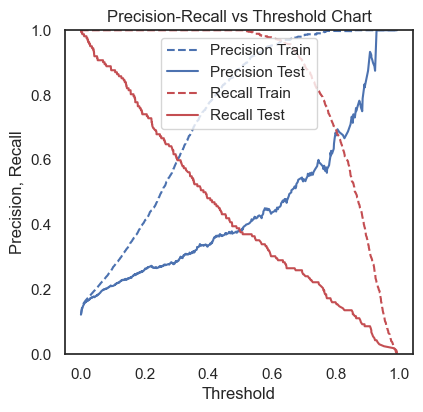

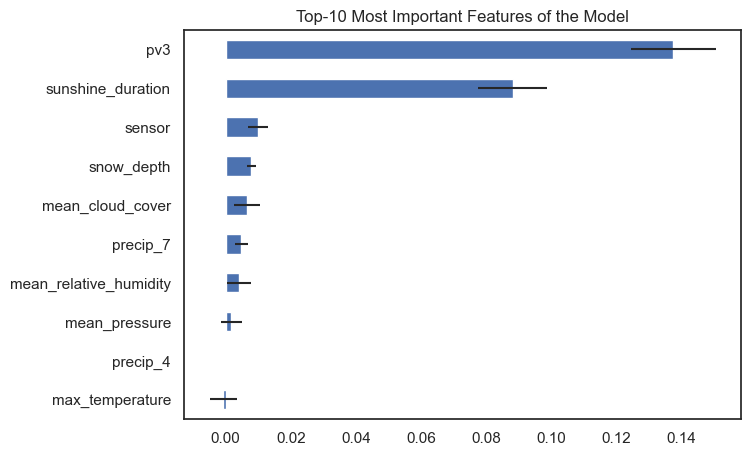

In [157]:
# initialize & fit model
model = XGBClassifier(scale_pos_weight=5, max_depth=5, reg_alpha=0.6, reg_lambda=0.6,
                      n_estimators=1000, learning_rate=0.03, )
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

# for class imbalance: estimate = target_count[0] / target_count[1]
# 5825/805 = 7.236024844720497

Recall Train:   0.31530139103554866
F1 Score Train: 0.44687842278203727
AUC Train:      0.6509940496083906
Recall Test:   0.17901234567901234
F1 Score Test: 0.2555066079295154
AUC Test:      0.574042255313733


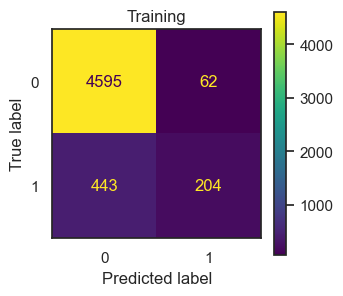

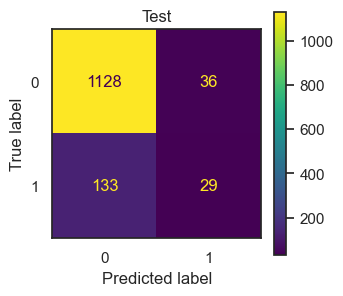

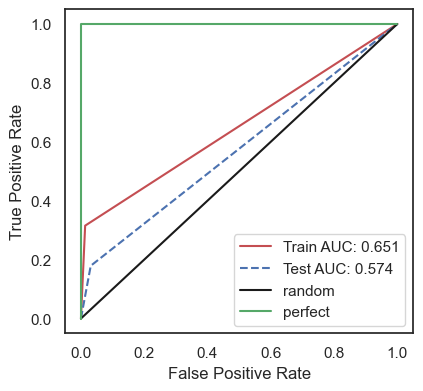

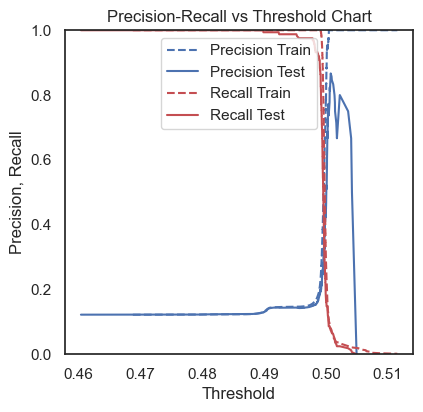

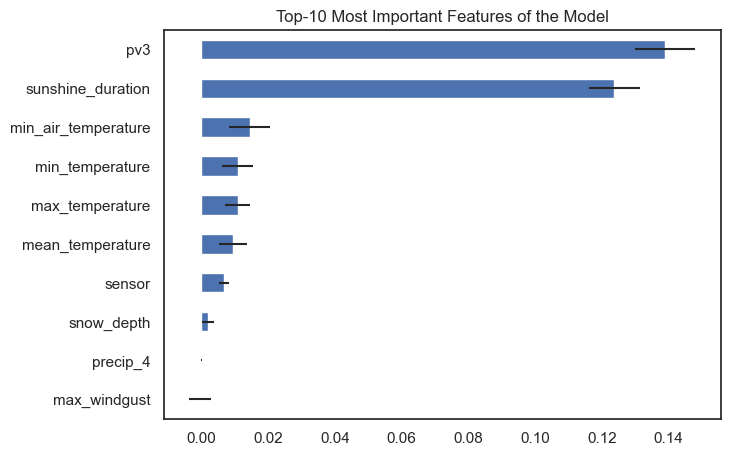

In [158]:
model = AdaBoostClassifier(n_estimators=1000,
                           learning_rate=1,
                           random_state=RSEED)
model.fit(X_train, y_train)
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=False)

### ANN

In [159]:
metrics = [
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
      'accuracy']

In [160]:
# to prevent error due to data type:
#   ValueError: Failed to convert a NumPy array to a 
#               Tensor (Unsupported object type float).
X_train = np.asarray(X_train).astype('float32')
X_test = np.asarray(X_test).astype('float32')

# initialising NN
model = Sequential()

# layers: units = number of neurons, input_dim = number of input features
# it is essential to initialize with the correct values to avoid this problem mentioned above (kernel_initializer)
model.add(Dense(units=15, kernel_initializer='uniform', activation='relu', input_dim=X.shape[1])) 
model.add(Dense(units=15, kernel_initializer='uniform', activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(units=1, kernel_initializer='uniform', activation='sigmoid'))
# sigmoid: get value between 0-1 as probability for classification

# compiling the ANN
# cross-entropy: also referred to as Logarithmic loss
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=metrics)
# model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
print(model.summary())

# Train the ANN
training = model.fit(X_train, y_train, batch_size=48, validation_split=0.2, epochs=200)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 15)                300       
                                                                 
 dense_1 (Dense)             (None, 15)                240       
                                                                 
 dropout (Dropout)           (None, 15)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 16        
                                                                 
Total params: 556 (2.17 KB)
Trainable params: 556 (2.17 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None
Epoch 1/200
89/89 [==============================] - 1s 2ms/step - loss: 0.5933 - precision: 0.5000 - recall: 0.0019 - auc: 0.4918 - accuracy: 0.8753 - val_loss: 0.3854 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5835 - val_accuracy: 0.8888
Epoch 2/200
89/89 [==============================] - 0s 792us/step - loss: 0.3742 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6028 - accuracy: 0.8753 - val_loss: 0.3274 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6857 - val_accuracy: 0.8888
Epoch 3/200
89/89 [==============================] - 0s 772us/step - loss: 0.3624 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6514 - accuracy: 0.8753 - val_loss: 0.3206 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.7148 - val_accuracy: 0.8888
Epoch 4/200
89/89 [==============================] - 0s 819us/step - loss: 0.3503 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6897 - accuracy: 0.8753 - val_loss: 0.3127 - val_p

42/42 [==============================] - 0s 308us/step
Recall Train:   0.19319938176197837
F1 Score Train: 0.29691211401425177
AUC Train:      0.5890841229187818
Recall Test:   0.19135802469135801
F1 Score Test: 0.2857142857142857
AUC Test:      0.5853697339951636


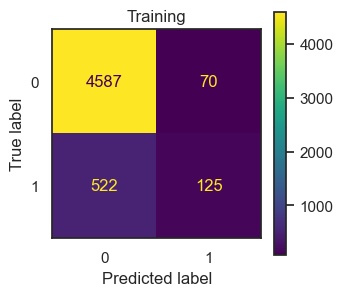

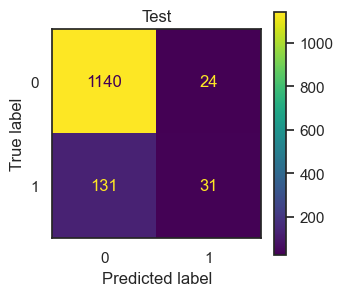

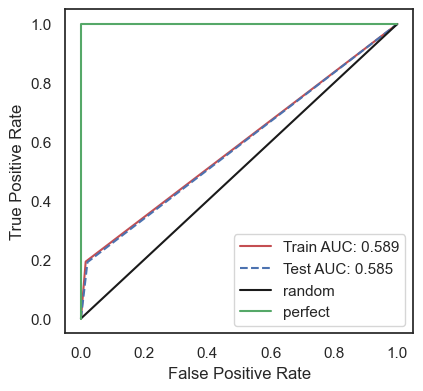

166/166 [==============================] - 0s 296us/step


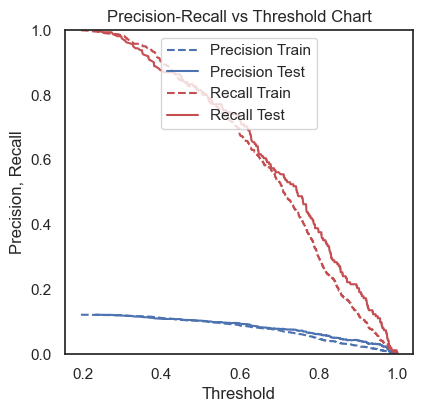

Couldn't extract feature importance!


In [161]:
evaluate_model(y_train, y_test, X_train, X_test, model, neuralnet=True)

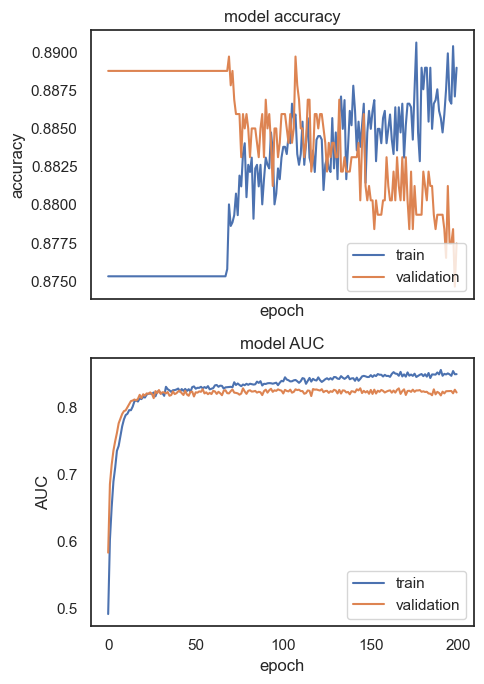

/var/folders/7l/jfv_5v6d6b9gm5rq3d9zbm9w0000gn/T/ipykernel_96913/2160614719.py:31: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,2,n+1)


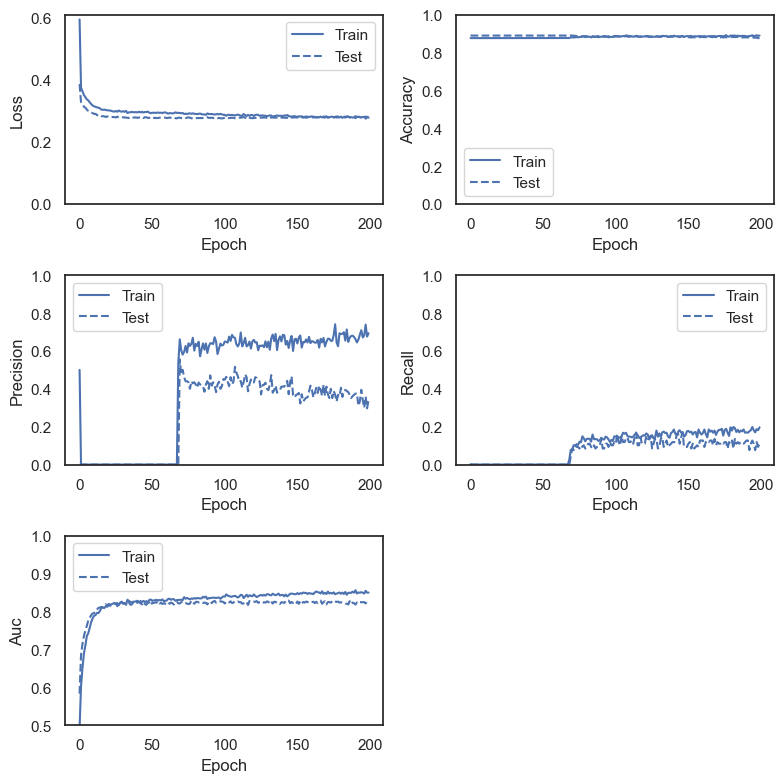

In [162]:
plot_ann_metrics(training)

### AdaBoost

## Summary

### General 

- higher fluctuations at the end of the timeline due to new counter with lower precision

### Error Metrics

- errors relative to the mean more suitable than to the max
    - small neg and positive fluctuations
    - errors disappear for rolling average
>
- absolute vs. relative vs. weighted
    - absolute error works well in summer for higher productions
    - relative error better to see errors in winter - but generally very noisy in winter
    - weighted error works has less noise, but also not good in winter
>
- rolling average reduces noise very well
    - 30 days good to detect small changes (e.g. one defective panel in winter)
    - 5/10 day absolute errors already suitable to identify drastic defects

### Defect Labelling

- semi-automated labelling finished

- time ranges with defects for group 3 (H)
    - starting point for 1st defect hard to identify - due to low sunshine during winter time (but different metrics agree here)
    - end points match with reported repairs (one has no repair listed, but might have been repaired - very likely)

        ```py 
        # defective time ranges including first and last day
        defect_ranges3 = [(datetime(2009,10, 4), datetime(2011,6, 9)),
                          (datetime(2011,10,10), datetime(2012,3,15)),
                          (datetime(2016, 5,22), datetime(2016,6,27))]
        defect_ranges1 = [(datetime(2013, 2, 1), datetime(2013,2,18)),]

        ```
        ```py
        # known repairs
        repairs_group3 = ["09.06.2011", "27.06.2016",]
        repairs_group1 = ["17.02.2013",]
        ```

### Modelling (Defect Classification)

- modelling steps
    - scaling before modelling
    - improved metrics and plots for model evaluation
    - improved data aggregation to derive weekly data (with less variation)
>
- possible hurdles for modelling:
    - data imbalance
    - maybe because it is generally hard to predict?
>
- best modelling results:
    - daily:
        - XGboost: good values on test, but also clearly overfitting on train
        - ANN: slightly worse than XGboost on test, not so overfitting
    - weekly:
        - slightly better results
        - both XGboost and ANN similarly good for full data, for old data
        - for old sensor: ANN better and also logreg quite good

<br>

*Note: Metrics below are mostly from slightly inaccurate labelling of the boundary cases*

<br>


Model | Time Scale | Recall Train | F1 Train | AUC Train | Recall Test | F1 Test | AUC Test
--- | --- | --- | --- | --- | --- | --- | --- 
LogReg | Daily | 0.12577639751552794 | 0.19612590799031476 | 0.5520512888865193 | 0.13043478260869565 | 0.19534883720930232 | 0.5510543011755924
RF | Daily | 0.16614906832298137 | 0.2849533954727031 | 0.5830745341614907 | 0.08074534161490683 | 0.14054054054054052 | 0.535651640764535
**RF Balanced Undersampling** | Daily | 0.9813664596273292 | 0.5610297381269419 | 0.885854903633407 | 0.6583850931677019 | 0.3486842105263158 | 0.6828406152533789
KNN | Daily | 0.2841614906832298 | 0.41496598639455784 | 0.6361794577879668 | 0.16770186335403728 | 0.2297872340425532 | 0.5636792578572761
**XGboost** | Daily | 0.9953416149068323 | 0.934402332361516 | 0.9883360435049183 | 0.4161490683229814 | 0.39067055393586003 | 0.658718310985525
AdaBoost | Daily | 0.31211180124223603 | 0.44816053511705684 | 0.6504765014794871 | 0.18633540372670. | 0.2752293577981651 | 0.5815797190.359
ANN | Daily | 0.23136645962732919 | 0.3473193473193473 | 0.608708980886626 | 0.16149068322981366 | 0.24186046511627907 | 0.5687281742329326
|  |  |  |  |  |  |  
LogReg | Daily old | 0.14596273291925466 | 0.22117647058823528 | 0.5593626894168257 | 0.17391304347826086 | 0.24778761061946905 | 0.5689604127897141
RF | Daily old | 0.2453416149068323 | 0.39401496259351615 | 0.6226708074534162 | 0.08695652173913043 | 0.14893617021276595 | 0.5371553036711216
KNN | Daily old | 0.2701863354037267 | 0.4009216589861751 | 0.6290134011648985 | 0.18012422360248448 | 0.25 | 0.56963409623704
XGboost | Daily old | 0.9984472049689441 | 0.9561338289962825 | 0.9921710733015927 | 0.37267080745341613 | 0.3669724770642202 | 0.6347789834932451
ANN | Daily old | 0.21739130434782608 | 0.33492822966507174 | 0.6023726949754695 | 0.17391304347826086 | 0.2629107981220657 | 0.5752833699881577
|  |  |  |  |  |  |  
LogReg | Weekly | 0.25274725274725274 | 0.3709677419354839 | 0.6188773744995634 | 0.34782608695652173 | 0.4705882352941176 | 0.664931007550117
RF | Weekly | 0.5934065934065934 | 0.7448275862068965 | 0.7967032967032968 | 0.043478260869565216 | 0.08 | 0.5187451184587346
KNN | Weekly | 0.14285714285714285 | 0.23214285714285715 | 0.565431569929321 | 0.08695652173913043 | 0.14285714285714285 | 0.5344962249414215
XGboost | Weekly | 1.0 | 1.0 | 1.0 | 0.5217391304347826 | 0.5454545454545454 | 0.7339234574329602
ANN | Weekly | 0.6703296703296703 | 0.7393939393939393 | 0.8254197077285532 | 0.5217391304347826 | 0.5581395348837209 | 0.736917469409008
|  |  |  |  |  |  |  
LogReg | Weekly old | 0.2087912087912088 | 0.3220338983050847 | 0.5976044329185246 | 0.43478260869565216 | 0.5714285714285714 | 0.7105885832593907
RF | Weekly old | 0.7912087912087912 | 0.8834355828220859 | 0.8956043956043955 | 0.043478260869565216 | 0.07407407407407408 | 0.5115350488021295
KNN | Weekly old | 0.16483516483516483 | 0.2654867256637168 | 0.5764753073751376 | 0.043478260869565216 | 0.08333333333333333 | 0.5217391304347826
XGboost | Weekly old | 1.0 | 1.0 | 1.0 | 0.2608695652173913 | 0.37500000000000006 | 0.6202307009760426
ANN | Weekly old | 0.6593406593406593 | 0.736196319018405 | 0.8194835724547099 | 0.4782608695652174 | 0.55 | 0.7187222715173025

<br>

Model | Time Scale | Recall Train | F1 Train | AUC Train | Recall Test | F1 Test | AUC Test
--- | --- | --- | --- | --- | --- | --- | --- 
LogReg | Daily | 0.12577639751552794 | 0.19612590799031476 | 0.5520512888865193 | 0.13043478260869565 | 0.19534883720930232 | 0.5510543011755924
LogReg Squared | Daily | 0.14285714285714285 | 0.21852731591448926 | 0.5600551808706316 | 0.16149068322981366 | 0.2407407407407407 | 0.5682989896835764
LogReg Log | Daily | 0.06478405315614617 | 0.10985915492957746 | 0.5248691308083391 | 0.04 | 0.06936416184971099 | 0.512595818815331
|  |  |  |  |  |  |  
RF | Daily | 0.16614906832298137 | 0.2849533954727031 | 0.5830745341614907 | 0.08074534161490683 | 0.14054054054054052 | 0.535651640764535
RF Squared | Daily | 0.16614906832298137 | 0.2849533954727031 | 0.5830745341614907 | 0.08074534161490683 | 0.14130434782608695 | 0.5360808253138912
RF Log | Daily | 0.18438538205980065 | 0.31136044880785413 | 0.5921926910299004 | 0.04666666666666667 | 0.08641975308641976 | 0.5211556329849013
|  |  |  |  |  |  |  
KNN | Daily | 0.2841614906832298 | 0.41496598639455784 | 0.6361794577879668 | 0.16770186335403728 | 0.2297872340425532 | 0.5636792578572761
KNN Squared | Daily | 0.2857142857142857 | 0.4153498871331828 | 0.6366339668914776 | 0.16770186335403728 | 0.23175965665236056 | 0.5645376269559886
KNN Log | Daily | 0.22591362126245848 | 0.34256926952141054 | 0.606851272035503 | 0.09333333333333334 | 0.14583333333333334 | 0.5344715447154471
|  |  |  |  |  |  |  
XGboost | Daily | 0.9953416149068323 | 0.934402332361516 | 0.9883360435049183 | 0.4161490683229814 | 0.39067055393586003 | 0.658718310985525
XGboost Squared | Daily | 0.9953416149068323 | 0.934402332361516 | 0.9883360435049183 | 0.4161490683229814 | 0.39067055393586003 | 0.658718310985525
XGboost Log | Daily | 0.9983388704318937 | 0.9494470774091628 | 0.9923007042957548 | 0.29333333333333333 | 0.3271375464684015 | 0.6140011614401859
|  |  |  |  |  |  |  
ANN | Daily | 0.23136645962732919 | 0.3473193473193473 | 0.608708980886626 | 0.16149068322981366 | 0.24186046511627907 | 0.5687281742329326
ANN Squared | Daily | 0.20341614906832298 | 0.3175757575757576 | 0.5963432676672087 | 0.19875776397515527 | 0.29223744292237447 | 0.5882200837043158
ANN Log | Daily | 0.21926910299003322 | 0.33545108005082597 | 0.6038560953240615 | 0.13333333333333333 | 0.2127659574468085 | 0.5588269454123113

<br>

### Log and Square to Reduce Noise (esp. in Winter)

- no clear improvement by log or square transformation on modeling
- more effect on error metrics
    - log: slightly more noise in winter
    - squared: slightly less noise in winter
    - ok for short averaging window, not informative for long averaging window

### Rounding to Reduce Noise (esp. in Winter)

- tried with different rounding of the production per panel
    - 0 digits before calculating production per panel
    - rounding 1-3 digits after calculating daily production per panel
    - rounded for 1-3 digits - for daily modelling with all data
>
- effect on modelling
    - 0 digits before: slightly worse (except for ANN), also different effect on the groups due to different range of total production values
    - 3 digits: almost no effect  
    - 2 digits: very slight effect (metrics changed maybe at 4th digit)
    - 1 digit: slight improvement (maybe at 2nd digit)
    - generally: tendency to improve the model, but very slightly
    - strongest effect for ANN in all cases - maybe 2% improvement (but here also there is generally potential for hyperparameter tuning)
>
- effect on error metrics
    - stronger effect on error metrics 
    - especially metrics relative to max were smoother  
      (but still noisy and more noisy than errors relative to mean)
    - some smoothing observed (esp. for relative error - but still strong fluctuations in winter)

## Outlook

- model fine tuning 
    - focus on XGboost, Balanced Random Forest (and ANN) - best results so far
